In [1]:
import argparse
import logging
import numpy as np
import pyvista as pv

from pathlib import Path
from pointcept.supplemental.utils import disable_trame_logger
from pointcept.supplemental.mesh_processing import DataHandler, set_data_root, MeshAnalyser
from pointcept.supplemental.fold_allocation import (
    GridSplitter,
    process_folds,
    plot_mesh_folds,
    persist_best_iteration,
    load_best_iteration,
    crop_meshes_per_fold,
    save_splits
)

# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s', datefmt='%H:%M:%S')
logger = logging.getLogger(__name__)

label = 'rog_south'

set_data_root("../../data")

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
dh = DataHandler(label)
dh.ensure_meshes()

13:12:14 - INFO - Label rog_south already has extracted meshes.


In [3]:
analyser = MeshAnalyser(data_handler=dh)

In [4]:
to_exclude = []
pcds = analyser.generate_toy_pcds(resolution=0.15, excluded_categories=to_exclude)

13:12:17 - INFO - Generating toy pointclouds for categories ['1_WALL', '2_FLOOR', '3_ROOF', '4_CEILING', '5_FOOTPATH', '7_COLUMN', '8_DOOR', '9_WINDOW', '10_STAIR', '11_RAILING', '12_RWP', '13_OTHER'].
13:12:17 - INFO - Sampling with resolution 0.15.
13:12:17 - INFO - Number of points after initial sampling: 5515655
13:12:20 - INFO - Number of points after Poisson Disk Sampling: 481633
13:12:20 - INFO - Number of points after initial sampling: 696084
13:12:20 - INFO - Number of points after Poisson Disk Sampling: 140256
13:12:20 - INFO - Number of points after initial sampling: 378012
13:12:20 - INFO - Number of points after Poisson Disk Sampling: 44007
13:12:20 - INFO - Number of points after initial sampling: 1553631
13:12:21 - INFO - Number of points after Poisson Disk Sampling: 83679
13:12:21 - INFO - Number of points after initial sampling: 750448
13:12:21 - INFO - Number of points after Poisson Disk Sampling: 145095
13:12:21 - INFO - Number of points after initial sampling: 38353

In [5]:
binning = analyser.evaluate_binning(pcds, x_cell_width=6.0, y_cell_width=6.0)
counts = binning['counts']
x_edges = binning['x_edges']
y_edges = binning['y_edges']

13:12:22 - INFO - Binning is using 8 bins in X and 17 bins in Y based on cell widths of 6.0 and 6.0.


In [6]:
import matplotlib.pyplot as plt

def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1 - amount) to the existing RGB values.
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except KeyError:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    lightened_color = colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])
    return lightened_color


def shift_color_towards_red(color, amount=0.03):
    """
    Shifts the given color slightly towards the red part of the spectrum by adjusting the hue.
    
    Args:
        color: The color to shift (can be a named color or RGB tuple).
        amount: The amount by which to shift the hue towards red (default: 0.1). 
                Positive values shift towards red.
                
    Returns:
        A tuple representing the RGB values of the adjusted color.
    """
    import matplotlib.colors as mc
    import colorsys
    
    try:
        c = mc.cnames[color]
    except KeyError:
        c = color
    
    # Convert to HLS color space
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    
    # Shift hue towards red
    new_hue = (c[0] - amount) % 1  # Ensure hue stays within [0, 1]
    
    # Convert back to RGB
    shifted_color = colorsys.hls_to_rgb(new_hue, c[1], c[2])
    
    return shifted_color

def desaturate_color(color, amount=0.05):
    """
    Desaturates the given color by reducing its saturation.
    
    Args:
        color: The color to desaturate (can be a named color or RGB tuple).
        amount: The amount by which to reduce the saturation (default: 0.5). 
                1.0 means fully desaturated (gray), and 0.0 means no change.
                
    Returns:
        A tuple representing the RGB values of the desaturated color.
    """
    import matplotlib.colors as mc
    import colorsys
    
    try:
        c = mc.cnames[color]
    except KeyError:
        c = color
    
    # Convert to HLS color space
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    
    # Reduce the saturation based on the amount
    new_saturation = c[2] * (1 - amount)  # Scale down the saturation
    
    # Convert back to RGB
    desaturated_color = colorsys.hls_to_rgb(c[0], c[1], new_saturation)
    
    return desaturated_color

In [113]:
import numpy as np
import heapq
import random
from copy import deepcopy
import logging
from itertools import count
import joblib

class Fold:
    def __init__(self, fold_id, weight, region_count, categories):
        self.fold_id = fold_id
        self.weight = weight
        self.region_count = region_count
        self.categories = categories
        self.order_counter = 1  # Initialize per-region order counter

        # Initialize counts
        self.total_counts = 0
        self.category_counts = {cat: 0 for cat in categories}

        # Regions within the fold
        self.regions = []

        # Intended counts and cell counts will be set later
        self.intended_total_counts = 0
        self.intended_cell_counts = 0

    def add_region(self, region):
        self.regions.append(region)
        region.fold = self
        # Compute intended counts for the region
        region.compute_intended_counts()

    def update_counts(self, counts):
        self.total_counts += counts['total']
        for cat in self.categories:
            self.category_counts[cat] += counts[cat]

    def compute_intended_counts(self, total_counts, total_cells):
        self.intended_total_counts = self.weight * total_counts
        self.intended_cell_counts = self.weight * total_cells

    def reset(self):
        """Called between iterations."""
        self.total_counts = 0
        self.category_counts = {cat: 0 for cat in self.categories}
        for region in self.regions:
            region.reset()

class Region:
    def __init__(self, region_id, categories, weight):
        self.region_id = region_id
        self.categories = categories
        self.fold = None  # Will be set when added to a fold
        self.weight = weight
        
        # Initialize counts
        self.total_counts = 0
        self.category_counts = {cat: 0 for cat in categories}
        self.cell_count = 0  # Number of populated cells in the region

        # Bounding box for compactness calculations
        self.bounding_box = {'min_i': None, 'max_i': None, 'min_j': None, 'max_j': None}

        # Intended counts and cell counts will be set later
        self.intended_total_counts = 0
        self.intended_cell_counts = 0


    def reset(self):
        """Called between iterations."""
        self.order_counter = 1
        self.total_counts = 0
        self.category_counts = {cat: 0 for cat in self.categories}
        self.cell_count = 0
        self.bounding_box = {'min_i': None, 'max_i': None, 'min_j': None, 'max_j': None}

    def update_counts(self, counts):
        self.total_counts += counts['total']
        self.cell_count += counts['cell']
        for cat in self.categories:
            self.category_counts[cat] += counts[cat]

    def compute_intended_counts(self):
        if self.fold:
            self.intended_total_counts = self.fold.intended_total_counts / self.fold.region_count
            self.intended_cell_counts = self.fold.intended_cell_counts / self.fold.region_count
        else:
            raise ValueError("Region is not associated with a fold.")

In [92]:
from matplotlib.patches import FancyArrowPatch
from skimage import measure
from matplotlib.patches import Rectangle, Polygon
from skimage.measure import approximate_polygon
from skimage.segmentation import find_boundaries
from scipy.spatial import ConvexHull
from scipy.spatial.distance import cdist
import matplotlib.lines as mlines

def order_boundary_points(boundary_points):
    # Start with the first point and find the nearest neighbor iteratively
    ordered_points = [boundary_points[0]]
    boundary_points = np.delete(boundary_points, 0, axis=0)
    
    while len(boundary_points) > 0:
        last_point = ordered_points[-1]
        distances = cdist([last_point], boundary_points)
        nearest_idx = np.argmin(distances)
        ordered_points.append(boundary_points[nearest_idx])
        boundary_points = np.delete(boundary_points, nearest_idx, axis=0)
    
    return np.array(ordered_points)

# Helper function to find cell-wise boundaries and scale them based on x_edges and y_edges
def extract_scaled_cell_boundaries(mask, x_edges, y_edges):
    boundaries = []
    rows, cols = mask.shape
    for i in range(rows):
        for j in range(cols):
            if mask[i, j] == 1:  # If the cell is part of the region
                # Top boundary
                if i == 0 or mask[i-1, j] == 0:
                    boundaries.append([[y_edges[i], x_edges[j]], [y_edges[i], x_edges[j+1]]])
                # Bottom boundary
                if i == rows-1 or mask[i+1, j] == 0:
                    boundaries.append([[y_edges[i+1], x_edges[j]], [y_edges[i+1], x_edges[j+1]]])
                # Left boundary
                if j == 0 or mask[i, j-1] == 0:
                    boundaries.append([[y_edges[i], x_edges[j]], [y_edges[i+1], x_edges[j]]])
                # Right boundary
                if j == cols-1 or mask[i, j+1] == 0:
                    boundaries.append([[y_edges[i], x_edges[j+1]], [y_edges[i+1], x_edges[j+1]]])
    return boundaries

class FoldConfiguration:
    def __init__(self, iteration, grid, folds, categories, total_category_counts, total_counts,
                 total_populated_cells, x_edges, y_edges, region_cell_order):
        self.iteration = iteration
        self.grid = grid
        self.folds = folds
        self.categories = categories
        self.total_category_counts = total_category_counts
        self.total_counts = total_counts
        self.total_populated_cells = total_populated_cells
        # self.size_penalty_multiplier = size_penalty_multiplier
        # self.aspect_ratio_penalty_multiplier = aspect_ratio_penalty_multiplier
        self.x_edges = x_edges
        self.y_edges = y_edges
        self.region_cell_order = region_cell_order
        # Compute percentages
        self.compute_category_percentages()

        # Prepare summary data
        self.prepare_summary()

    def compute_category_percentages(self):
        self.fold_percentages = {}
        self.region_percentages = {}

        # Compute fold percentages
        for fold_id, fold in self.folds.items():
            percentages = {}
            for cat in self.categories:
                count = fold.category_counts[cat]
                total_cat_count = self.total_category_counts[cat]
                if total_cat_count > 0:
                    p = count / total_cat_count
                    percentages[cat] = {'percentage': p * 100}
                else:
                    percentages[cat] = {'percentage': 0}
            self.fold_percentages[fold_id] = percentages

            # Compute region percentages within each fold
            for region in fold.regions:
                region_percentages = {}
                for cat in self.categories:
                    count = region.category_counts[cat]
                    total_cat_count = self.total_category_counts[cat]
                    if total_cat_count > 0:
                        p = count / total_cat_count
                        region_percentages[cat] = {'percentage': p * 100}
                    else:
                        region_percentages[cat] = {'percentage': 0}
                self.region_percentages[region.region_id] = region_percentages

    def prepare_summary(self):
        self.summary = {
            'iteration': self.iteration,
            'folds': {}
        }

        for fold_id, fold in self.folds.items():
            fold_data = {
                'fold_id': fold_id,
                'total_counts': fold.total_counts,
                'intended_total_counts': fold.intended_total_counts,
                'category_counts': fold.category_counts.copy(),
                'percentages': self.fold_percentages[fold_id],
                'regions': {}
            }
            for region in fold.regions:
                region_data = {
                    'region_id': region.region_id,
                    'total_counts': region.total_counts,
                    'intended_total_counts': region.intended_total_counts,
                    'category_counts': region.category_counts.copy(),
                    'percentages': self.region_percentages[region.region_id],
                    'cell_count': region.cell_count,
                    'intended_cell_counts': region.intended_cell_counts,
                    'bounding_box': region.bounding_box.copy(),
                }
                fold_data['regions'][region.region_id] = region_data
            self.summary['folds'][fold_id] = fold_data

    def print_summary(self):
        print(f"Iteration: {self.iteration}")
        print("\nFold Summaries:")
        for fold_data in self.summary['folds'].values():
            fold_id = fold_data['fold_id']
            num_regions = len(fold_data['regions'])
            print(f"\nFold {fold_id}:")
            print(f"  Intended total counts: {fold_data['intended_total_counts']:.2f}")
            print(f"  Actual total counts: {fold_data['total_counts']}")
            print(f"  Category Counts:")
            for cat in self.categories:
                count = fold_data['category_counts'][cat]
                percentage_info = fold_data['percentages'][cat]
                percentage = percentage_info['percentage']
                print(f"    {cat}: {count} ({percentage:.2f}% of total {cat})")
            if num_regions == 1:
                # If only one region, append aspect ratio info here
                region_data = next(iter(fold_data['regions'].values()))
                bb = region_data['bounding_box']
                height = bb['max_i'] - bb['min_i'] + 1
                width = bb['max_j'] - bb['min_j'] + 1
                aspect_ratio = max(height / width, width / height) if width > 0 and height > 0 else 1
                print(f"  Aspect Ratio: {aspect_ratio:.2f}")
            else:
                print(f"  Regions:")
                for region_data in fold_data['regions'].values():
                    region_id = region_data['region_id']
                    print(f"    Region {region_id}:")
                    print(f"      Intended total counts: {region_data['intended_total_counts']:.2f}")
                    print(f"      Actual total counts: {region_data['total_counts']}")
                    print(f"      Category Counts:")
                    for cat in self.categories:
                        count = region_data['category_counts'][cat]
                        percentage_info = region_data['percentages'][cat]
                        percentage = percentage_info['percentage']
                        print(f"        {cat}: {count} ({percentage:.2f}% of total {cat})")
                    bb = region_data['bounding_box']
                    height = bb['max_i'] - bb['min_i'] + 1
                    width = bb['max_j'] - bb['min_j'] + 1
                    aspect_ratio = max(height / width, width / height) if width > 0 and height > 0 else 1
                    print(f"      Aspect Ratio: {aspect_ratio:.2f}")

    def plot(self):
        import matplotlib.pyplot as plt
        from matplotlib.collections import PatchCollection
        from matplotlib.patches import Rectangle
    
        # Plotting the grid and the sub-areas
        fig, ax = plt.subplots(figsize=(10, 8))
        grid_size_y, grid_size_x = self.grid.shape
        x_edges = self.x_edges
        y_edges = self.y_edges
    
        ax.set_xlim(x_edges[0], x_edges[-1])
        ax.set_ylim(y_edges[0], y_edges[-1])
        ax.set_aspect('equal')
    
        # For plotting, we need to know the x and y positions of the grid cells
        x_positions = x_edges[:-1]
        y_positions = y_edges[:-1]
    
        # Build a mapping from fold IDs to region IDs
        fold_to_regions = {}
        for fold_id, fold in self.folds.items():
            fold_to_regions[fold_id] = [region.region_id for region in fold.regions]
    
        # Assign colors to folds
        num_folds = len(fold_to_regions)
        fold_colors = plt.get_cmap('plasma', num_folds)
        fold_id_to_color = {}
        for idx, fold_id in enumerate(sorted(fold_to_regions.keys())):
            fold_id_to_color[fold_id] = fold_colors(idx)
    
        # Assign base colors to regions (subregions)
        region_id_to_base_color = {}
        region_id_to_subregion_number = {}
        for fold_id, region_ids in fold_to_regions.items():
            fold_base_color = fold_id_to_color[fold_id]
            num_regions = len(region_ids)
            region_ids_sorted = sorted(region_ids)
            for idx, region_id in enumerate(region_ids_sorted, start=1):
                # Generate lighter shades for subregions
                amount = 0.01 + 0.1 * (1 - (idx - 1) / max(num_regions - 1, 1))
                region_base_color = desaturate_color(fold_base_color, amount=amount)
                region_id_to_base_color[region_id] = region_base_color
                # Assign subregion number within the fold
                region_id_to_subregion_number[region_id] = idx
    
        # Build mappings for cell orders
        cell_to_order = {}
        for region_id, cell_orders in self.region_cell_order.items():
            for (i, j), global_order, region_order in cell_orders:
                cell_to_order[(i, j)] = {
                    'region_id': region_id,
                    'global_order': global_order,
                    'region_order': region_order
                }
    
        region_id_to_max_order = {}
        for region_id, cell_orders in self.region_cell_order.items():
            region_order_numbers = [region_order for (_, _), _, region_order in cell_orders]
            max_region_order = max(region_order_numbers)
            region_id_to_max_order[region_id] = max_region_order
    
        # Collect patches for each region
        region_patches = {}
    
        # Now plot the grid and collect patches
        width = 0
        height = 0
        for i in range(grid_size_y):
            for j in range(grid_size_x):
                region_id = self.grid[i, j]
                if region_id > 0:
                    x = x_positions[j]
                    y = y_positions[i]
                    width = x_edges[j + 1] - x_edges[j]
                    height = y_edges[i + 1] - y_edges[i]
    
                    # Get the cell order information
                    order_info = cell_to_order.get((i, j), None)
                    if order_info:
                        global_order = order_info['global_order']
                        region_order = order_info['region_order']
                        max_region_order = region_id_to_max_order[region_id]
    
                        # Compute the color based on region order
                        if max_region_order > 1:
                            amount = 0.7 + 0.3 * (1 - (region_order - 1) / (max_region_order - 1))
                        else:
                            amount = 1.0  # Only one cell, use darkest color
    
                        base_color = region_id_to_base_color[region_id]
                        facecolor = lighten_color(base_color, amount=amount)
                    else:
                        # Default color if no order info
                        facecolor = region_id_to_base_color[region_id]
    
                    rect = Rectangle((x, y), width, height)
                    region_patches.setdefault(region_id, []).append((rect, facecolor))
    
                    # Annotate the cell with order numbers
                    if order_info:
                        # Global order number at bottom right
                        text_x = x + width * 0.95
                        text_y = y + height * 0.05
                        ax.text(text_x, text_y, f'{order_info["global_order"]}', ha='right', va='bottom',
                                fontsize=6, color='black', weight='bold',
                                bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
    
                        # Region order number at top right
                        text_x_top = x + width * 0.05
                        text_y_top = y + height * 0.05
                        # ax.text(text_x_top, text_y_top, f'{order_info["region_order"]}', ha='left', va='bottom',
                        #         fontsize=6, color='black', weight='bold',
                        #         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
    
        # Add patches to the plot
        for region_id, patches_and_colors in region_patches.items():
            patches = [p for p, c in patches_and_colors]
            facecolors = [c for p, c in patches_and_colors]
            patch_collection = PatchCollection(patches, facecolors=facecolors,
                                               edgecolor='black', linewidth=0)
            ax.add_collection(patch_collection)

        # Now, for each region, find its perimeter and draw it
        for region_id in region_patches.keys():
            # Create a binary mask for the region
            region_mask = (self.grid == region_id).astype(np.uint8)          
            scaled_cell_boundaries = extract_scaled_cell_boundaries(region_mask, x_edges, y_edges)
            # Step 3: Plot the boundaries on top of the image
            for boundary in scaled_cell_boundaries:
                x_coords = [boundary[0][1], boundary[1][1]]  # Columns (x-axis)
                y_coords = [boundary[0][0], boundary[1][0]]  # Rows (y-axis)
                ax.plot(x_coords, y_coords, color='black', linewidth=2)
        
        # Plot seed cells with a special marker and label them
        seed_cells = {}
        for region_id, cells in self.region_cell_order.items():
            if cells:
                (i, j), _, _ = cells[0]  # The first cell is the seed cell
                seed_cells[region_id] = (i, j)
        for region_id, (i, j) in seed_cells.items():
            x = x_positions[j] + (x_edges[j + 1] - x_edges[j]) / 2
            y = y_positions[i] + (y_edges[i + 1] - y_edges[i]) / 2
            y_upper = y + height * 0.2
            y_lower = y - height * 0.2

            fold_id = self.region_id_to_fold_id(region_id)
            subregion_number = region_id_to_subregion_number[region_id]
            ax.plot(x, y_lower, marker='*', markersize=10, color='red', markeredgecolor='black', markeredgewidth=0.5)
            annotation = fold_id
            if len(fold_to_regions[fold_id]) > 1:
                annotation = f'{fold_id}.{subregion_number}'
            ax.text(x, y_upper, annotation, ha='center', va='center',
                    fontsize=7, color='black', weight='bold',
                    bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

        # Create legend for folds
        seed_cell_marker = mlines.Line2D([], [], color='red', marker='*', linestyle='None',
                                 markersize=10, markeredgecolor='black', markeredgewidth=0.5)
        legend_elements = [seed_cell_marker]
        legend_labels = ['Seed Cells']
        for fold_id in sorted(fold_to_regions.keys()):
            fold_color = fold_id_to_color[fold_id]
            fold_patch = plt.Rectangle((0, 0), 1, 1, facecolor=fold_color)
            legend_elements.append(fold_patch)
            legend_labels.append(f'Fold {fold_id}')
        legend = ax.legend(
            legend_elements, legend_labels, loc='upper right',
            bbox_to_anchor=(1.39, 1), borderaxespad=0., frameon=True, fontsize=10,
        )
        legend.get_frame().set_facecolor('white')
        legend.get_frame().set_edgecolor('black')
        legend.get_frame().set_alpha(1.0)

        # # Prepare to compute centroids of subregions
        # region_id_to_cells = {}
        # for i in range(grid_size_y):
        #     for j in range(grid_size_x):
        #         region_id = self.grid[i, j]
        #         if region_id > 0:
        #             # In matplotlib, y increases upwards, so adjust y
        #             x_left = x_positions[j]
        #             x_right = x_edges[j + 1]
        #             y_bottom = y_positions[i]
        #             y_top = y_edges[i + 1]
        #             region_id_to_cells.setdefault(region_id, []).append(((x_left + x_right) / 2, (y_bottom + y_top) / 2))
        
        plt.title('Fold Geometry')
        plt.xlabel('X (m)')
        plt.ylabel('Y (m)')
        plt.tight_layout()
        plt.show()

    def region_id_to_fold_id(self, region_id):
        for fold_id, fold in self.folds.items():
            for region in fold.regions:
                if region.region_id == region_id:
                    return fold_id
        return None

    def save(self, filename):
        # Save the FoldConfiguration instance to disk using joblib
        joblib.dump(self, filename)

    @staticmethod
    def load(filename):
        # Load a FoldConfiguration instance from disk using joblib
        return joblib.load(filename)

In [130]:
class GridSplitter:
    def __init__(self, counts, x_edges, y_edges, weights, region_counts, iterations=100):
        """
        Initializes the GridSplitter.

        Args:
            counts (dict): Dictionary mapping categories to arrays of counts.
            x_edges (array): Array of x-axis bin edges.
            y_edges (array): Array of y-axis bin edges.
            weights (dict): Dictionary mapping fold IDs to weights.
            region_counts (dict): Dictionary mapping fold IDs to the number of regions in each fold.
            iterations (int): Number of iterations to run the algorithm.
            min_percentage_threshold (float): Minimum percentage threshold for category representation.
            size_penalty_multiplier (float): Multiplier for the size deviation in the priority function.
            aspect_ratio_penalty_multiplier (float): Multiplier for the aspect ratio penalty.
        """
        self.counts = counts
        self.x_edges = x_edges
        self.y_edges = y_edges
        self.weights = weights
        self.region_counts = region_counts
        self.iterations = iterations

        self.min_percentage_threshold = 3
        self.aspect_ratio_penalty_multiplier = 0.0
        self.area_size_penalty_multiplier = 1.00
        self.total_count_penalty_multiplier = 1.0
        self.category_penalty_multiplier = 10.0
        self.category_threshold = 0.1  # 10% threshold
        self.underrepresentation_penalty_multiplier = 10.0
        self.min_percentage_threshold = 1.0
        self.size_penalty_multiplier = 1.0
        self.aspect_ratio_penalty_multiplier = 1.0
        self.category_penalty_multiplier = 1.0
        self.oversize_penalty_multiplier = 10.0
        self.size_incentive_multiplier = 1000.0
        
        self.categories = list(counts.keys())
        self.grid_size_x = len(x_edges) - 1  # Number of bins along x-axis
        self.grid_size_y = len(y_edges) - 1  # Number of bins along y-axis

        # Initialize total category counts
        self.total_category_counts = {cat: np.sum(counts[cat]) for cat in self.categories}
        self.total_counts = sum(self.total_category_counts.values())

        # Prepare category counts grid
        self.category_counts_grid = np.zeros((self.grid_size_y, self.grid_size_x, len(self.categories)))
        for idx, cat in enumerate(self.categories):
            self.category_counts_grid[:, :, idx] = counts[cat].T

        # Initialize folds
        self.folds = {}
        for fold_id in weights:
            fold = Fold(
                fold_id=fold_id,
                weight=weights[fold_id],
                region_count=region_counts[fold_id],
                categories=self.categories
            )
            self.folds[fold_id] = fold

        # Compute total counts and total populated cells
        self.total_populated_cells = np.count_nonzero(np.sum(self.category_counts_grid, axis=2))

        # Compute intended counts for folds
        for fold in self.folds.values():
            fold.compute_intended_counts(self.total_counts, self.total_populated_cells)

        # Initialize regions within folds
        self.region_id_to_region = {}
        region_id = 1
        for fold in self.folds.values():
            for _ in range(fold.region_count):
                region_weight = fold.weight / fold.region_count
                region = Region(region_id=region_id, categories=self.categories, weight=region_weight)               
                print(region.weight)
                fold.add_region(region)
                self.region_id_to_region[region_id] = region
                region_id += 1


        # Other initialization
        self.best_equality_score = float('inf')
        self.best_iteration = None
        self.best_configuration = None

        # Logger setup
        self.logger = logging.getLogger(__name__)
   
    def get_neighbors(self, i, j):
        neighbors = []
        if i > 0:
            neighbors.append((i - 1, j))
        if i < self.grid_size_y - 1:
            neighbors.append((i + 1, j))
        if j > 0:
            neighbors.append((i, j - 1))
        if j < self.grid_size_x - 1:
            neighbors.append((i, j + 1))
        return neighbors

    def assign_unallocated_cells(self, grid):
        """
        Assigns any unallocated cells to the nearest region based on counts and updates counts accordingly.
        """
        grid_size_y, grid_size_x = grid.shape
        unallocated_cells = []

        # Find unallocated cells
        for i in range(grid_size_y):
            for j in range(grid_size_x):
                if grid[i, j] == 0:
                    unallocated_cells.append((i, j))
            
        # For each unallocated cell, find the nearest allocated neighbor
        for cell in unallocated_cells:
            i, j = cell
            neighbors = self.get_neighbors(i, j)
            found = False
            for n in neighbors:
                ni, nj = n
                if grid[ni, nj] != 0:
                    region_id = grid[ni, nj]
                    region = self.region_id_to_region[region_id]
                    fold = region.fold
                    # Assign the cell to this region
                    grid[i, j] = region.region_id
                    cell_counts = self.category_counts_grid[i, j, :]
                    cell_total_counts = np.sum(cell_counts)
                    counts = {
                        'total': cell_total_counts,
                        'cell': 1
                    }
                    for idx, cat in enumerate(self.categories):
                        counts[cat] = cell_counts[idx]
                    region.update_counts(counts)
                    fold.update_counts(counts)
                    # Update bounding box
                    region.bounding_box['min_i'] = min(region.bounding_box['min_i'], i)
                    region.bounding_box['max_i'] = max(region.bounding_box['max_i'], i)
                    region.bounding_box['min_j'] = min(region.bounding_box['min_j'], j)
                    region.bounding_box['max_j'] = max(region.bounding_box['max_j'], j)
                    found = True
                    break  # Stop after assigning to the first found neighbor
            if not found:
                # If no allocated neighbors, assign to the closest region
                min_distance = float('inf')
                closest_region = None
                for region in self.region_id_to_region.values():
                    bb = region.bounding_box
                    if bb['min_i'] is not None and bb['min_j'] is not None:
                        center_i = (bb['min_i'] + bb['max_i']) / 2
                        center_j = (bb['min_j'] + bb['max_j']) / 2
                        distance = (i - center_i) ** 2 + (j - center_j) ** 2
                        if distance < min_distance:
                            min_distance = distance
                            closest_region = region
                if closest_region is not None:
                    grid[i, j] = closest_region.region_id
                    fold = closest_region.fold
                    cell_counts = self.category_counts_grid[i, j, :]
                    cell_total_counts = np.sum(cell_counts)
                    counts = {
                        'total': cell_total_counts,
                        'cell': 1
                    }
                    for idx, cat in enumerate(self.categories):
                        counts[cat] = cell_counts[idx]
                    closest_region.update_counts(counts)
                    fold.update_counts(counts)
                    # Update bounding box
                    closest_region.bounding_box['min_i'] = min(closest_region.bounding_box['min_i'], i)
                    closest_region.bounding_box['max_i'] = max(closest_region.bounding_box['max_i'], i)
                    
    def compute_equality_score(self):
        total_penalty = 0
        all_region_penalties = {}      

        for region_id, region in self.region_id_to_region.items():
            region_penalties = {}
            
            # First, determine a penalty from how much this category deviates from its intended
            # cell area and its overall share of the count across all categories.
            total_count_difference = abs(region.total_counts - region.intended_total_counts)
            total_count_penalty = total_count_difference**0.85
            region_penalties['total_count'] = total_count_penalty

            # Now similar, but for overall region area.
            size_diff = abs(region.cell_count - region.intended_cell_counts)
            size_penalty = (size_diff / self.total_populated_cells) * 1e2  # Adjust the multiplier as needed
            region_penalties['region_area'] = size_penalty
            
            # Now apply penalty terms based on underrepresented or missing categories
            category_penalties = {}
            for cat in self.categories:
                total_count = self.total_category_counts[cat]
                if total_count > 0:
                    count = region.category_counts.get(cat, 0)
                    percentage = (count / total_count) * 100
                    deficit = region.weight * 100 - percentage       
                    penalty = 0
                    if deficit > 0:
                        # Apply a scale factor to prioritise avoiding very low percentages
                        scaling_factor = 1 / max(percentage, 1)
                        penalty += deficit * 1e2 * scaling_factor                        
                        # If below the minimum percentage threshold, apply increasingly harsh penalty scaling
                        if percentage < self.min_percentage_threshold:
                            below_threshold_deficit = self.min_percentage_threshold - percentage
                            penalty = penalty ** below_threshold_deficit
                        # Large penalty if the category is completely missing
                        if percentage == 0:
                            penalty += 1e6
                            
                    category_penalties[cat] = penalty
            region_penalties['per-category'] = category_penalties

            # Now a penalty term based on the region aspect ratio.
            bb = region.bounding_box
            width = bb['max_j'] - bb['min_j'] + 1
            height = bb['max_i'] - bb['min_i'] + 1
            aspect_ratio_penalty = 0
            if width > 0 and height > 0:
                aspect_ratio = max(width / height, height / width)
                aspect_ratio_penalty = (aspect_ratio - 1) ** 2 * 1e3  # Adjust multiplier as needed
            else:
                aspect_ratio_penalty += 1e6  # Large penalty if width or height is zero
            region_penalties['aspect_ratio'] = aspect_ratio_penalty

            all_region_penalties[region_id] = region_penalties
        
        # Now sum all penalty terms
        total_penalty = 0
        for region_penalties in all_region_penalties.values():
            total_penalty += region_penalties['total_count']
            total_penalty += region_penalties['region_area']
            for category_penalty in region_penalties['per-category'].values():
                total_penalty += category_penalty
            total_penalty += region_penalties['aspect_ratio']
            
        return total_penalty, all_region_penalties

    def compute_priority(self, cell, region):
        i, j = cell
        cell_counts = self.category_counts_grid[i, j, :]
        cell_total_counts = np.sum(cell_counts)
    
        # Start with zero priority
        priority = 0
    
        # Calculate the deficit in region size
        region_size_deficit = region.intended_cell_counts - region.cell_count
    
        # Adjust priority based on size deficit
        if region_size_deficit > 0:
            # Region is under its intended size; increase priority
            size_incentive = region_size_deficit / region.intended_cell_counts
            priority += size_incentive * self.size_incentive_multiplier
        else:
            # Region has reached or exceeded intended size; reduce priority
            size_penalty = abs(region_size_deficit) / region.intended_cell_counts
            priority -= size_penalty * self.size_penalty_multiplier
    
        # Category underrepresentation reinforcement (as before)
        for idx, cat in enumerate(self.categories):
            total_cat_count = self.total_category_counts[cat]
            region_cat_count = region.category_counts.get(cat, 0)
            desired_cat_count = region.intended_total_counts * (self.total_category_counts[cat] / self.total_counts)
            cell_cat_count = cell_counts[idx]
    
            remaining = desired_cat_count - region_cat_count
            if remaining > 0 and cell_cat_count > 0:
                # Compute the deficit percentage
                region_percentage = (region_cat_count / total_cat_count) * 100 if total_cat_count > 0 else 0
                deficit = self.min_percentage_threshold - region_percentage
                if deficit > 0:
                    # Increase priority if the category is underrepresented
                    priority += cell_cat_count * (deficit ** 2)  # Square to emphasize underrepresentation
                else:
                    priority += cell_cat_count
    
        # Penalize worsening aspect ratio (as before)
        # Compute new bounding box if the cell is added
        min_i = min(region.bounding_box['min_i'], i) if region.bounding_box['min_i'] is not None else i
        max_i = max(region.bounding_box['max_i'], i) if region.bounding_box['max_i'] is not None else i
        min_j = min(region.bounding_box['min_j'], j) if region.bounding_box['min_j'] is not None else j
        max_j = max(region.bounding_box['max_j'], j) if region.bounding_box['max_j'] is not None else j
    
        width = max_j - min_j + 1
        height = max_i - min_i + 1
    
        # Compute aspect ratio before and after adding the cell
        old_width = region.bounding_box['max_j'] - region.bounding_box['min_j'] + 1 if region.bounding_box['max_j'] is not None else 1
        old_height = region.bounding_box['max_i'] - region.bounding_box['min_i'] + 1 if region.bounding_box['max_i'] is not None else 1
    
        old_aspect_ratio = max(old_width / old_height, old_height / old_width)
        new_aspect_ratio = max(width / height, height / width)
    
        # Penalize if aspect ratio worsens
        if new_aspect_ratio > old_aspect_ratio:
            aspect_ratio_increase = new_aspect_ratio - old_aspect_ratio
            priority -= aspect_ratio_increase * self.aspect_ratio_penalty_multiplier  # Adjust multiplier as needed
    
        # Return negative priority because heapq is a min-heap
        return -priority


    def run(self):
        """
        Runs the grid splitting algorithm across the specified number of iterations.
        """
        self.all_configurations = []
        self.all_seeds = []
        for iteration in range(1, self.iterations + 1):
            self.logger.debug(f"Iteration {iteration}")
    
            # Initialize grid and data structures
            self.grid = np.zeros((self.grid_size_y, self.grid_size_x), dtype=int)
            grid = self.grid  # For convenience


            # Initialize a dictionary to track cell addition order for each region
            region_cell_order = {region.region_id: [] for fold in self.folds.values() for region in fold.regions}
            global_order_counter = 1  # Global counter to assign order numbers
            
            # Reset regions and folds
            for fold in self.folds.values():
                fold.reset()
    
            # Create a list of all populated cells
            populated_cells = [(i, j) for i in range(self.grid_size_y) for j in range(self.grid_size_x)
                               if np.sum(self.category_counts_grid[i, j, :]) > 0]
            if not populated_cells:
                raise ValueError("No populated cells found in the grid.")
    
            # Shuffle the list for randomness
            random.shuffle(populated_cells)
    
            # Assign seed cells to regions
            used_cells = set()
            cell_index = 0
            for fold in self.folds.values():
                for region in fold.regions:
                    while cell_index < len(populated_cells):
                        i, j = populated_cells[cell_index]
                        cell_index += 1
                        if (i, j) not in used_cells:
                            seed_cell = (i, j)
                            used_cells.add((i, j))
                            # Assign cell to region
                            grid[i, j] = region.region_id
                            cell_counts = self.category_counts_grid[i, j, :]
                            counts = {
                                'total': np.sum(cell_counts),
                                'cell': 1
                            }
                            for idx, cat in enumerate(self.categories):
                                counts[cat] = cell_counts[idx]
                            region.update_counts(counts)
                            fold.update_counts(counts)
                            # Update bounding box
                            region.bounding_box['min_i'] = i
                            region.bounding_box['max_i'] = i
                            region.bounding_box['min_j'] = j
                            region.bounding_box['max_j'] = j
                            # Record the seed cell with order number
                            region_cell_order[region.region_id].append(((i, j), global_order_counter, region.order_counter))
                            global_order_counter += 1
                            region.order_counter += 1
                            break
                    else:
                        raise ValueError("Not enough populated cells to assign to all regions.")

            self.all_seeds.append(tuple(used_cells))
            # Initialize priority queue and counter
            heap = []
            counter = count()
    
            # Add neighbors of seed cells to the heap
            for fold in self.folds.values():
                for region in fold.regions:
                    i = region.bounding_box['min_i']
                    j = region.bounding_box['min_j']
                    neighbors = self.get_neighbors(i, j)
                    for n in neighbors:
                        ni, nj = n
                        if grid[ni, nj] == 0:
                            priority = self.compute_priority(
                                cell=(ni, nj),
                                region=region
                            )
                            heapq.heappush(heap, (priority, next(counter), (ni, nj), region))
    
            # Grow regions
            while heap:
                _, _, (i, j), region = heapq.heappop(heap)
                if grid[i, j] != 0:
                    continue  # Skip if already assigned
                grid[i, j] = region.region_id
                fold = region.fold
                cell_counts = self.category_counts_grid[i, j, :]
                counts = {
                    'total': np.sum(cell_counts),
                    'cell': 1
                }
                for idx, cat in enumerate(self.categories):
                    counts[cat] = cell_counts[idx]
                region.update_counts(counts)
                fold.update_counts(counts)
                # Update bounding box
                region.bounding_box['min_i'] = min(region.bounding_box['min_i'], i)
                region.bounding_box['max_i'] = max(region.bounding_box['max_i'], i)
                region.bounding_box['min_j'] = min(region.bounding_box['min_j'], j)
                region.bounding_box['max_j'] = max(region.bounding_box['max_j'], j)
                # Record the cell with order number
                region_cell_order[region.region_id].append(((i, j), global_order_counter, region.order_counter))
                global_order_counter += 1
                region.order_counter += 1
                # Add neighbors to the heap
                neighbors = self.get_neighbors(i, j)
                for n in neighbors:
                    ni, nj = n
                    if grid[ni, nj] == 0:
                        priority = self.compute_priority(
                            cell=(ni, nj),
                            region=region
                        )
                        heapq.heappush(heap, (priority, next(counter), (ni, nj), region))
            
            # Assign unallocated cells
            self.assign_unallocated_cells(grid)
    
            # Compute equality score
            equality_score, equality_breakdown = self.compute_equality_score()
    
            # Create a FoldConfiguration instance for this iteration
            configuration = FoldConfiguration(
                iteration=iteration,
                grid=grid.copy(),
                folds=deepcopy(self.folds),
                categories=self.categories,
                total_category_counts=self.total_category_counts,
                total_counts=self.total_counts,
                total_populated_cells=self.total_populated_cells,
                x_edges=self.x_edges,
                y_edges=self.y_edges,
                region_cell_order=deepcopy(region_cell_order),
            )
            configuration.equality_score = equality_score
            configuration.equality_breakdown = equality_breakdown
            
            self.all_configurations.append(configuration)
            
            # Keep track of the best configuration
            if equality_score < self.best_equality_score:
                self.best_equality_score = equality_score
                self.best_iteration = iteration
                self.best_configuration = configuration
                self.logger.info(f"New best equality score: {equality_score:.4f} at iteration {iteration}")
        
        # Figure out number of unique seed cell configs used
        self.unique_seeds = set(self.all_seeds)
        
        self.logger.info(f'Number of unique seed cell configurations = {len(self.unique_seeds)}')
        
        # After all iterations, use the best configuration
        self.grid = self.best_configuration.grid  # Update the grid to the best one
        self.folds = self.best_configuration.folds  # Update folds to the best one

16:38:19 - INFO - New best equality score: 7036039.5447 at iteration 1
16:38:19 - INFO - New best equality score: 183861.6950 at iteration 3
16:38:19 - INFO - New best equality score: 133951.0102 at iteration 6
16:38:19 - INFO - New best equality score: 115475.7119 at iteration 7
16:38:19 - INFO - New best equality score: 86072.0318 at iteration 18
16:38:19 - INFO - New best equality score: 85981.4774 at iteration 26


0.65
0.1
0.075
0.075


16:38:19 - INFO - New best equality score: 83964.1196 at iteration 32
16:38:19 - INFO - New best equality score: 38853.7724 at iteration 42
16:38:19 - INFO - New best equality score: 37658.7046 at iteration 75
16:38:20 - INFO - Number of unique seed cell configurations = 100


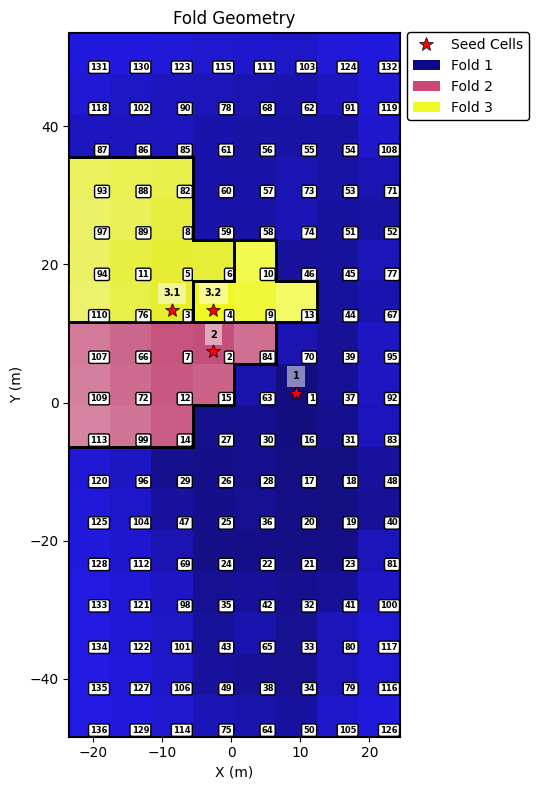

Iteration: 75

Fold Summaries:

Fold 1:
  Intended total counts: 642317.65
  Actual total counts: 602843.0
  Category Counts:
    1_WALL: 276727.0 (57.46% of total 1_WALL)
    2_FLOOR: 81483.0 (58.10% of total 2_FLOOR)
    3_ROOF: 21638.0 (49.17% of total 3_ROOF)
    4_CEILING: 53547.0 (63.99% of total 4_CEILING)
    5_FOOTPATH: 119462.0 (82.33% of total 5_FOOTPATH)
    7_COLUMN: 1913.0 (63.20% of total 7_COLUMN)
    8_DOOR: 10068.0 (47.22% of total 8_DOOR)
    9_WINDOW: 5379.0 (46.37% of total 9_WINDOW)
    10_STAIR: 3345.0 (42.35% of total 10_STAIR)
    11_RAILING: 11303.0 (55.81% of total 11_RAILING)
    12_RWP: 758.0 (37.41% of total 12_RWP)
    13_OTHER: 17220.0 (62.88% of total 13_OTHER)
  Aspect Ratio: 2.12

Fold 2:
  Intended total counts: 98818.10
  Actual total counts: 106925.0
  Category Counts:
    1_WALL: 59795.0 (12.42% of total 1_WALL)
    2_FLOOR: 14417.0 (10.28% of total 2_FLOOR)
    3_ROOF: 1856.0 (4.22% of total 3_ROOF)
    4_CEILING: 7088.0 (8.47% of total 4_CEILING

In [131]:
weights = {1: 0.65, 2: 0.1, 3: 0.15}  # Intended area weights: training, evaluation, test
region_counts = {1: 1, 2: 1, 3: 2}
iterations = 100  # Number of iterations to run
# min_percentage_threshold = 5  # Minimum acceptable percentage per category per area

# Create an instance of GridSplitter
grid_splitter = GridSplitter(
    counts=counts,
    x_edges=x_edges,
    y_edges=y_edges,
    weights=weights,
    iterations=iterations,
    region_counts=region_counts,
)

# Run the algorithm
grid_splitter.run()

# Access the best configuration
best_config = grid_splitter.best_configuration

# Plot the result
best_config.plot()

# Print the summary
best_config.print_summary()

In [132]:
best_config.equality_breakdown

{1: {'total_count': 8069.944442618481,
  'region_area': 42.0,
  'per-category': {'1_WALL': 13.130070430424214,
   '2_FLOOR': 11.883951253635718,
   '3_ROOF': 32.195905351696084,
   '4_CEILING': 1.5768390386015945,
   '5_FOOTPATH': 0,
   '7_COLUMN': 2.8515420805018254,
   '8_DOOR': 37.66338895510528,
   '9_WINDOW': 40.16266964119724,
   '10_STAIR': 53.493273542600896,
   '11_RAILING': 16.457135273821105,
   '12_RWP': 73.7335092348285,
   '13_OTHER': 3.3734030197444738},
  'aspect_ratio': 1265.625},
 2: {'total_count': 2101.4864473934163,
  'region_area': 2.0,
  'per-category': {'1_WALL': 0,
   '2_FLOOR': 0,
   '3_ROOF': 137.10668103448273,
   '4_CEILING': 18.05727990970654,
   '5_FOOTPATH': 19.08650689428758,
   '7_COLUMN': 0,
   '8_DOOR': 0,
   '9_WINDOW': 0,
   '10_STAIR': 0,
   '11_RAILING': 0,
   '12_RWP': 0,
   '13_OTHER': 238.09876543209876},
  'aspect_ratio': 444.4444444444445},
 3: {'total_count': 18187.595811995412,
  'region_area': 5.5,
  'per-category': {'1_WALL': 0,
   '2_FL

7036039.5447479235
{1: {'total_count': 3618.2303806908344, 'region_area': 22.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 23.611085859733638, '5_FOOTPATH': 40.993182939408875, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 14.045659331138454, '12_RWP': 0, '13_OTHER': 0.8663871260199406}, 'aspect_ratio': 1265.625}, 2: {'total_count': 10067.675575821879, 'region_area': 8.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1001000.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1001000.0, '8_DOOR': 9.799176107106087, '9_WINDOW': 598.734939759036, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 1001000.0, '13_OTHER': 0}, 'aspect_ratio': 250.0}, 3: {'total_count': 997.1657975251037, 'region_area': 1.5, 'per-category': {'1_WALL': 25.151491528947094, '2_FLOOR': 11.870679570349884, '3_ROOF': 1000750.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1000750.0, '8_DOOR': 37.272532188841204, '9_WINDOW': 1000750.0, '10_STAIR': 64.56249999999999, '1

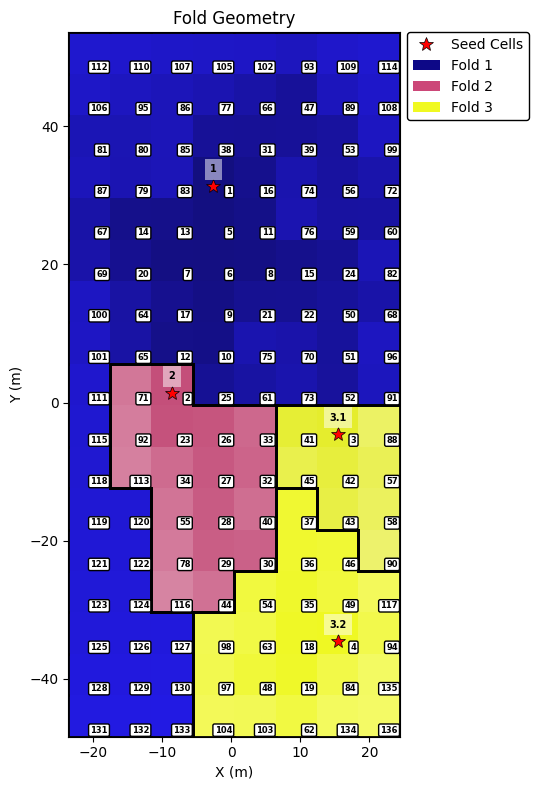

10087113.728892086
{1: {'total_count': 28893.13659249606, 'region_area': 48.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 16009.598130640434, 'region_area': 2.0, 'per-category': {'1_WALL': 3.168551292614553, '2_FLOOR': 4.360213332739365, '3_ROOF': 852.8319836228073, '4_CEILING': 115.35153581449383, '5_FOOTPATH': 189.9000999000999, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 121.74697908021834, '10_STAIR': 1001000.0, '11_RAILING': 1001000.0, '12_RWP': 1001000.0, '13_OTHER': 441.517430769813}, 'aspect_ratio': 1000.0}, 3: {'total_count': 13792.44944439556, 'region_area': 6.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 78.26331967213113, '10_STAIR': 0, '11_RAILING': 21.60328262610089, '12_RWP': 47.5

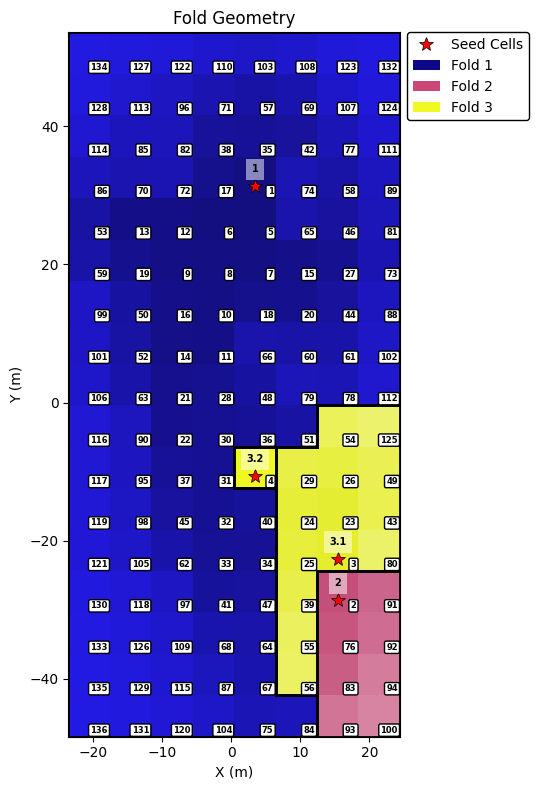

183861.69501230613
{1: {'total_count': 72132.72467951756, 'region_area': 26.0, 'per-category': {'1_WALL': 327.89586266282134, '2_FLOOR': 616.3790664780763, '3_ROOF': 610.4955290611028, '4_CEILING': 711.8111940298508, '5_FOOTPATH': 651.7875647668394, '7_COLUMN': 551.5066225165563, '8_DOOR': 381.08122179798687, '9_WINDOW': 268.3121641426478, '10_STAIR': 31.211369093569576, '11_RAILING': 154.6556393886632, '12_RWP': 232.55050505050502, '13_OTHER': 497.94759825327515}, 'aspect_ratio': 10562.5}, 2: {'total_count': 46354.602492379185, 'region_area': 35.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 20.408163265306104}, 3: {'total_count': 42826.9746412951, 'region_area': 26.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAI

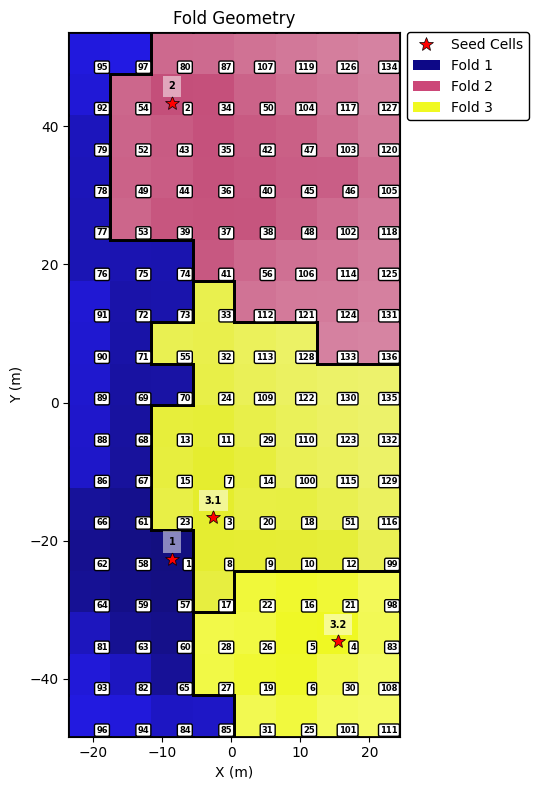

13102940.95561336
{1: {'total_count': 23458.911787991856, 'region_area': 35.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 17159.165240463786, 'region_area': 2.0, 'per-category': {'1_WALL': 107.5942609405706, '2_FLOOR': 1001000.0, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 25.90334968936818, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 224.016, '12_RWP': 1001000.0, '13_OTHER': 879.9304370187369}, 'aspect_ratio': 6250.0}, 3: {'total_count': 10946.393871615157, 'region_area': 2.5, 'per-category': {'1_WALL': 221.6891530857601, '2_FLOOR': 2.3953171851983974, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 223.87276785714283, '7_COLUMN': 1000750.0, '8_DOOR': 610.7666666666667, '9_WINDOW': 440.3260869565217, '10_ST

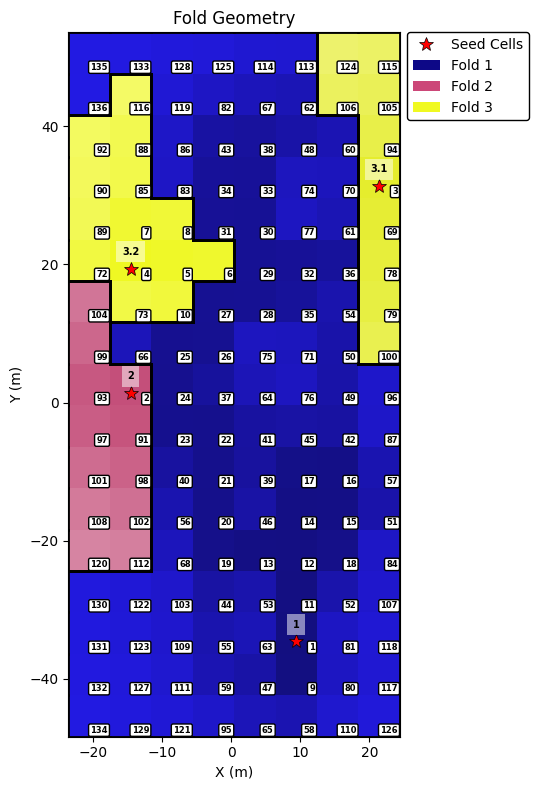

8079662.183499828
{1: {'total_count': 5822.087510147743, 'region_area': 26.0, 'per-category': {'1_WALL': 4.48198123030918, '2_FLOOR': 6.591214675724028, '3_ROOF': 25.43654621996141, '4_CEILING': 0, '5_FOOTPATH': 4.441534423760527, '7_COLUMN': 0.23178807947020932, '8_DOOR': 0, '9_WINDOW': 7.490019960079828, '10_STAIR': 5.928409325355894, '11_RAILING': 0, '12_RWP': 4.598888006354257, '13_OTHER': 6.305762914302779}, 'aspect_ratio': 1000.0}, 2: {'total_count': 16316.276201237883, 'region_area': 0.0, 'per-category': {'1_WALL': 16.065631937506016, '2_FLOOR': 439.03151421983085, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 456.9865642994242, '7_COLUMN': 1001000.0, '8_DOOR': 464.10052910052906, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 1001000.0, '12_RWP': 1001000.0, '13_OTHER': 1001000.0}, 'aspect_ratio': 9000.0}, 3: {'total_count': 21400.184936954363, 'region_area': 19.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0,

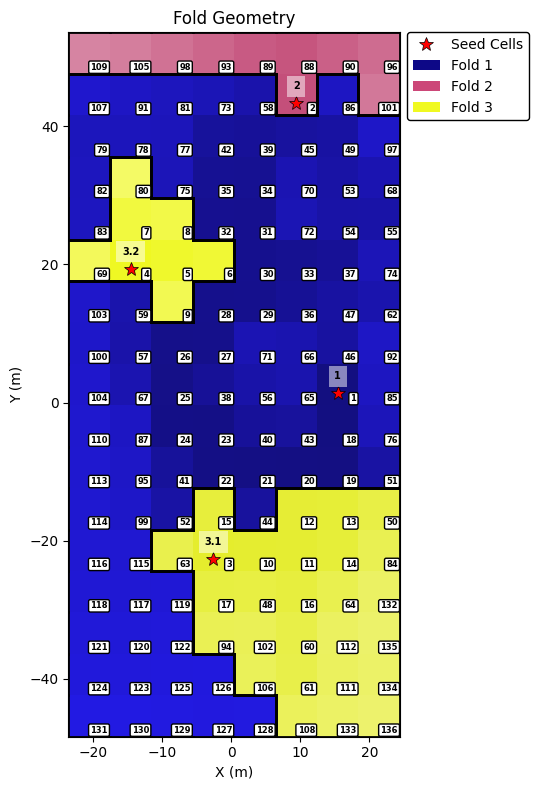

133951.01024499832
{1: {'total_count': 53147.86028632304, 'region_area': 4.0, 'per-category': {'1_WALL': 120.22232461292798, '2_FLOOR': 138.09454165578484, '3_ROOF': 139.20847967887605, '4_CEILING': 207.6781875777803, '5_FOOTPATH': 128.77874539103436, '7_COLUMN': 77.57671480144406, '8_DOOR': 114.71649883810996, '9_WINDOW': 65.77286719437117, '10_STAIR': 1550.9163987138263, '11_RAILING': 82.01258296460179, '12_RWP': 69.9225806451613, '13_OTHER': 122.26120614308903}, 'aspect_ratio': 1265.625}, 2: {'total_count': 34735.64976866876, 'region_area': 14.000000000000002, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 27.777777777777803}, 3: {'total_count': 21696.94705245515, 'region_area': 8.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAI

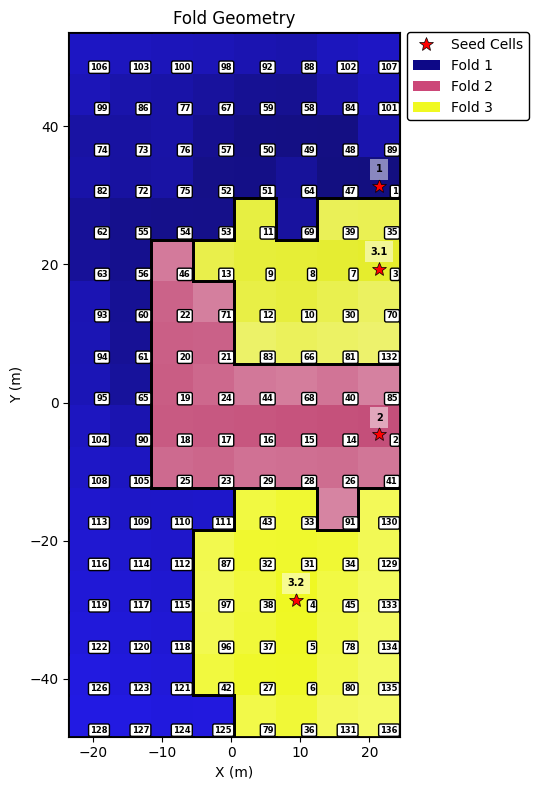

115475.71185643965
{1: {'total_count': 45140.17283461219, 'region_area': 28.000000000000004, 'per-category': {'1_WALL': 84.39893623287428, '2_FLOOR': 143.3050440352282, '3_ROOF': 369.465780403742, '4_CEILING': 146.2707144797609, '5_FOOTPATH': 21.908082675180644, '7_COLUMN': 3.33771008403362, '8_DOOR': 163.39699733941464, '9_WINDOW': 102.56179473401396, '10_STAIR': 120.64245810055864, '11_RAILING': 55.134354743665284, '12_RWP': 70.8041504539559, '13_OTHER': 126.35935910478128}, 'aspect_ratio': 1265.625}, 2: {'total_count': 33364.35903473759, 'region_area': 2.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 106.77640017101325, '7_COLUMN': 5.839160839160851, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 444.4444444444445}, 3: {'total_count': 25469.75695534381, 'region_area': 13.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOO

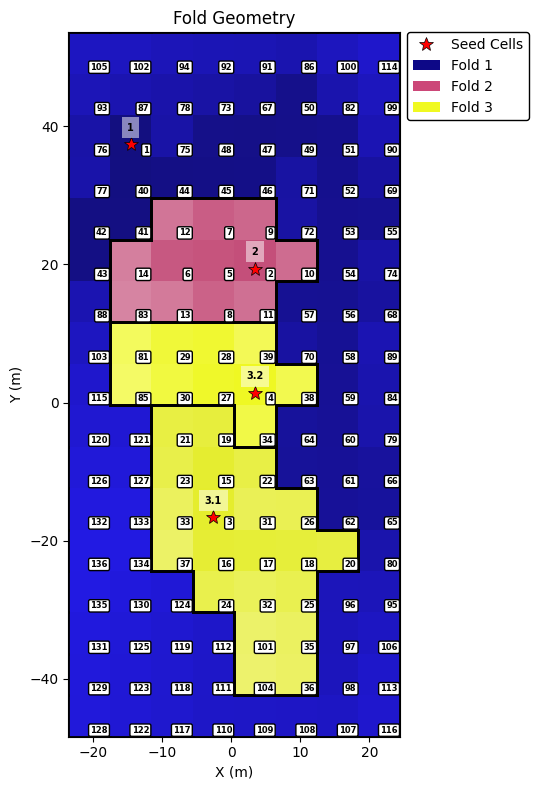

9076250.469550598
{1: {'total_count': 8091.312985614009, 'region_area': 26.0, 'per-category': {'1_WALL': 12.757643863838554, '2_FLOOR': 12.349990757286346, '3_ROOF': 58.24601681788006, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 21.905204460966555, '8_DOOR': 52.05650027427316, '9_WINDOW': 75.57871448532835, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 55.84615384615386, '13_OTHER': 12.004656137922355}, 'aspect_ratio': 1265.625}, 2: {'total_count': 16758.897839097655, 'region_area': 3.0, 'per-category': {'1_WALL': 4.319186153541888, '2_FLOOR': 1001000.0, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 6.2719371681886855, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 184.42415730337078, '12_RWP': 1001000.0, '13_OTHER': 1001000.0}, 'aspect_ratio': 0.0}, 3: {'total_count': 26792.377079341717, 'region_area': 7.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 16.175136116152448, '7_COL

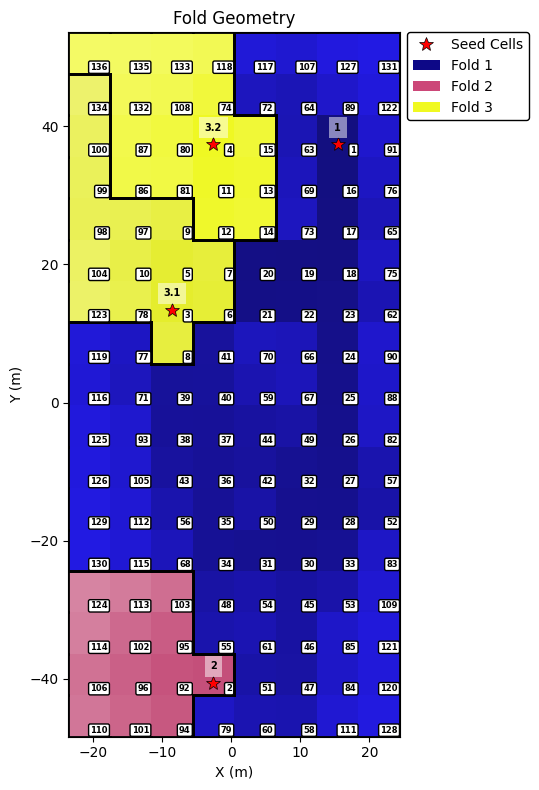

12103191.47647345
{1: {'total_count': 23734.60719291019, 'region_area': 33.0, 'per-category': {'1_WALL': 25.076989152799698, '2_FLOOR': 45.99003955354139, '3_ROOF': 33.454091630120374, '4_CEILING': 102.80901599612211, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 56.73357457876284, '9_WINDOW': 3.250479320734048, '10_STAIR': 218.50806451612905, '11_RAILING': 1.0839348794348036, '12_RWP': 1.2999999999999963, '13_OTHER': 59.277916964924835}, 'aspect_ratio': 1265.625}, 2: {'total_count': 36976.419465283216, 'region_area': 6.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1777.777777777778}, 3: {'total_count': 14067.512303144113, 'region_area': 10.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1000750.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1000750.0, '8_DOOR': 0, '9_WINDOW': 1000750.0, '10_STAIR': 0, '11_RAILING':

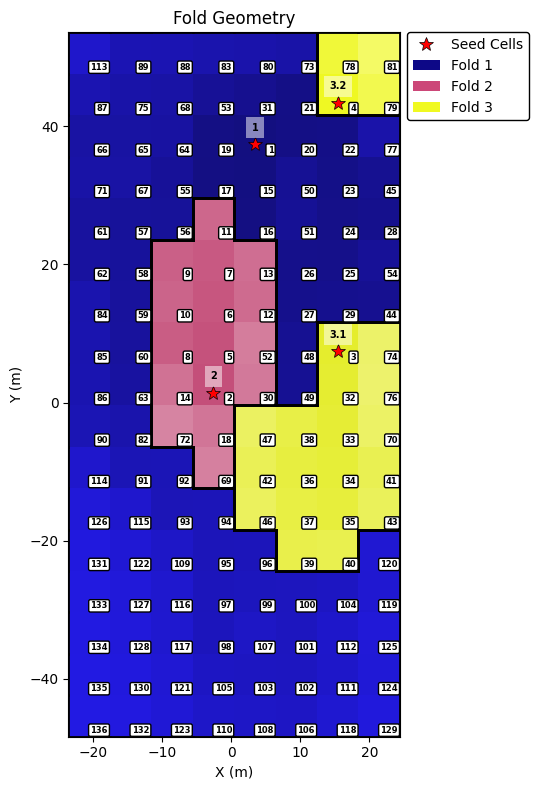

9073696.626231767
{1: {'total_count': 33324.51187580427, 'region_area': 42.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 11661.041698459703, 'region_area': 1.0, 'per-category': {'1_WALL': 133.64364024449407, '2_FLOOR': 1.2413844879152174, '3_ROOF': 1001000.0, '4_CEILING': 570.9322901918028, '5_FOOTPATH': 36.54714850367025, '7_COLUMN': 1001000.0, '8_DOOR': 441.1928934010153, '9_WINDOW': 683.7162162162163, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 1001000.0, '13_OTHER': 243.61355081555834}, 'aspect_ratio': 2777.7777777777774}, 3: {'total_count': 2049.487894799117, 'region_area': 7.5, 'per-category': {'1_WALL': 4.37005200809016, '2_FLOOR': 48.597259499929365, '3_ROOF': 0, '4_CEILING': 351.5053956834533, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 339.3475274725275, '9_WINDOW': 0, '10_STAIR': 13.92

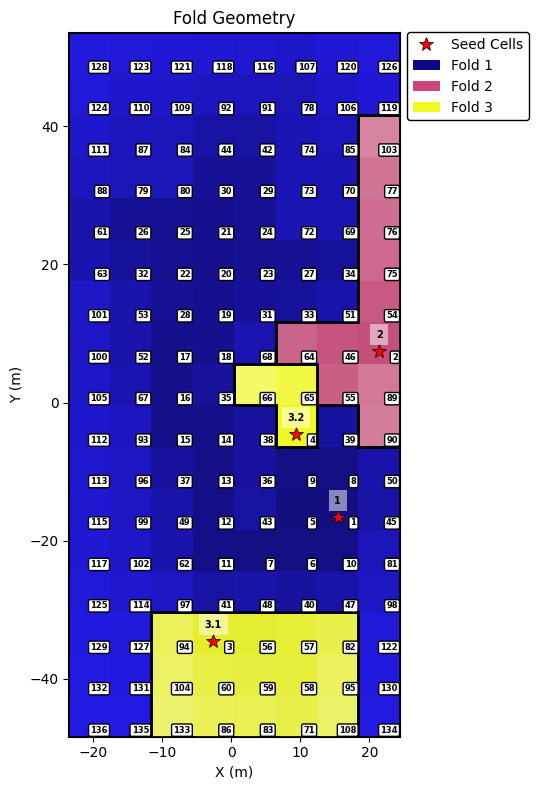

8062889.789582291
{1: {'total_count': 6652.864158249038, 'region_area': 41.0, 'per-category': {'1_WALL': 10.080188048974303, '2_FLOOR': 14.710789556464297, '3_ROOF': 61.698982475975136, '4_CEILING': 2.5439274537159298, '5_FOOTPATH': 0, '7_COLUMN': 1.5771812080537002, '8_DOOR': 45.87885485738343, '9_WINDOW': 43.11598329536825, '10_STAIR': 18.46677434240887, '11_RAILING': 0, '12_RWP': 44.3969298245614, '13_OTHER': 13.143710671836265}, 'aspect_ratio': 1265.625}, 2: {'total_count': 29111.31498628985, 'region_area': 1.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 77.61659933896439, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 444.4444444444445}, 3: {'total_count': 4426.728191618544, 'region_area': 4.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 3.1642135544711345, '11_RAILI

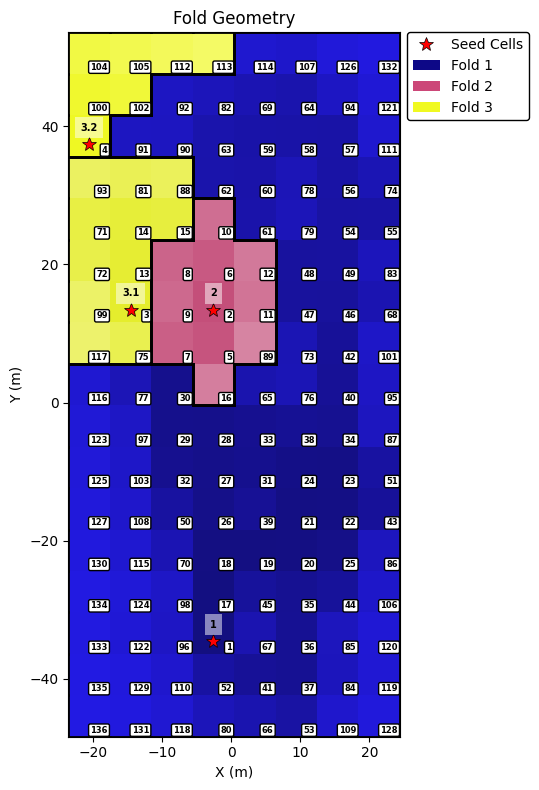

9134452.699846582
{1: {'total_count': 42053.416671666455, 'region_area': 21.0, 'per-category': {'1_WALL': 75.32759663526699, '2_FLOOR': 107.23404255319149, '3_ROOF': 138.92875041764117, '4_CEILING': 190.92506418485237, '5_FOOTPATH': 12.753754005069109, '7_COLUMN': 12.36721873215305, '8_DOOR': 222.69965075669384, '9_WINDOW': 149.2347107438017, '10_STAIR': 130.44658886894075, '11_RAILING': 32.38610077441417, '12_RWP': 151.31679389312976, '13_OTHER': 111.5377302436126}, 'aspect_ratio': 1265.625}, 2: {'total_count': 49498.81731681506, 'region_area': 12.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 159.99999999999991}, 3: {'total_count': 12745.257089078443, 'region_area': 1.5, 'per-category': {'1_WALL': 3.6799519683152595, '2_FLOOR': 1000750.0, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 444.37843921960973, '7_C

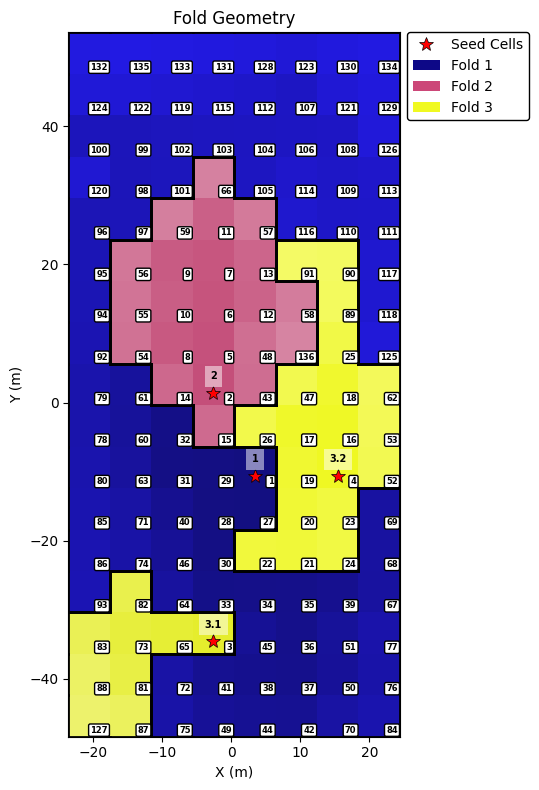

14093970.384962462
{1: {'total_count': 17615.683187129915, 'region_area': 49.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 28.86673874847953, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 1.7318702290076249, '9_WINDOW': 0, '10_STAIR': 1.9731876861966227, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 1.6497259022384678}, 'aspect_ratio': 1265.625}, 2: {'total_count': 16056.39654199084, 'region_area': 9.0, 'per-category': {'1_WALL': 6.000320664673439, '2_FLOOR': 694.6515580736544, '3_ROOF': 1001000.0, '4_CEILING': 135.51646495918945, '5_FOOTPATH': 40.53129324426648, '7_COLUMN': 1001000.0, '8_DOOR': 170.58393434180243, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 637.9689632348144, '12_RWP': 1001000.0, '13_OTHER': 413.8086303939963}, 'aspect_ratio': 0.0}, 3: {'total_count': 26664.652646694933, 'region_area': 7.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 

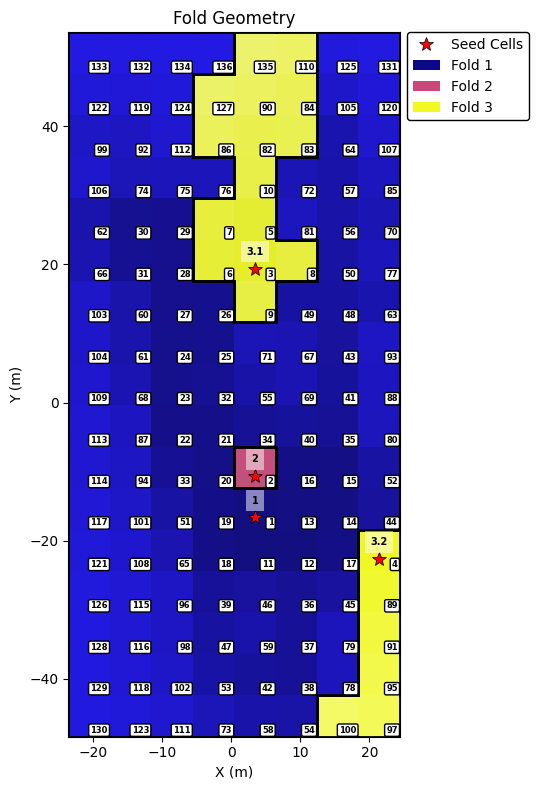

5061576.974796972
{1: {'total_count': 7690.524692152158, 'region_area': 48.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 5.76258966205724, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0.3852040816326635, '8_DOOR': 9.331466435276495, '9_WINDOW': 18.245765370138017, '10_STAIR': 0, '11_RAILING': 0.4820610687022926, '12_RWP': 33.559837728194736, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 16056.39654199084, 'region_area': 9.0, 'per-category': {'1_WALL': 6.000320664673439, '2_FLOOR': 694.6515580736544, '3_ROOF': 1001000.0, '4_CEILING': 135.51646495918945, '5_FOOTPATH': 40.53129324426648, '7_COLUMN': 1001000.0, '8_DOOR': 170.58393434180243, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 637.9689632348144, '12_RWP': 1001000.0, '13_OTHER': 413.8086303939963}, 'aspect_ratio': 0.0}, 3: {'total_count': 4163.547215938658, 'region_area': 1.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 77.83001077586205, '4_CEILING': 0, '5_FOOTPATH': 4.81723174725

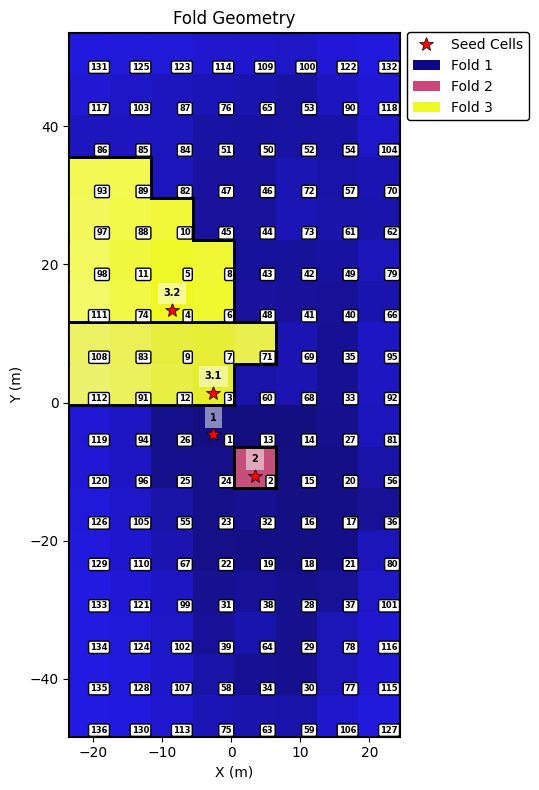

13080639.202121409
{1: {'total_count': 37638.68597891496, 'region_area': 50.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 14296.977737337147, 'region_area': 9.0, 'per-category': {'1_WALL': 248.8577430102854, '2_FLOOR': 366.74209650582367, '3_ROOF': 398.3805209513024, '4_CEILING': 694.6723646723647, '5_FOOTPATH': 5.679192654866268, '7_COLUMN': 587.9545454545454, '8_DOOR': 286.28623188405794, '9_WINDOW': 78.44615384615386, '10_STAIR': 1001000.0, '11_RAILING': 2.7009231744536275, '12_RWP': 28.227848101265828, '13_OTHER': 272.06755855224384}, 'aspect_ratio': 0.0}, 3: {'total_count': 11568.887568947312, 'region_area': 1.5, 'per-category': {'1_WALL': 268.07086814754433, '2_FLOOR': 1000750.0, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 275.6342768381084, '7_COLUMN': 1000750.0, '8_DOOR

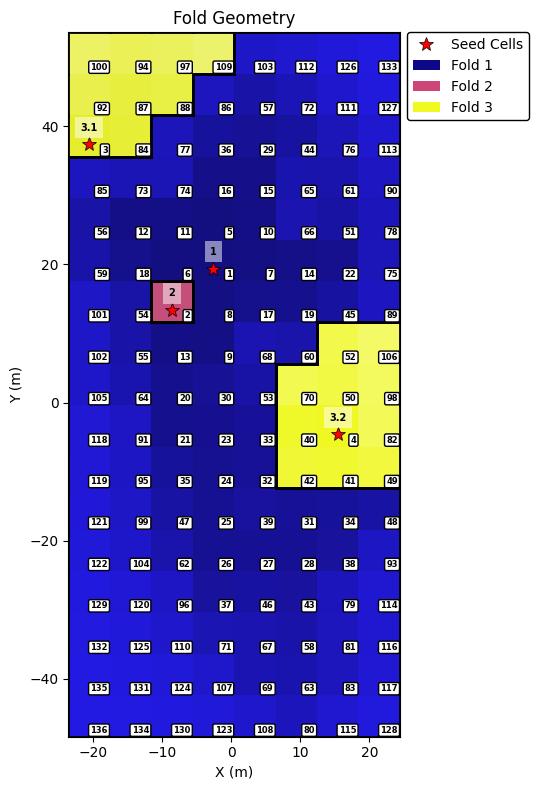

2083448.7028725669
{1: {'total_count': 29760.833877237765, 'region_area': 18.0, 'per-category': {'1_WALL': 25.216065307559088, '2_FLOOR': 75.58337506259389, '3_ROOF': 142.0217446484474, '4_CEILING': 99.06800131757129, '5_FOOTPATH': 28.010519172039356, '7_COLUMN': 2.9591836734693833, '8_DOOR': 52.87833664240016, '9_WINDOW': 36.631931859369345, '10_STAIR': 18.11249137336094, '11_RAILING': 0, '12_RWP': 7.414355628058715, '13_OTHER': 132.26644050104383}, 'aspect_ratio': 1265.625}, 2: {'total_count': 25211.10802612078, 'region_area': 3.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 11.645891043397976, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 62.5}, 3: {'total_count': 755.3640354116656, 'region_area': 12.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 11.032298923369233, '3_ROOF': 3.0322447223666598, '4_CEILING': 8.006798630596384, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 14

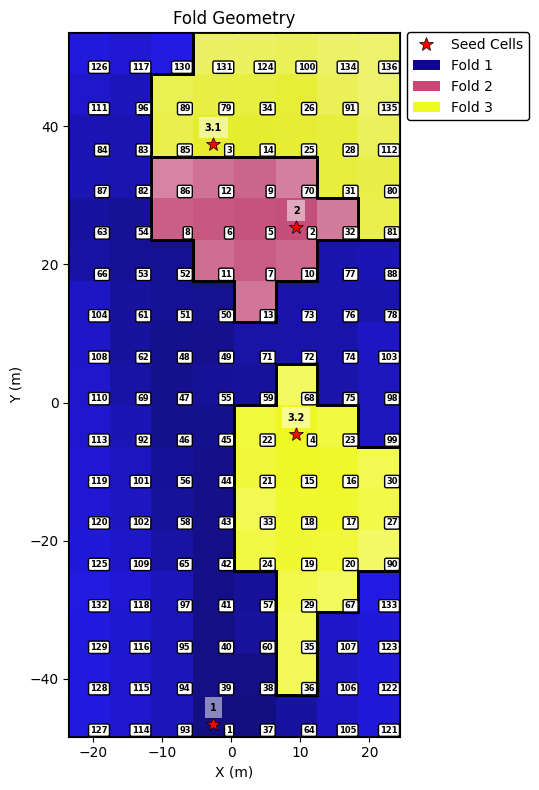

3053791.794757479
{1: {'total_count': 14396.596229222354, 'region_area': 22.0, 'per-category': {'1_WALL': 14.05661270989766, '2_FLOOR': 9.076812634601577, '3_ROOF': 0, '4_CEILING': 24.24356982959479, '5_FOOTPATH': 36.88406217797066, '7_COLUMN': 16.907308377896616, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 5.147450337907021, '11_RAILING': 24.28618638466623, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 16879.458587784422, 'region_area': 6.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 60.66812705366922, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 22.204373047746532}, 'aspect_ratio': 250.0}, 3: {'total_count': 13908.083202031827, 'region_area': 9.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1000750.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 480.2984194902444, '8_DOOR': 0, '9_WINDOW': 1000750.0, '10_STAIR': 14.588974854932314, '11_RAILING': 0, '12_

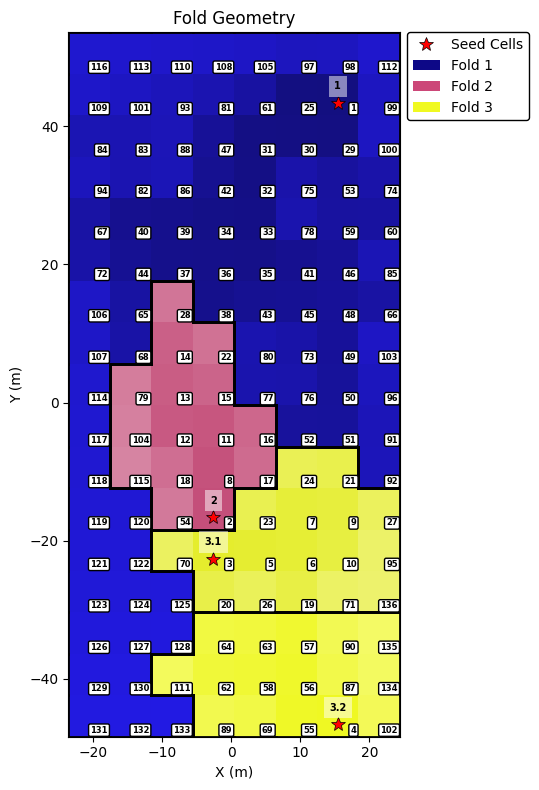

86072.03176213318
{1: {'total_count': 29949.957846519967, 'region_area': 27.0, 'per-category': {'1_WALL': 45.24854431994804, '2_FLOOR': 61.88653111959513, '3_ROOF': 117.75692752740561, '4_CEILING': 28.12133418132993, '5_FOOTPATH': 1.5262019075505424, '7_COLUMN': 43.19868995633188, '8_DOOR': 190.56498951781973, '9_WINDOW': 138.0596779286391, '10_STAIR': 11.616304347826091, '11_RAILING': 21.453681491050013, '12_RWP': 153.73795761079, '13_OTHER': 47.51719565757851}, 'aspect_ratio': 1265.625}, 2: {'total_count': 13289.599089274407, 'region_area': 11.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 3.347556370916501, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 2777.7777777777774}, 3: {'total_count': 21426.368802415247, 'region_area': 6.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_ST

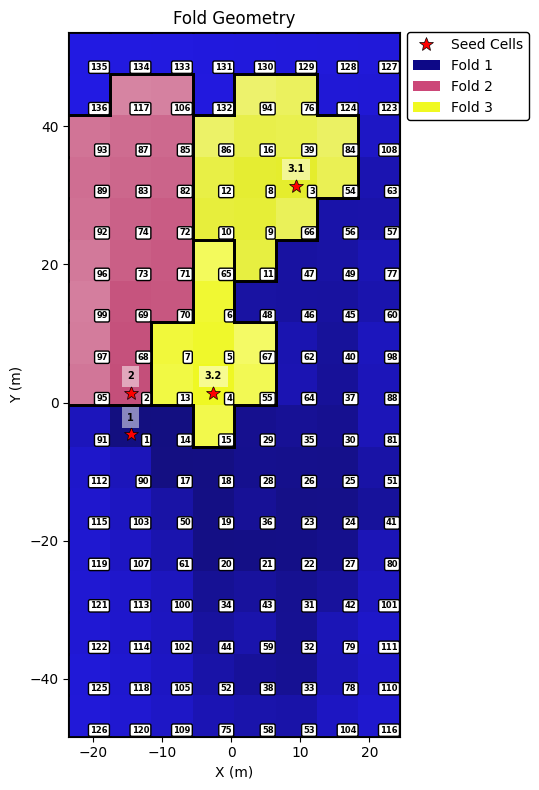

167120.56950473698
{1: {'total_count': 67408.74465145836, 'region_area': 7.000000000000001, 'per-category': {'1_WALL': 251.3833142523627, '2_FLOOR': 571.5756906077346, '3_ROOF': 390.3917366706669, '4_CEILING': 660.7181818181817, '5_FOOTPATH': 211.4757752898049, '7_COLUMN': 107.98625792811842, '8_DOOR': 376.7784657722739, '9_WINDOW': 196.59126671911875, '10_STAIR': 1897.8015564202333, '11_RAILING': 144.12370178041544, '12_RWP': 207.68691588785043, '13_OTHER': 308.74626865671644}, 'aspect_ratio': 1265.625}, 2: {'total_count': 39589.64554987345, 'region_area': 22.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 27.777777777777803}, 3: {'total_count': 23957.32908794407, 'region_area': 14.499999999999998, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDO

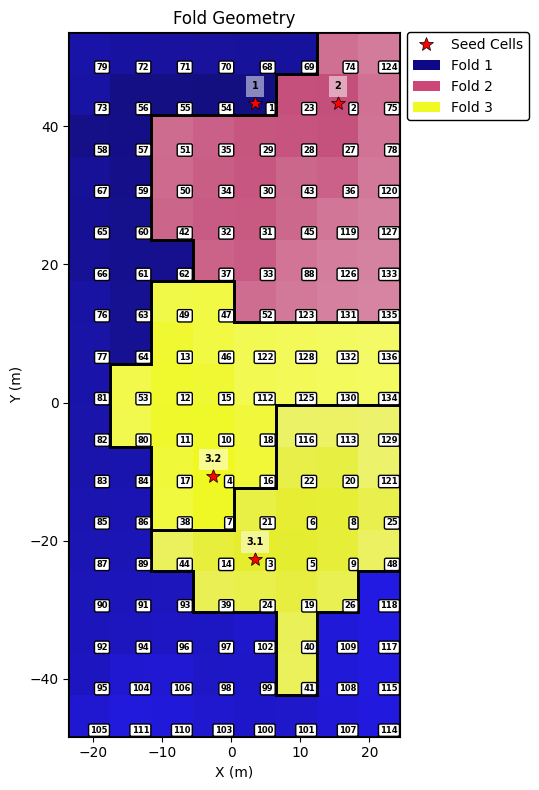

14087069.724751038
{1: {'total_count': 33967.296088962656, 'region_area': 44.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 16840.733351235045, 'region_area': 8.0, 'per-category': {'1_WALL': 526.0779727952811, '2_FLOOR': 140.0244554624409, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 258.7908011869436, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 114.09255678734843, '12_RWP': 163.11688311688314, '13_OTHER': 1001000.0}, 'aspect_ratio': 1000.0}, 3: {'total_count': 7047.946886851712, 'region_area': 3.5000000000000004, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1000750.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1000750.0, '8_DOOR': 33.71446488294314, '9_WINDOW': 424.0512048192771, '10_STAIR': 0, '11_RAILING': 

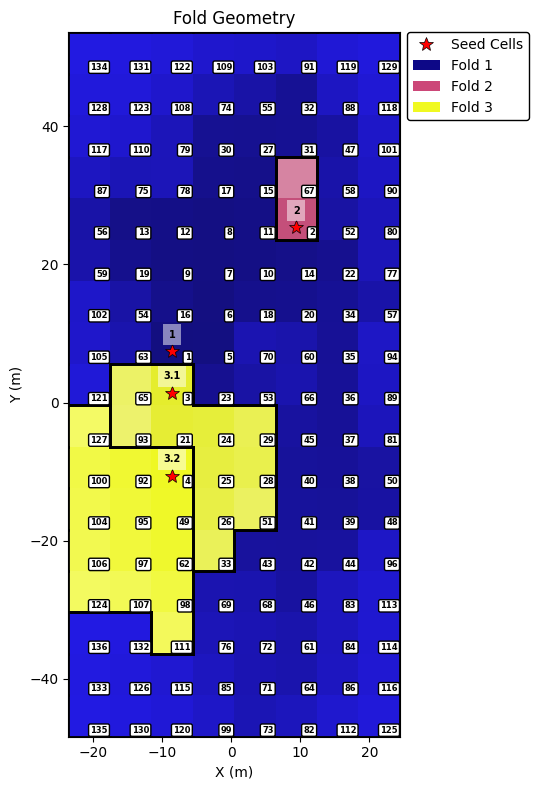

9061413.269605137
{1: {'total_count': 31393.822541196452, 'region_area': 36.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 4421.255388158592, 'region_area': 5.0, 'per-category': {'1_WALL': 13.075315772174493, '2_FLOOR': 66.00307728725294, '3_ROOF': 46.98396793587173, '4_CEILING': 59.57093821510299, '5_FOOTPATH': 26.147626499739175, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 3.347556370916501, '11_RAILING': 28.90515595162317, '12_RWP': 0, '13_OTHER': 28.331771321462035}, 'aspect_ratio': 444.4444444444445}, 3: {'total_count': 2672.3207756315896, 'region_area': 1.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 49.54791015069661, '3_ROOF': 399.3229954614221, '4_CEILING': 82.28071449317456, '5_FOOTPATH': 45.87298927613941, '7_COLUMN': 0, '8_DOOR': 6.119774386197752, '9_WINDOW': 55.066844919

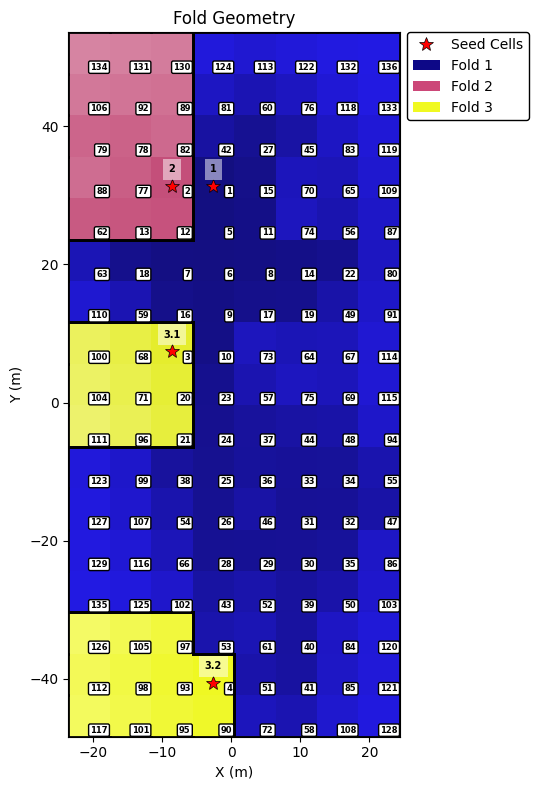

1087226.585850535
{1: {'total_count': 31978.923437894937, 'region_area': 14.000000000000002, 'per-category': {'1_WALL': 51.44079972136492, '2_FLOOR': 73.18186998974203, '3_ROOF': 176.45259495505948, '4_CEILING': 25.63253568623828, '5_FOOTPATH': 0.33485111226952646, '7_COLUMN': 53.714843749999986, '8_DOOR': 206.22956252761819, '9_WINDOW': 203.76107977437547, '10_STAIR': 11.616304347826091, '11_RAILING': 18.71527777777778, '12_RWP': 198.6167800453515, '13_OTHER': 55.52070592346672}, 'aspect_ratio': 250.0}, 2: {'total_count': 1388.1292695610325, 'region_area': 21.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 47.918160725585324, '3_ROOF': 3.20143691045445, '4_CEILING': 8.420014301346757, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 15.259459459459457, '9_WINDOW': 95.92905405405405, '10_STAIR': 41.85166901369639, '11_RAILING': 4.332818134981956, '12_RWP': 1001000.0, '13_OTHER': 56.491428571428564}, 'aspect_ratio': 111.11111111111106}, 3: {'total_count': 25948.905885020016, 'region_area': 4.5, 'p

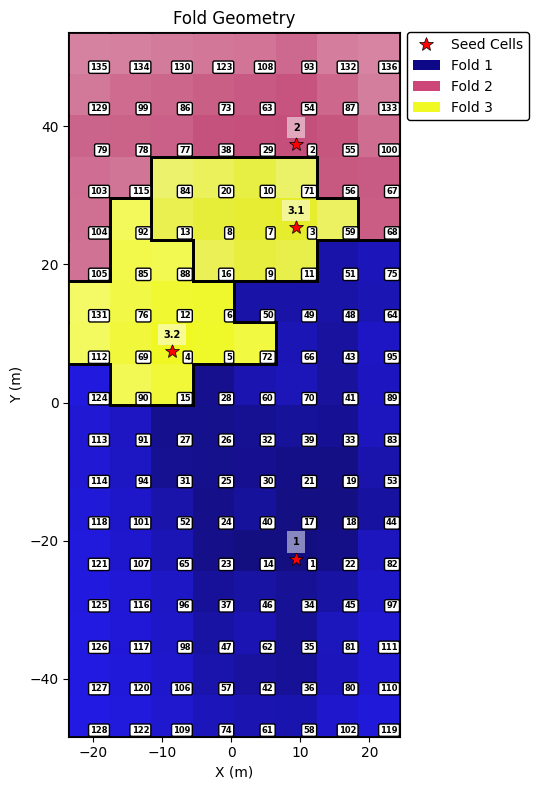

14090879.984769026
{1: {'total_count': 15149.202046546248, 'region_area': 49.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1.2873127722105984, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 2.0089055715021664, '9_WINDOW': 4.9610190728108075, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 6.631578947368422, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 17009.221990313556, 'region_area': 8.0, 'per-category': {'1_WALL': 12.817110216082119, '2_FLOOR': 1001000.0, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 55.79607715773229, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 658.4644194756555, '12_RWP': 1001000.0, '13_OTHER': 501.5909501245625}, 'aspect_ratio': 1000.0}, 3: {'total_count': 12007.068180629218, 'region_area': 6.5, 'per-category': {'1_WALL': 7.255482134260001, '2_FLOOR': 437.24208375893767, '3_ROOF': 1000750.0, '4_CEILING': 171.56750324534832, '5_FOOTPATH': 312.3579007199697, '7

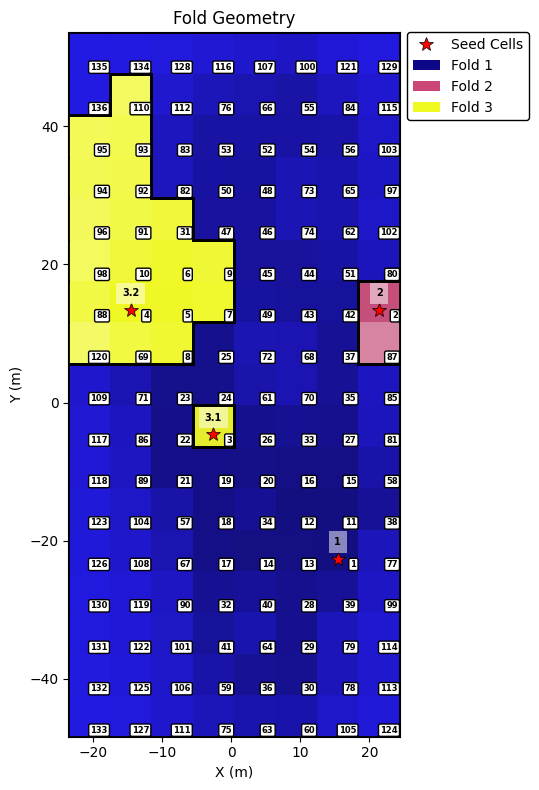

6049258.076543656
{1: {'total_count': 14086.245104649832, 'region_area': 32.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 18.5985533453888, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 3301.2657382227453, 'region_area': 0.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 5.708691258211223, '5_FOOTPATH': 287.33315536572337, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 24.198113207547152, '11_RAILING': 25.160692212608144, '12_RWP': 0, '13_OTHER': 431.7669902912622}, 'aspect_ratio': 62.5}, 3: {'total_count': 11019.463029578581, 'region_area': 2.5, 'per-category': {'1_WALL': 258.2157378024594, '2_FLOOR': 1000750.0, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 87.65519917227107, '7_COLUMN': 1000750.0, '8_DOOR': 255.38333333333335, '9_WINDOW': 1000750.0, '10_STAIR': 412.64073277944675, '11_RAILING':

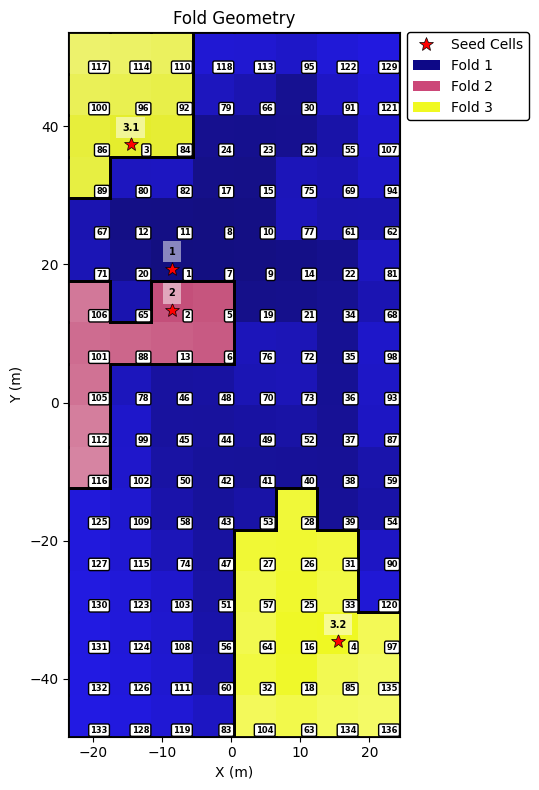

1079782.6719518984
{1: {'total_count': 29949.406369589888, 'region_area': 25.0, 'per-category': {'1_WALL': 51.07393448635293, '2_FLOOR': 65.71792121862106, '3_ROOF': 205.24543805356953, '4_CEILING': 29.00256148756019, '5_FOOTPATH': 0, '7_COLUMN': 56.527446300715994, '8_DOOR': 195.14373935264052, '9_WINDOW': 254.12635039924848, '10_STAIR': 19.2925185873606, '11_RAILING': 15.284200385356455, '12_RWP': 196.59909909909913, '13_OTHER': 42.97911646586345}, 'aspect_ratio': 1265.625}, 2: {'total_count': 39544.755450555305, 'region_area': 12.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 14.293028751476957, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 27.777777777777803}, 3: {'total_count': 4334.210090901301, 'region_area': 7.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 22.88868220090072, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10

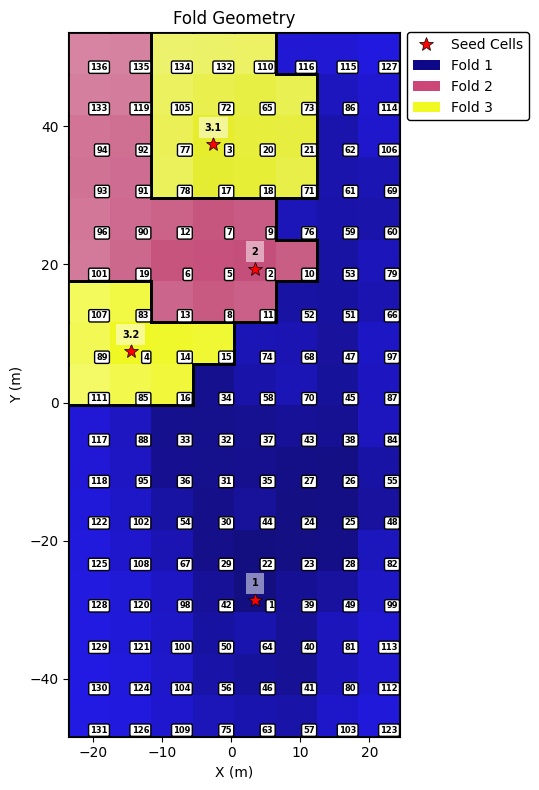

85981.47740129795
{1: {'total_count': 31580.673080322595, 'region_area': 26.0, 'per-category': {'1_WALL': 33.743506382542435, '2_FLOOR': 66.04994262608602, '3_ROOF': 191.0515873015873, '4_CEILING': 36.630787007963036, '5_FOOTPATH': 40.31980896268523, '7_COLUMN': 83.19832402234638, '8_DOOR': 43.96956476576297, '9_WINDOW': 68.36422510049127, '10_STAIR': 24.650400582665686, '11_RAILING': 12.428681243594133, '12_RWP': 36.89189189189189, '13_OTHER': 122.84551827741613}, 'aspect_ratio': 1265.625}, 2: {'total_count': 18729.604970918586, 'region_area': 12.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 54.29088277858177, '9_WINDOW': 33.321839080459775, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 46.81159420289855, '13_OTHER': 0}, 'aspect_ratio': 562.5}, 3: {'total_count': 26292.819968850592, 'region_area': 4.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0,

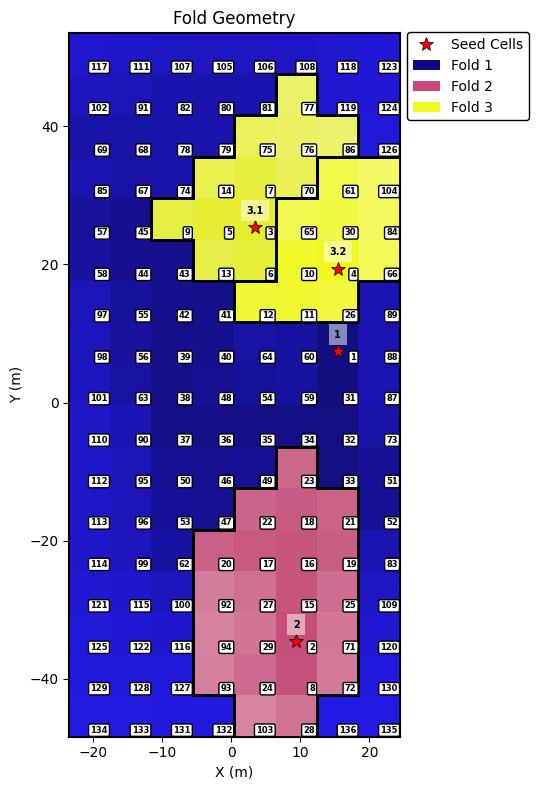

6064775.876623801
{1: {'total_count': 12252.670775259163, 'region_area': 34.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 25.24431892814922, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 18.2993342437692, '9_WINDOW': 2.940333151283452, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 9.248189517613847}, 'aspect_ratio': 562.5}, 2: {'total_count': 5969.654293564611, 'region_area': 12.0, 'per-category': {'1_WALL': 22.574758862901795, '2_FLOOR': 100.53760366028025, '3_ROOF': 3.20143691045445, '4_CEILING': 8.84520897373209, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 37.213642213642224, '9_WINDOW': 161.23873873873876, '10_STAIR': 537.7994158467112, '11_RAILING': 206.8333333333333, '12_RWP': 1001000.0, '13_OTHER': 137.93223284100782}, 'aspect_ratio': 562.5}, 3: {'total_count': 11729.150856118093, 'region_area': 0.5, 'per-category': {'1_WALL': 386.4324670078104, '2_FLOOR': 2.7030724817154, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 301.110394397346

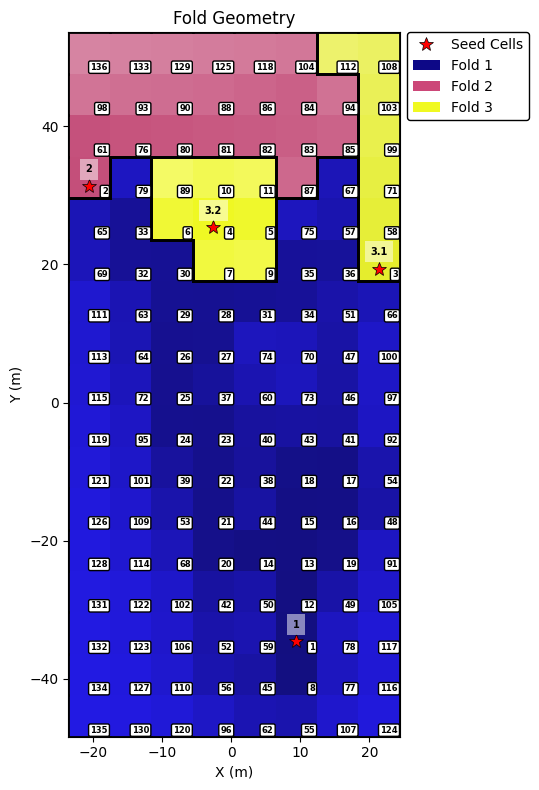

9083384.452684917
{1: {'total_count': 16064.791537284531, 'region_area': 34.0, 'per-category': {'1_WALL': 14.404228105757458, '2_FLOOR': 21.458033573141485, '3_ROOF': 0, '4_CEILING': 57.61497000782405, '5_FOOTPATH': 19.80659298780487, '7_COLUMN': 0, '8_DOOR': 1.5827469950161301, '9_WINDOW': 0, '10_STAIR': 2.1354684702606006, '11_RAILING': 16.36448019801979, '12_RWP': 0, '13_OTHER': 1.0094762526244063}, 'aspect_ratio': 1265.625}, 2: {'total_count': 19372.314495536986, 'region_area': 9.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 3.2590799031477, '9_WINDOW': 137.68442622950815, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 96.69902912621359, '13_OTHER': 0}, 'aspect_ratio': 27.777777777777803}, 3: {'total_count': 25022.88622522994, 'region_area': 9.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP

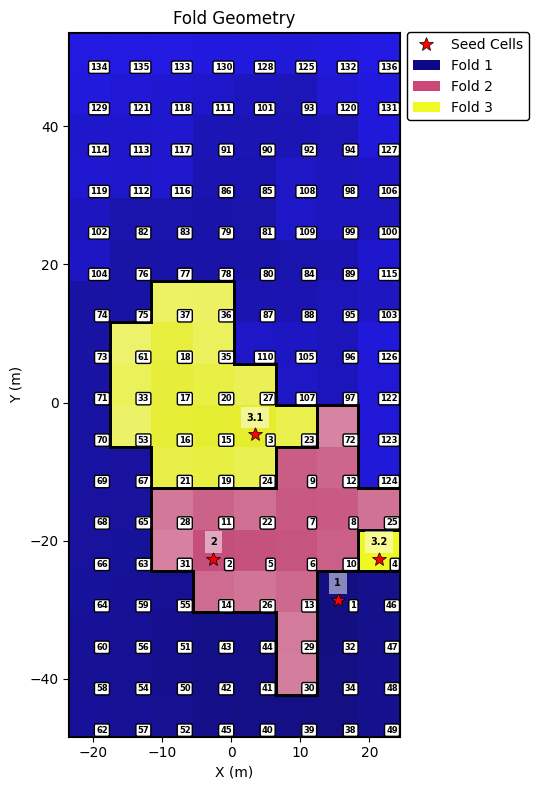

7061947.045406311
{1: {'total_count': 13210.702947601816, 'region_area': 42.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 25.24431892814922, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 17.516957775139907, '9_WINDOW': 2.4646643109540665, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 7.486866735100527}, 'aspect_ratio': 1265.625}, 2: {'total_count': 15906.217323613537, 'region_area': 9.0, 'per-category': {'1_WALL': 7.9791913090032045, '2_FLOOR': 616.3227783452503, '3_ROOF': 1001000.0, '4_CEILING': 262.09000432713106, '5_FOOTPATH': 449.8105342932928, '7_COLUMN': 1001000.0, '8_DOOR': 546.1515151515151, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 1001000.0, '12_RWP': 1001000.0, '13_OTHER': 423.63288718929255}, 'aspect_ratio': 0.0}, 3: {'total_count': 18026.526834121632, 'region_area': 1.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 317.2593941717792, '7_COLUMN': 65.71167883211679, '8_DOOR': 0, '9_

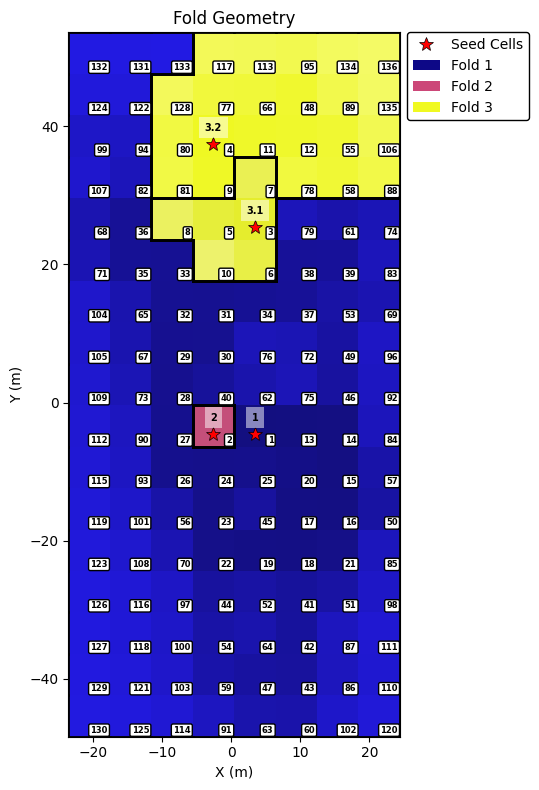

10052036.011888633
{1: {'total_count': 24922.509975246176, 'region_area': 25.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 5.961114981012516, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 1081.1308523172615, 'region_area': 10.0, 'per-category': {'1_WALL': 19.399325697853126, '2_FLOOR': 48.168180857806874, '3_ROOF': 0, '4_CEILING': 407.45300181928445, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 485.79670329670324, '9_WINDOW': 33.321839080459775, '10_STAIR': 51.90384615384617, '11_RAILING': 0, '12_RWP': 46.81159420289855, '13_OTHER': 60.43350908025776}, 'aspect_ratio': 250.0}, 3: {'total_count': 2172.780395160615, 'region_area': 6.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 33.69598373157092, '3_ROOF': 1000750.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1000750.0, '8_DOOR': 22.17150496562261, '9_WINDOW': 1000750.0, '10_STAIR': 0, '11_RAILIN

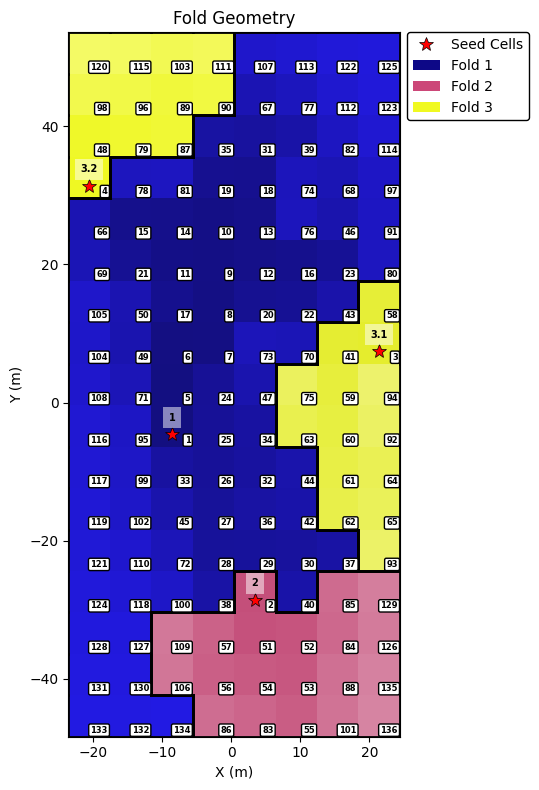

10062473.293172127
{1: {'total_count': 13194.293969172364, 'region_area': 42.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 5.813571192342855, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 3.5658599022573814}, 'aspect_ratio': 1265.625}, 2: {'total_count': 14652.789402010803, 'region_area': 1.0, 'per-category': {'1_WALL': 374.2816346627277, '2_FLOOR': 1001000.0, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 89.51802507836993, '7_COLUMN': 1001000.0, '8_DOOR': 373.84444444444443, '9_WINDOW': 1001000.0, '10_STAIR': 109.8919575795085, '11_RAILING': 703.6111111111112, '12_RWP': 1001000.0, '13_OTHER': 321.97226502311247}, 'aspect_ratio': 111.11111111111106}, 3: {'total_count': 6036.538954134968, 'region_area': 3.5000000000000004, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1000750.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1000750.0, '8_DOOR': 21.153409090909083, '9_WIN

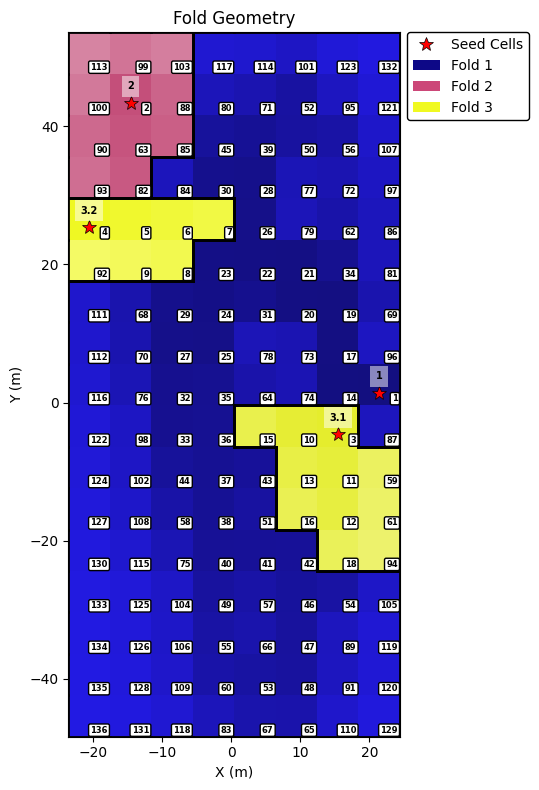

83964.11956847316
{1: {'total_count': 30214.873692083267, 'region_area': 27.0, 'per-category': {'1_WALL': 33.347013272451576, '2_FLOOR': 60.84971241045909, '3_ROOF': 61.70812369269038, '4_CEILING': 78.84831645403132, '5_FOOTPATH': 20.774692978524495, '7_COLUMN': 17.535842293906825, '8_DOOR': 88.9306161395856, '9_WINDOW': 62.34603789836349, '10_STAIR': 153.2979773063641, '11_RAILING': 24.380137957100995, '12_RWP': 28.603515625000018, '13_OTHER': 64.56411204585375}, 'aspect_ratio': 1265.625}, 2: {'total_count': 19682.308610970686, 'region_area': 4.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 39.99999999999998}, 3: {'total_count': 19238.312201315915, 'region_area': 10.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 399.3229954614221, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 23.568892

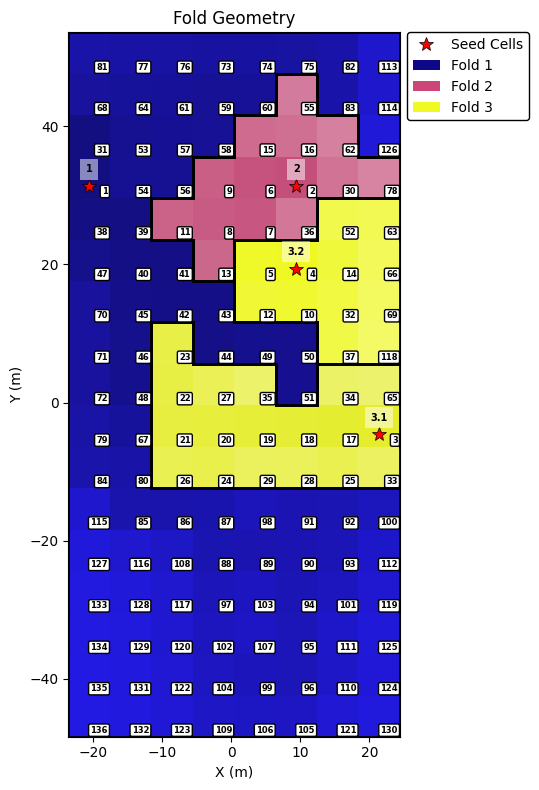

9077997.57985339
{1: {'total_count': 8699.606824897688, 'region_area': 38.0, 'per-category': {'1_WALL': 10.816251039804605, '2_FLOOR': 16.1089177003999, '3_ROOF': 90.79875933831377, '4_CEILING': 4.482212147988775, '5_FOOTPATH': 0, '7_COLUMN': 6.70010845986985, '8_DOOR': 70.416205582196, '9_WINDOW': 67.31802041722148, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 42.985884907709014, '13_OTHER': 25.331972118566487}, 'aspect_ratio': 1265.625}, 2: {'total_count': 17009.221990313556, 'region_area': 8.0, 'per-category': {'1_WALL': 12.817110216082119, '2_FLOOR': 1001000.0, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 55.79607715773229, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 658.4644194756555, '12_RWP': 1001000.0, '13_OTHER': 501.5909501245625}, 'aspect_ratio': 1000.0}, 3: {'total_count': 32572.394066230758, 'region_area': 7.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 23.142

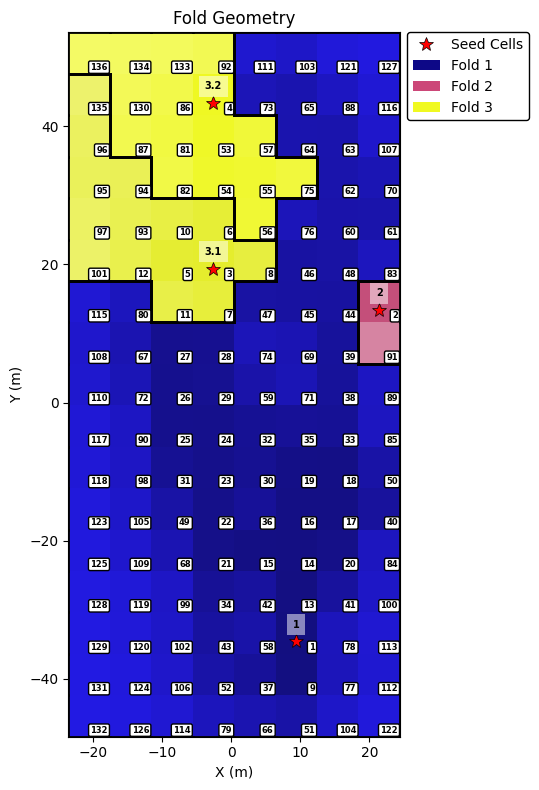

7068746.616540806
{1: {'total_count': 4043.96070933378, 'region_area': 24.0, 'per-category': {'1_WALL': 4.849756012606301, '2_FLOOR': 7.255850068824337, '3_ROOF': 23.909681611436007, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 5.048051254671643, '8_DOOR': 25.98809199163711, '9_WINDOW': 30.2808017971315, '10_STAIR': 1.6702970297029753, '11_RAILING': 0, '12_RWP': 20.595238095238102, '13_OTHER': 4.680388121140834}, 'aspect_ratio': 765.625}, 2: {'total_count': 15677.772908988907, 'region_area': 5.0, 'per-category': {'1_WALL': 491.7594299053937, '2_FLOOR': 904.9200031418051, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 258.0824284304048, '7_COLUMN': 1001000.0, '8_DOOR': 78.04216462378143, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 1001000.0, '12_RWP': 1001000.0, '13_OTHER': 797.9016393442623}, 'aspect_ratio': 2777.7777777777774}, 3: {'total_count': 22035.645334142668, 'region_area': 9.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0,

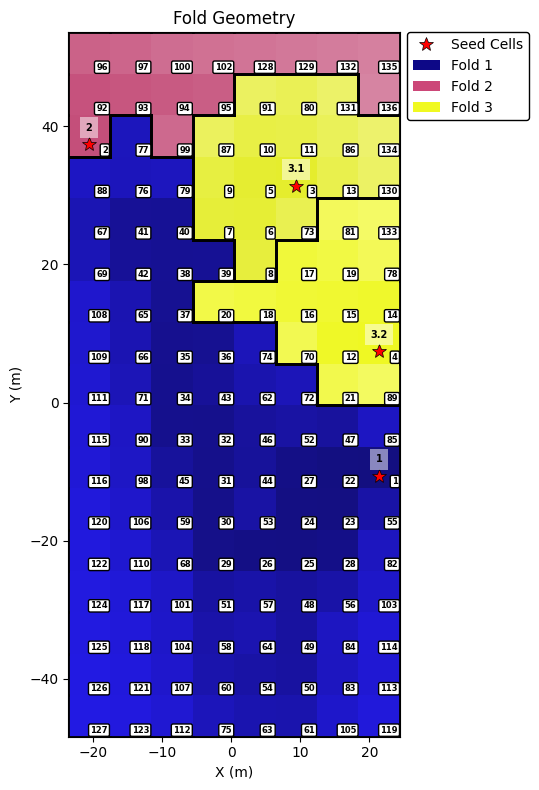

9258125.1995682
{1: {'total_count': 85872.53425964057, 'region_area': 52.0, 'per-category': {'1_WALL': 13.568127038087898, '2_FLOOR': 346.0572755607413, '3_ROOF': 1006500.0, '4_CEILING': 1006500.0, '5_FOOTPATH': 30.41033188204822, '7_COLUMN': 1006500.0, '8_DOOR': 1006500.0, '9_WINDOW': 1006500.0, '10_STAIR': 1006500.0, '11_RAILING': 1006500.0, '12_RWP': 1006500.0, '13_OTHER': 1006500.0}, 'aspect_ratio': 2777.7777777777774}, 2: {'total_count': 72305.3209724169, 'region_area': 76.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 250.0}, 3: {'total_count': 13020.275882920623, 'region_area': 14.499999999999998, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 8.730509355509344, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_rati

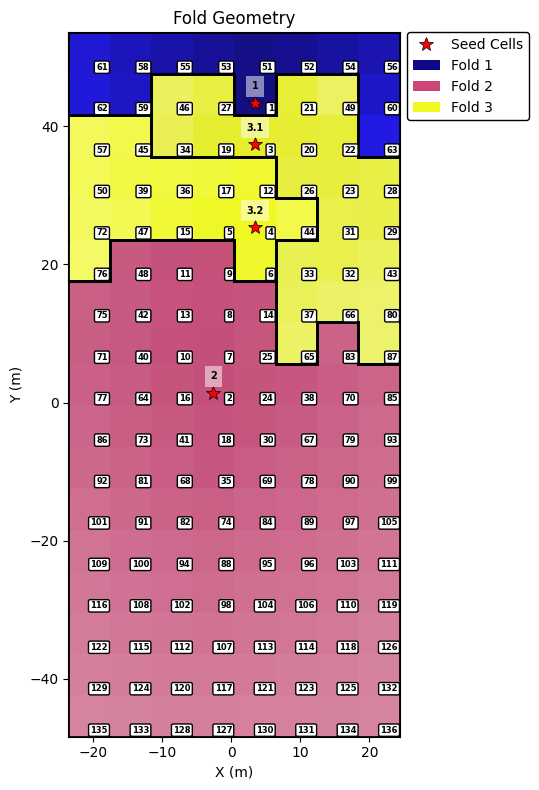

120028.98564322575
{1: {'total_count': 46672.33293320484, 'region_area': 20.0, 'per-category': {'1_WALL': 107.65000265315328, '2_FLOOR': 130.4101903101069, '3_ROOF': 203.23916039436023, '4_CEILING': 89.36514291682624, '5_FOOTPATH': 29.02097184601495, '7_COLUMN': 61.6721446179129, '8_DOOR': 169.80630718318085, '9_WINDOW': 161.41990291262135, '10_STAIR': 81.23367454994707, '11_RAILING': 55.006476683937834, '12_RWP': 167.11967545638947, '13_OTHER': 109.4962928092268}, 'aspect_ratio': 1265.625}, 2: {'total_count': 25160.076392256942, 'region_area': 7.000000000000001, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1000.0}, 3: {'total_count': 18779.397685255924, 'region_area': 11.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 26.420948616600782, '9_WINDOW': 44.2

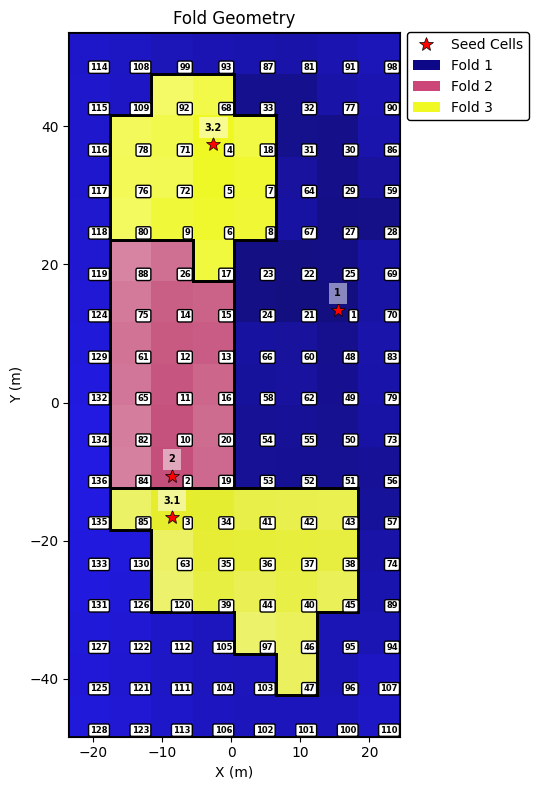

4060593.032845584
{1: {'total_count': 17404.14120461917, 'region_area': 24.0, 'per-category': {'1_WALL': 15.89417200057751, '2_FLOOR': 16.156257166883265, '3_ROOF': 0, '4_CEILING': 35.92740222416594, '5_FOOTPATH': 41.832844574780054, '7_COLUMN': 18.5985533453888, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 41.1597855227882, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 9055.40097924749, 'region_area': 9.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1001000.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1001000.0, '8_DOOR': 61.04984894259818, '9_WINDOW': 1001000.0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 1001000.0, '13_OTHER': 0}, 'aspect_ratio': 39.99999999999998}, 3: {'total_count': 14648.304306708635, 'region_area': 3.5000000000000004, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 83.388

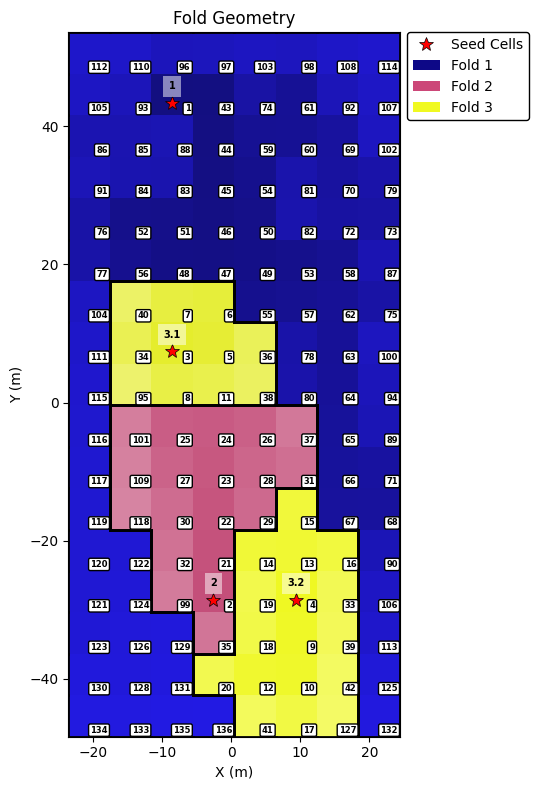

10063930.585340101
{1: {'total_count': 29295.14650881228, 'region_area': 32.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 6358.722421243343, 'region_area': 1.0, 'per-category': {'1_WALL': 78.43546235921754, '2_FLOOR': 91.37126483831354, '3_ROOF': 1001000.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1001000.0, '8_DOOR': 103.46374045801527, '9_WINDOW': 1001000.0, '10_STAIR': 0, '11_RAILING': 21.11842105263158, '12_RWP': 1001000.0, '13_OTHER': 94.22695035460994}, 'aspect_ratio': 111.11111111111106}, 3: {'total_count': 3016.3422549294737, 'region_area': 12.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 62.8280710409472, '4_CEILING': 122.39280652019842, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 1000750.0, '11_RAILING': 46.888297872340424, '12_RWP': 0, '13

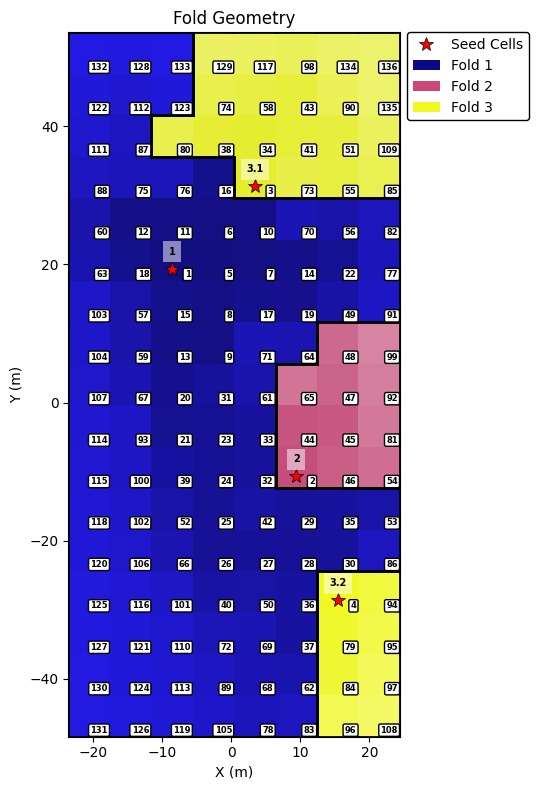

4129781.8009526976
{1: {'total_count': 51626.13733968762, 'region_area': 21.0, 'per-category': {'1_WALL': 124.3573030809033, '2_FLOOR': 171.44975435462263, '3_ROOF': 330.5968688845401, '4_CEILING': 161.38377625066076, '5_FOOTPATH': 43.037461135967234, '7_COLUMN': 4.601275917065385, '8_DOOR': 185.1254885825962, '9_WINDOW': 114.12524850894634, '10_STAIR': 145.4278202676864, '11_RAILING': 107.8173350173666, '12_RWP': 144.32282003710574, '13_OTHER': 187.57512116316644}, 'aspect_ratio': 1265.625}, 2: {'total_count': 48415.4232039752, 'region_area': 12.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 39.99999999999998}, 3: {'total_count': 18610.09465978999, 'region_area': 9.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1000750.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1000750.0, '8_DOOR': 0, '9_WINDOW': 1000750.0,

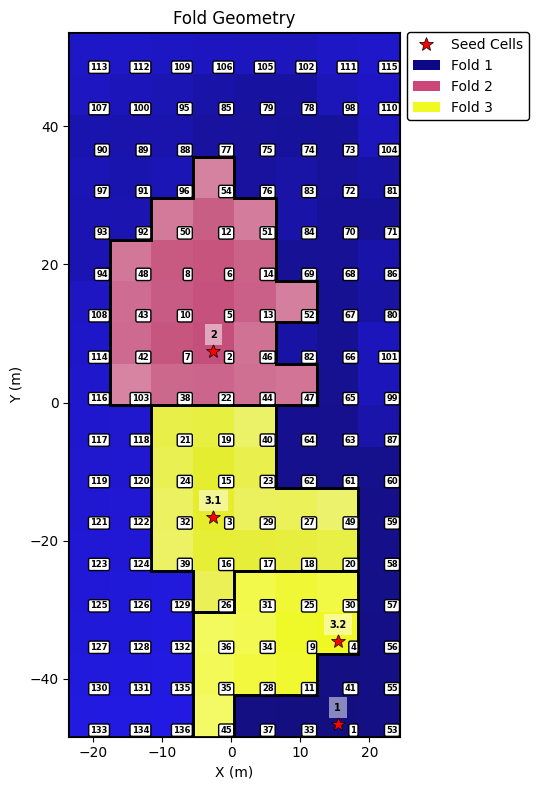

9081379.092846733
{1: {'total_count': 17582.974170209833, 'region_area': 18.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 8.945280011089537, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 14341.264206320444, 'region_area': 4.0, 'per-category': {'1_WALL': 362.08673126738944, '2_FLOOR': 268.2990317201831, '3_ROOF': 1001000.0, '4_CEILING': 203.00253641841516, '5_FOOTPATH': 93.3311125916056, '7_COLUMN': 1001000.0, '8_DOOR': 4.119524261179536, '9_WINDOW': 1001000.0, '10_STAIR': 0, '11_RAILING': 83.76588021778586, '12_RWP': 1001000.0, '13_OTHER': 740.0613496932516}, 'aspect_ratio': 0.0}, 3: {'total_count': 23531.449676782046, 'region_area': 16.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 5.281435154707041, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 10.1086956521

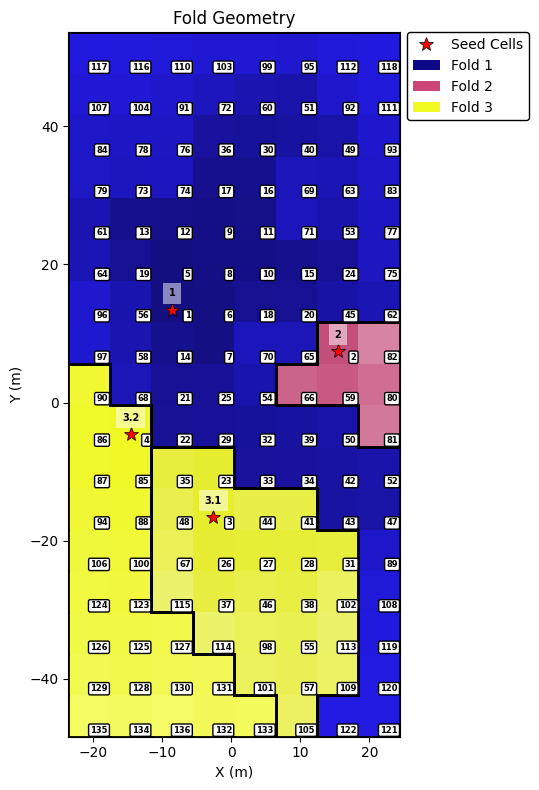

13077872.65211717
{1: {'total_count': 21718.241393900204, 'region_area': 36.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 2.645941623350661, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 10472.382480476537, 'region_area': 4.0, 'per-category': {'1_WALL': 133.01064344460573, '2_FLOOR': 73.75619425173439, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 6.133421110379643, '7_COLUMN': 1001000.0, '8_DOOR': 160.03658536585365, '9_WINDOW': 289.22818791946304, '10_STAIR': 1001000.0, '11_RAILING': 260.9803921568627, '12_RWP': 1001000.0, '13_OTHER': 151.47842056932967}, 'aspect_ratio': 62.5}, 3: {'total_count': 17327.909632799554, 'region_area': 0.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 38.22081798552013, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0,

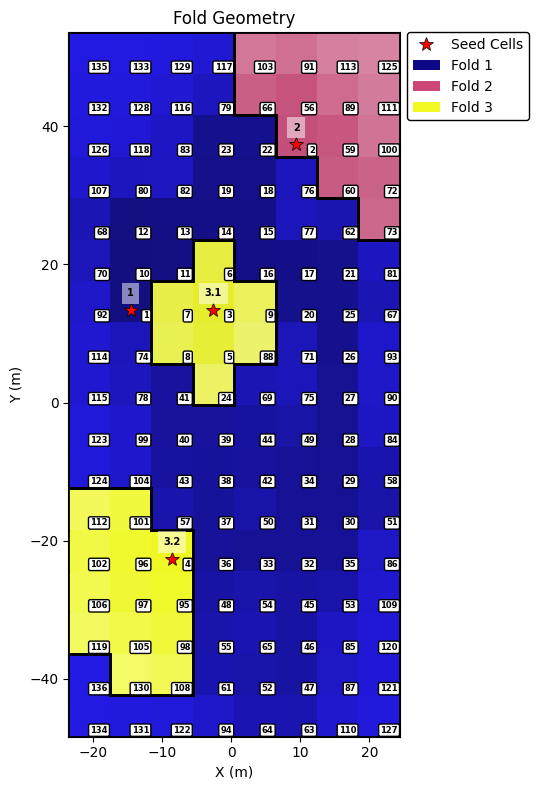

38853.77239190705
{1: {'total_count': 717.3900758045211, 'region_area': 44.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 5.694046721929149, '3_ROOF': 138.37125, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 22.81835205992509, '8_DOOR': 19.441140985866937, '9_WINDOW': 23.90057518488086, '10_STAIR': 9.287994891443178, '11_RAILING': 0, '12_RWP': 12.267689684569484, '13_OTHER': 18.775605524788155}, 'aspect_ratio': 1265.625}, 2: {'total_count': 7713.082502027179, 'region_area': 2.0, 'per-category': {'1_WALL': 42.116553555621124, '2_FLOOR': 107.63286454478164, '3_ROOF': 102.51725724804417, '4_CEILING': 99.85431096250298, '5_FOOTPATH': 99.60792406108129, '7_COLUMN': 0, '8_DOOR': 333.39430894308936, '9_WINDOW': 0, '10_STAIR': 3.347556370916501, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 48.91789015769441}, 'aspect_ratio': 1000.0}, 3: {'total_count': 1771.407638434402, 'region_area': 4.5, 'per-category': {'1_WALL': 43.36022145493511, '2_FLOOR': 48.597259499929365, '3_ROOF': 0, '4_CEILING': 351.5053

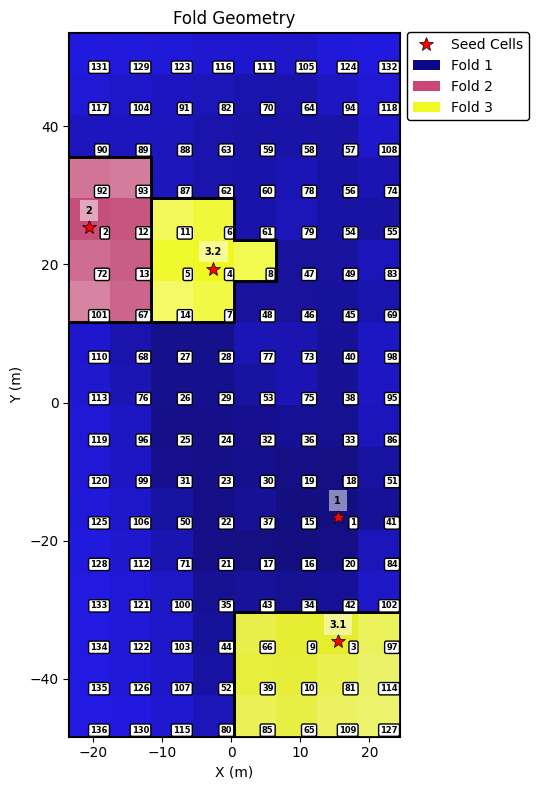

5073850.197790285
{1: {'total_count': 4768.377153426462, 'region_area': 42.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 17.59461342001394, '3_ROOF': 144.92293860775757, '4_CEILING': 7.272305932470817, '5_FOOTPATH': 0, '7_COLUMN': 18.885196374622357, '8_DOOR': 20.134783739273633, '9_WINDOW': 20.97801668806163, '10_STAIR': 11.277633289986998, '11_RAILING': 0, '12_RWP': 4.102766798418973, '13_OTHER': 35.60524110611716}, 'aspect_ratio': 1265.625}, 2: {'total_count': 17256.770303685425, 'region_area': 7.000000000000001, 'per-category': {'1_WALL': 314.42446398840457, '2_FLOOR': 865.1476979552674, '3_ROOF': 1001000.0, '4_CEILING': 811.1686479808203, '5_FOOTPATH': 23.890881870886695, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 1001000.0, '10_STAIR': 300.96446700507613, '11_RAILING': 9.44863185725114, '12_RWP': 1001000.0, '13_OTHER': 740.0613496932516}, 'aspect_ratio': 4000.0}, 3: {'total_count': 29244.63031773647, 'region_area': 6.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_RO

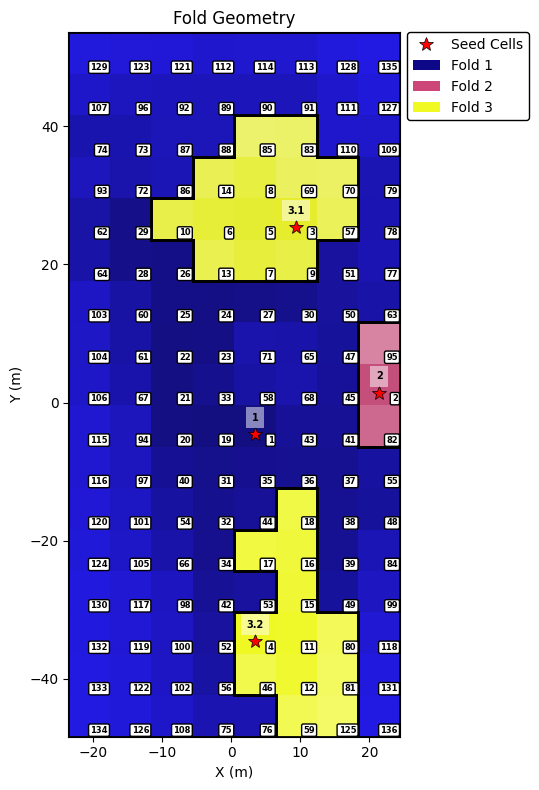

11077003.740076354
{1: {'total_count': 20508.853294673994, 'region_area': 37.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 2.9178733199673377, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 562.5}, 2: {'total_count': 13414.600247497303, 'region_area': 2.0, 'per-category': {'1_WALL': 358.7854829491332, '2_FLOOR': 227.6243868255081, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 42.894425842032696, '7_COLUMN': 1001000.0, '8_DOOR': 382.420814479638, '9_WINDOW': 289.22818791946304, '10_STAIR': 1001000.0, '11_RAILING': 311.6056910569106, '12_RWP': 1001000.0, '13_OTHER': 211.9134396355353}, 'aspect_ratio': 62.5}, 3: {'total_count': 10641.16794383575, 'region_area': 4.5, 'per-category': {'1_WALL': 213.59037242816217, '2_FLOOR': 1000750.0, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 63.46890491212258, '7_COLUMN': 1000750.0, '8_DOOR': 255.38333333333335

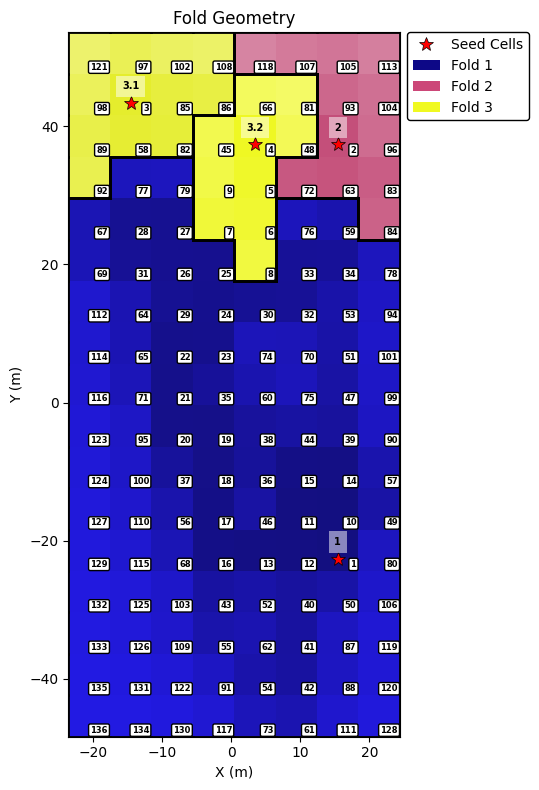

7070889.226365863
{1: {'total_count': 15904.40594943765, 'region_area': 28.000000000000004, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 15.746975276170442, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 17.817365269461078, '8_DOOR': 0, '9_WINDOW': 2.7299359585774616, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1000.0}, 2: {'total_count': 5167.711931200172, 'region_area': 7.000000000000001, 'per-category': {'1_WALL': 56.58787957604525, '2_FLOOR': 98.12967933323915, '3_ROOF': 0, '4_CEILING': 502.0071942446043, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 485.79670329670324, '9_WINDOW': 33.321839080459775, '10_STAIR': 51.90384615384617, '11_RAILING': 0, '12_RWP': 46.81159420289855, '13_OTHER': 60.43350908025776}, 'aspect_ratio': 1777.777777777778}, 3: {'total_count': 17389.084749464622, 'region_area': 6.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 92

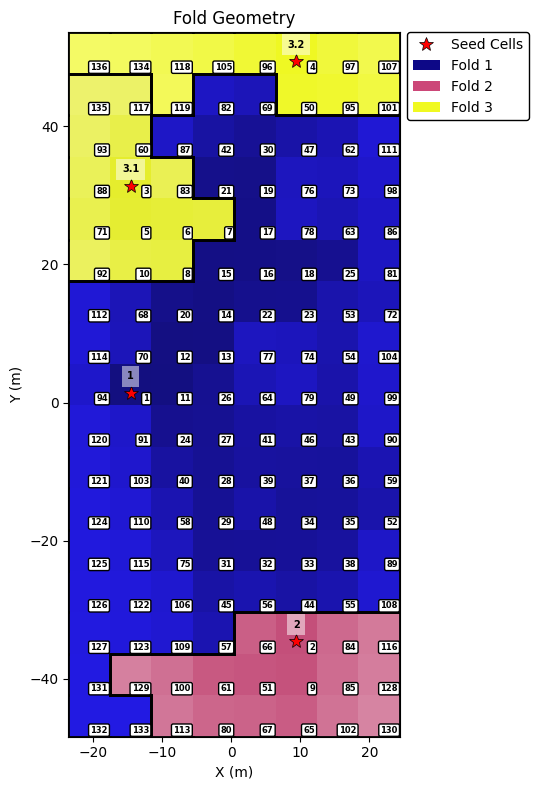

7066255.938140197
{1: {'total_count': 22413.181527425717, 'region_area': 33.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0.9189111103977439, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 10566.04203284696, 'region_area': 8.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 81.47234042553191, '9_WINDOW': 35.0291036088475, '10_STAIR': 4.622516556291387, '11_RAILING': 101.70318725099601, '12_RWP': 46.81159420289855, '13_OTHER': 0}, 'aspect_ratio': 62.5}, 3: {'total_count': 10887.415030690812, 'region_area': 3.5000000000000004, 'per-category': {'1_WALL': 282.89670341318634, '2_FLOOR': 264.5988985444993, '3_ROOF': 22.10013580369068, '4_CEILING': 335.2254549983472, '5_FOOTPATH': 84.9757776644569, '7_COLUMN': 0, '8_DOOR': 41.683179446344006, '9_WINDOW': 395.7311039457711, '10_STAI

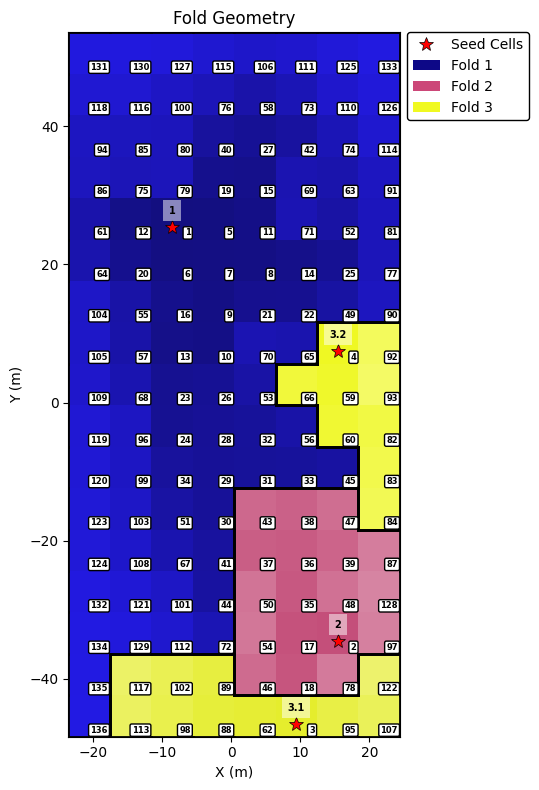

13084955.897434484
{1: {'total_count': 28341.798787731554, 'region_area': 41.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 13944.329866800894, 'region_area': 6.0, 'per-category': {'1_WALL': 239.22594731652347, '2_FLOOR': 8.64760524730661, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 139.1150296638102, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 0, '12_RWP': 1001000.0, '13_OTHER': 1001000.0}, 'aspect_ratio': 0.0}, 3: {'total_count': 13038.184253625699, 'region_area': 6.5, 'per-category': {'1_WALL': 85.52138163127, '2_FLOOR': 701.1170253692425, '3_ROOF': 503.4617897138998, '4_CEILING': 691.86087179626, '5_FOOTPATH': 328.76773049645396, '7_COLUMN': 73.30152671755725, '8_DOOR': 1000750.0, '9_WINDOW': 1000750.0, '10_STAIR': 

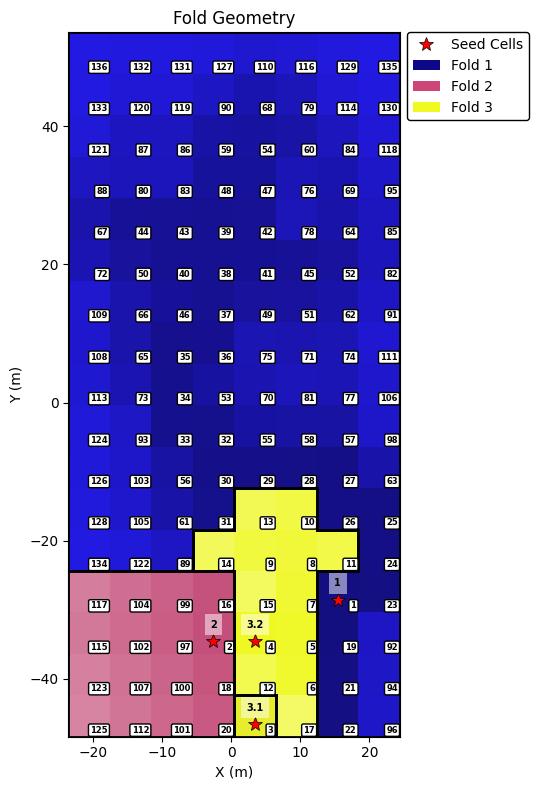

9076926.219349679
{1: {'total_count': 22194.900316358486, 'region_area': 40.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 15761.037473718769, 'region_area': 1.0, 'per-category': {'1_WALL': 804.1355359489394, '2_FLOOR': 3.0092355555554615, '3_ROOF': 852.8319836228073, '4_CEILING': 115.35153581449383, '5_FOOTPATH': 178.17292944785277, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 121.74697908021834, '10_STAIR': 1001000.0, '11_RAILING': 1001000.0, '12_RWP': 1001000.0, '13_OTHER': 441.517430769813}, 'aspect_ratio': 2250.0}, 3: {'total_count': 16279.179599623341, 'region_area': 6.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 78.26331967213113, '10_STAIR': 0, '11_RAILING': 36.83108108108109, '12_RWP': 4

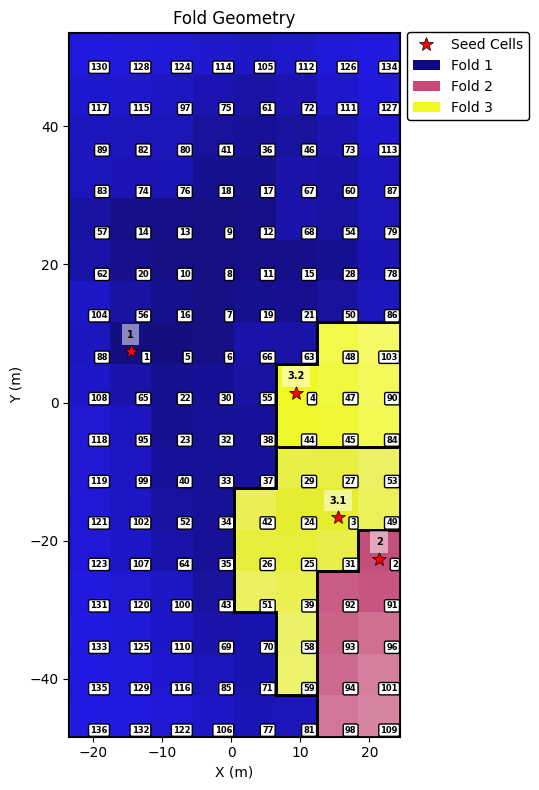

15082920.966003142
{1: {'total_count': 14998.087670431827, 'region_area': 23.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 13.875573532963054, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 24561.678071075694, 'region_area': 22.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0.8656575212866532, '9_WINDOW': 33.321839080459775, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 46.81159420289855, '13_OTHER': 0}, 'aspect_ratio': 111.11111111111106}, 3: {'total_count': 11500.036861268927, 'region_area': 0.5, 'per-category': {'1_WALL': 6.245378992960124, '2_FLOOR': 269.873417721519, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 63.12584320191877, '7_COLUMN': 1000750.0, '8_DOOR': 498.9606741573034, '9_WINDOW': 1.1175830721636961, '10_STAIR': 1000750.0, '11_RAILING': 477.5, '

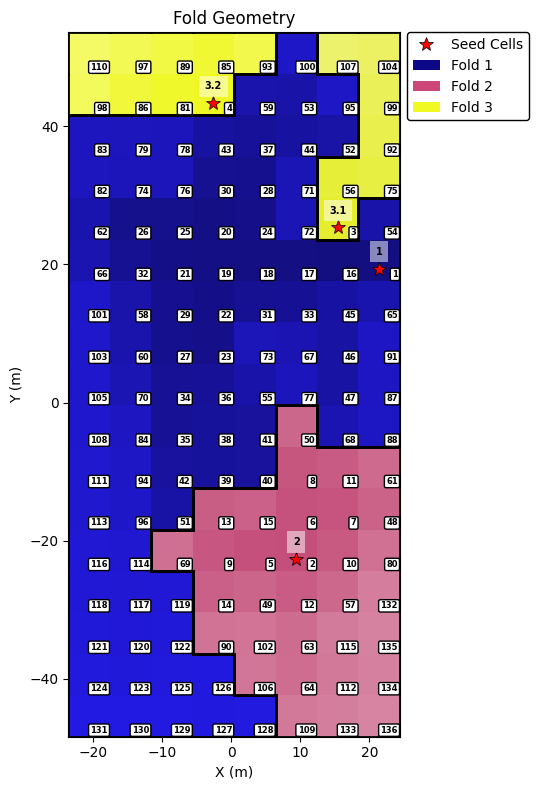

4079494.4181757
{1: {'total_count': 26494.7334667576, 'region_area': 12.0, 'per-category': {'1_WALL': 29.743816620526164, '2_FLOOR': 25.908268537572333, '3_ROOF': 0, '4_CEILING': 61.12613680125603, '5_FOOTPATH': 85.59094397544132, '7_COLUMN': 18.5985533453888, '8_DOOR': 4.233661728209365, '9_WINDOW': 0, '10_STAIR': 25.47287390029324, '11_RAILING': 57.94516438684906, '12_RWP': 0, '13_OTHER': 7.409038798045008}, 'aspect_ratio': 1265.625}, 2: {'total_count': 16082.217722727197, 'region_area': 14.000000000000002, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1001000.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1001000.0, '8_DOOR': 0, '9_WINDOW': 1001000.0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 1001000.0, '13_OTHER': 0}, 'aspect_ratio': 27.777777777777803}, 3: {'total_count': 13896.085425469468, 'region_area': 2.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0

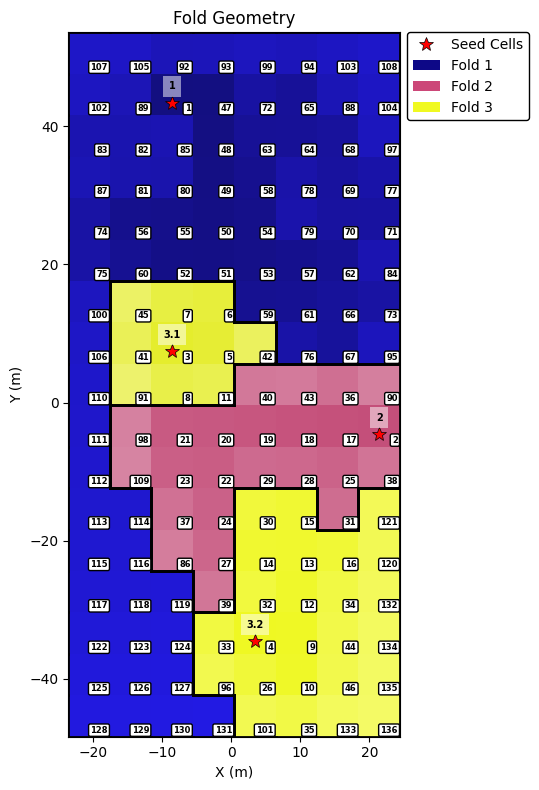

89384.2018509981
{1: {'total_count': 32885.411289135554, 'region_area': 15.0, 'per-category': {'1_WALL': 37.986085093816534, '2_FLOOR': 58.97604017717018, '3_ROOF': 194.80109244563536, '4_CEILING': 24.093335766922944, '5_FOOTPATH': 60.25513585155732, '7_COLUMN': 92.70812928501468, '8_DOOR': 39.17009739933728, '9_WINDOW': 70.1116877256318, '10_STAIR': 60.90097148229395, '11_RAILING': 20.596885020613833, '12_RWP': 36.89189189189189, '13_OTHER': 95.46392884594268}, 'aspect_ratio': 1265.625}, 2: {'total_count': 20750.26780347006, 'region_area': 10.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 159.99999999999991}, 3: {'total_count': 14442.831784191512, 'region_area': 4.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 143.79629629

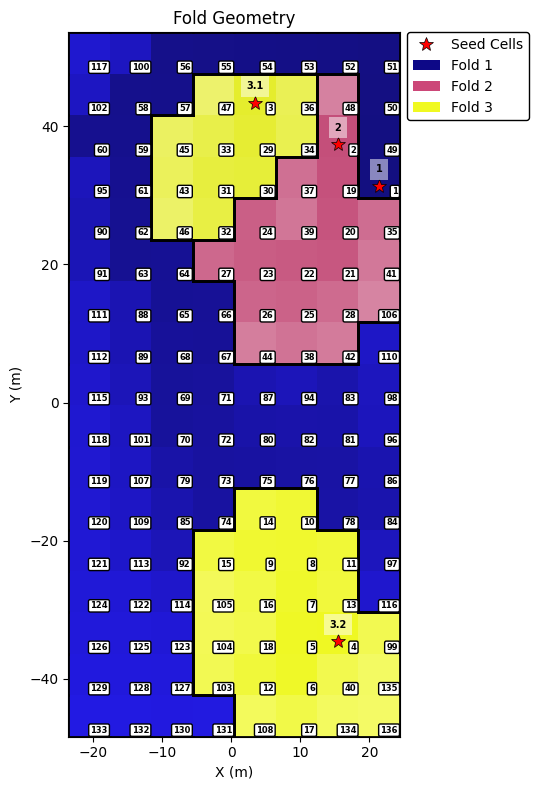

7072339.3816978475
{1: {'total_count': 13935.690886102186, 'region_area': 28.999999999999996, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 18.196999699217958, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 3.7452010507173084, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 12199.986385460652, 'region_area': 1.0, 'per-category': {'1_WALL': 164.7498900615655, '2_FLOOR': 177.66328089210913, '3_ROOF': 682.5652983995429, '4_CEILING': 176.22958323362062, '5_FOOTPATH': 26.753734602952754, '7_COLUMN': 72.97142857142858, '8_DOOR': 4.119524261179536, '9_WINDOW': 439.48837209302326, '10_STAIR': 0, '11_RAILING': 31.414665801427642, '12_RWP': 1001000.0, '13_OTHER': 574.5320197044334}, 'aspect_ratio': 111.11111111111106}, 3: {'total_count': 11019.463029578581, 'region_area': 2.5, 'per-category': {'1_WALL': 258.2157378024594, '2_FLOOR': 1000750.0, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 87

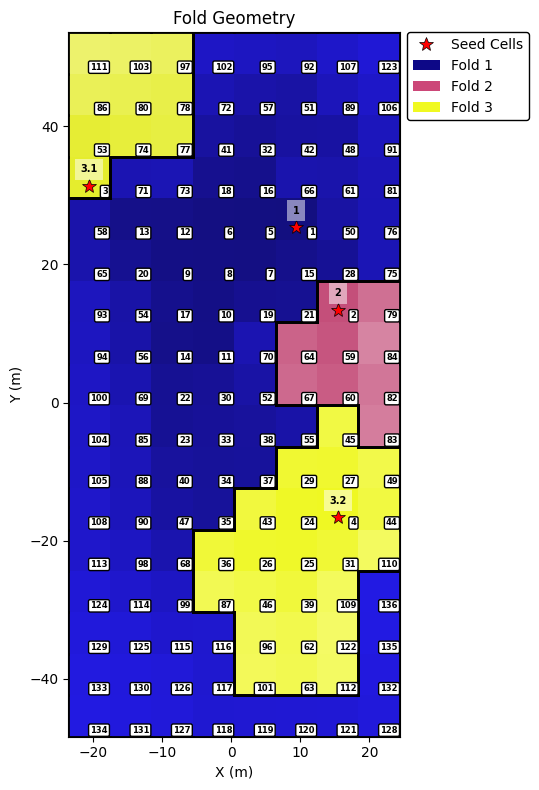

7070219.642363045
{1: {'total_count': 26750.881964562075, 'region_area': 42.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 14968.448103192024, 'region_area': 1.0, 'per-category': {'1_WALL': 377.6209837366125, '2_FLOOR': 1001000.0, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 150.20693222969476, '7_COLUMN': 1001000.0, '8_DOOR': 373.84444444444443, '9_WINDOW': 1001000.0, '10_STAIR': 537.7994158467112, '11_RAILING': 2.440913216397481, '12_RWP': 1001000.0, '13_OTHER': 321.97226502311247}, 'aspect_ratio': 0.0}, 3: {'total_count': 9378.339720534848, 'region_area': 0.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 32.725027442371015, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 64.56249999999999, '11_RAILING': 12.505555555555564, '12_R

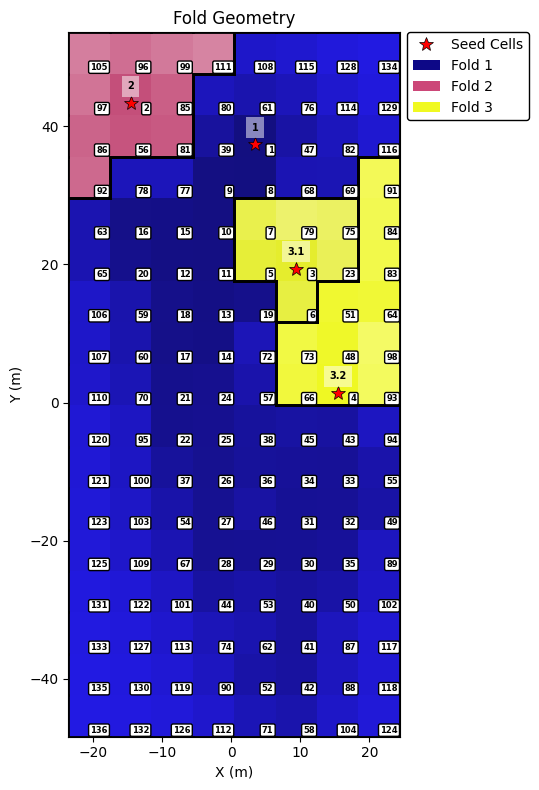

116832.83239979703
{1: {'total_count': 45503.34933929428, 'region_area': 5.0, 'per-category': {'1_WALL': 68.24386272275844, '2_FLOOR': 107.94306829068013, '3_ROOF': 110.76149425287355, '4_CEILING': 160.48249604903978, '5_FOOTPATH': 126.0805206635344, '7_COLUMN': 84.22752808988764, '8_DOOR': 56.01024313372355, '9_WINDOW': 38.23524019068574, '10_STAIR': 933.0684104627769, '11_RAILING': 51.35276532137519, '12_RWP': 67.75796178343947, '13_OTHER': 101.93874078275665}, 'aspect_ratio': 1265.625}, 2: {'total_count': 21742.395085150354, 'region_area': 9.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 0.0}, 3: {'total_count': 28615.697193874228, 'region_area': 14.499999999999998, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAIL

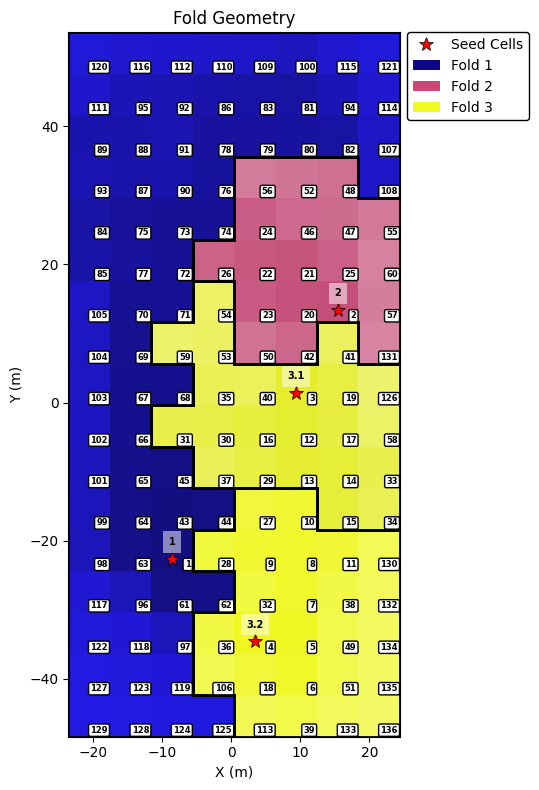

6080909.098933499
{1: {'total_count': 12565.985657080519, 'region_area': 31.0, 'per-category': {'1_WALL': 4.5315202510935215, '2_FLOOR': 20.72781206133963, '3_ROOF': 47.98773863107249, '4_CEILING': 51.67693809258227, '5_FOOTPATH': 4.062396557431307, '7_COLUMN': 0, '8_DOOR': 14.224081094445362, '9_WINDOW': 3.0388137214705497, '10_STAIR': 3.140819606267583, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 58.469687527819815}, 'aspect_ratio': 1265.625}, 2: {'total_count': 14937.590139445882, 'region_area': 0.0, 'per-category': {'1_WALL': 374.2816346627277, '2_FLOOR': 1001000.0, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 148.79115226337447, '7_COLUMN': 1001000.0, '8_DOOR': 373.84444444444443, '9_WINDOW': 1001000.0, '10_STAIR': 109.8919575795085, '11_RAILING': 703.6111111111112, '12_RWP': 1001000.0, '13_OTHER': 321.97226502311247}, 'aspect_ratio': 111.11111111111106}, 3: {'total_count': 19727.660911434356, 'region_area': 2.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0,

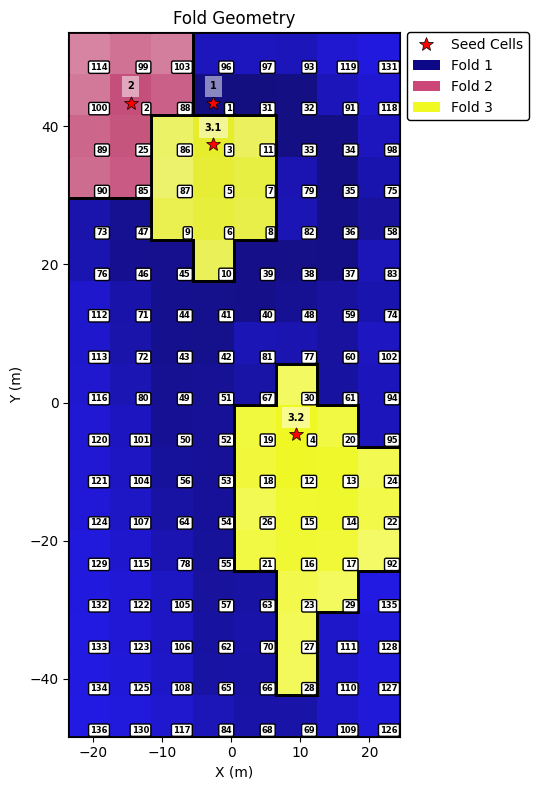

89440.4707489783
{1: {'total_count': 33652.36081679457, 'region_area': 24.0, 'per-category': {'1_WALL': 44.696036199262316, '2_FLOOR': 68.9831325301205, '3_ROOF': 137.85589555962085, '4_CEILING': 97.8874699847195, '5_FOOTPATH': 20.884603553026228, '7_COLUMN': 13.665511265164636, '8_DOOR': 52.05650027427316, '9_WINDOW': 23.90057518488086, '10_STAIR': 26.868050407709422, '11_RAILING': 8.70550829961187, '12_RWP': 12.267689684569484, '13_OTHER': 111.11124288425047}, 'aspect_ratio': 1265.625}, 2: {'total_count': 30715.930436244456, 'region_area': 26.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 33.321839080459775, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 46.81159420289855, '13_OTHER': 0}, 'aspect_ratio': 111.11111111111106}, 3: {'total_count': 1700.954674995255, 'region_area': 2.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 211.27359839816936, '7_COLUMN': 0, '8

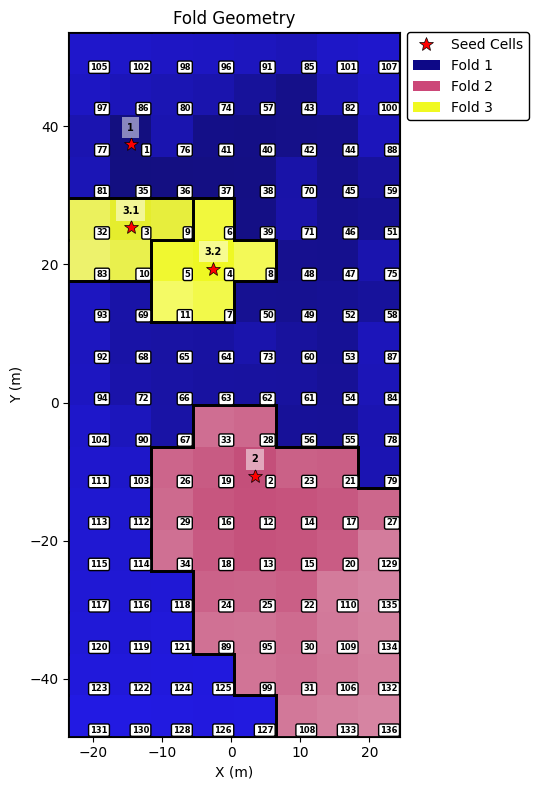

15090793.741135215
{1: {'total_count': 15130.074617479117, 'region_area': 32.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1.2873127722105984, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 4.9902520540314725, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 6.631578947368422, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 16289.876093878773, 'region_area': 3.0, 'per-category': {'1_WALL': 4.805440749240743, '2_FLOOR': 4.360213332739365, '3_ROOF': 1001000.0, '4_CEILING': 115.35153581449383, '5_FOOTPATH': 310.80124575311436, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 886.2062970436473, '10_STAIR': 1001000.0, '11_RAILING': 1001000.0, '12_RWP': 1001000.0, '13_OTHER': 631.1655476377447}, 'aspect_ratio': 1000.0}, 3: {'total_count': 28462.04890658305, 'region_area': 11.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '

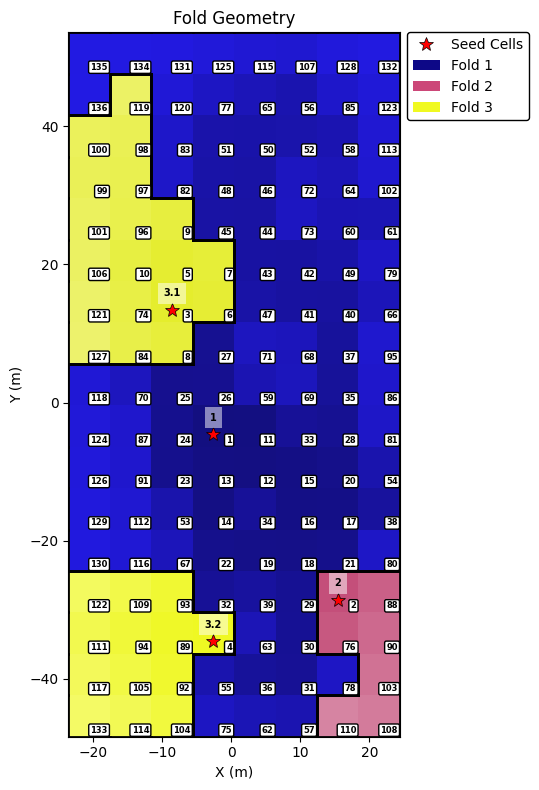

101528.2398062801
{1: {'total_count': 38356.96111838366, 'region_area': 24.0, 'per-category': {'1_WALL': 72.45714207018125, '2_FLOOR': 98.41211804648734, '3_ROOF': 167.45722300140255, '4_CEILING': 39.593855866954115, '5_FOOTPATH': 7.686401004795615, '7_COLUMN': 49.85148514851485, '8_DOOR': 306.6886737089202, '9_WINDOW': 226.94492627927147, '10_STAIR': 122.84505208333336, '11_RAILING': 35.85664155227577, '12_RWP': 193.95089285714283, '13_OTHER': 60.39736889529644}, 'aspect_ratio': 1265.625}, 2: {'total_count': 23864.866786319828, 'region_area': 11.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 39.99999999999998}, 3: {'total_count': 9602.595778483099, 'region_area': 2.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 9.831701655228109, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STA

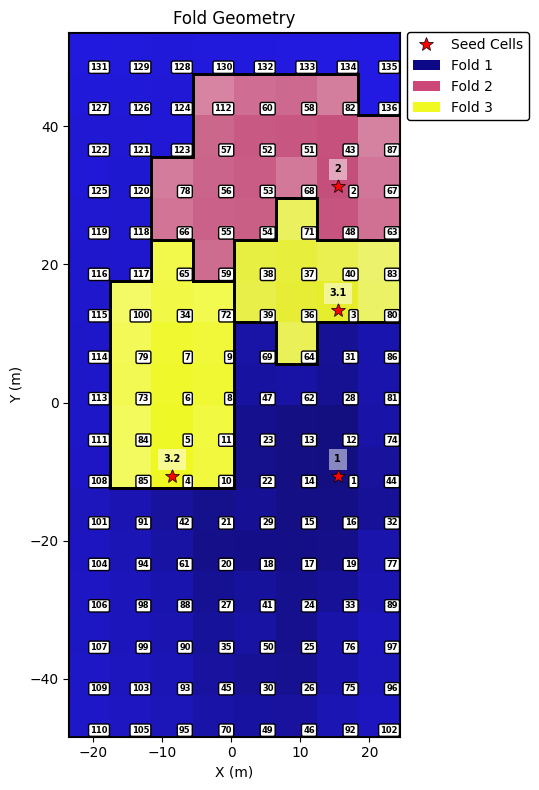

4082334.7678588326
{1: {'total_count': 19057.67225423488, 'region_area': 31.0, 'per-category': {'1_WALL': 28.581588102171494, '2_FLOOR': 28.988369789750696, '3_ROOF': 69.44819619690776, '4_CEILING': 11.588022895595264, '5_FOOTPATH': 0, '7_COLUMN': 43.19868995633188, '8_DOOR': 93.22389516241459, '9_WINDOW': 116.21307714367651, '10_STAIR': 36.624534326769556, '11_RAILING': 21.229968686682632, '12_RWP': 120.95637583892616, '13_OTHER': 15.492765847012267}, 'aspect_ratio': 1265.625}, 2: {'total_count': 23473.096534819346, 'region_area': 6.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 0.0}, 3: {'total_count': 21549.75201328628, 'region_area': 7.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 99.46969696969695, '11_RAILING': 0, '1

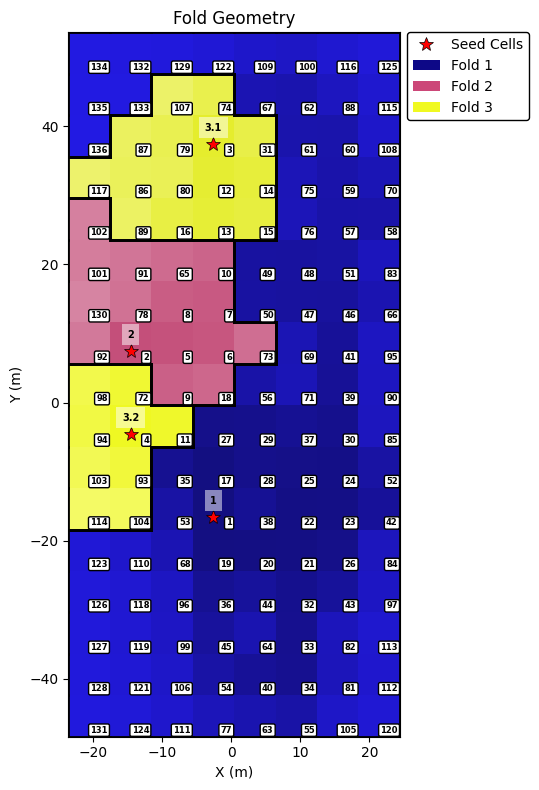

74924.8494574055
{1: {'total_count': 19304.95955767072, 'region_area': 19.0, 'per-category': {'1_WALL': 18.4963568576241, '2_FLOOR': 20.447086801426863, '3_ROOF': 0, '4_CEILING': 46.88058653560531, '5_FOOTPATH': 42.88143681730727, '7_COLUMN': 18.5985533453888, '8_DOOR': 1.2562098188194075, '9_WINDOW': 0, '10_STAIR': 3.5986682808716663, '11_RAILING': 24.651041666666657, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 8446.094076862384, 'region_area': 8.0, 'per-category': {'1_WALL': 98.53786223669567, '2_FLOOR': 216.53351387948538, '3_ROOF': 0, '4_CEILING': 837.0548712206047, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 49.51457365722818, '9_WINDOW': 108.24057450628365, '10_STAIR': 185.16245487364625, '11_RAILING': 0, '12_RWP': 189.42857142857144, '13_OTHER': 160.8190476190476}, 'aspect_ratio': 562.5}, 3: {'total_count': 16698.90016112131, 'region_area': 9.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '

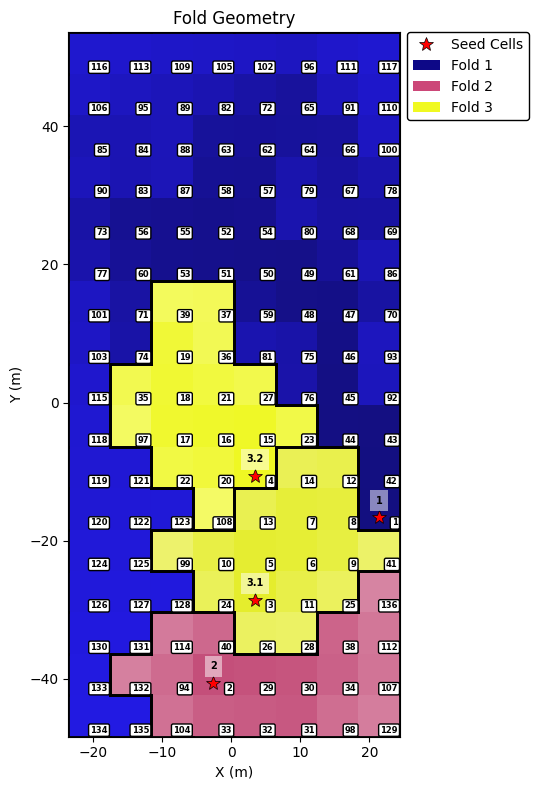

40553.90285406089
{1: {'total_count': 9707.687303261751, 'region_area': 37.0, 'per-category': {'1_WALL': 9.27177502111707, '2_FLOOR': 9.481572216017586, '3_ROOF': 10.771598962165505, '4_CEILING': 7.675792849507064, '5_FOOTPATH': 9.782267076407308, '7_COLUMN': 18.81340579710143, '8_DOOR': 0.3689622709826852, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 1.937195074730893, '12_RWP': 5.436349079263407, '13_OTHER': 0.38856304985336837}, 'aspect_ratio': 1265.625}, 2: {'total_count': 19096.973099284303, 'region_area': 15.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 54.29088277858177, '9_WINDOW': 33.321839080459775, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 46.81159420289855, '13_OTHER': 0}, 'aspect_ratio': 159.99999999999991}, 3: {'total_count': 5935.609765348126, 'region_area': 3.5000000000000004, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 378.33516483516485, '7_COLUMN': 219.75

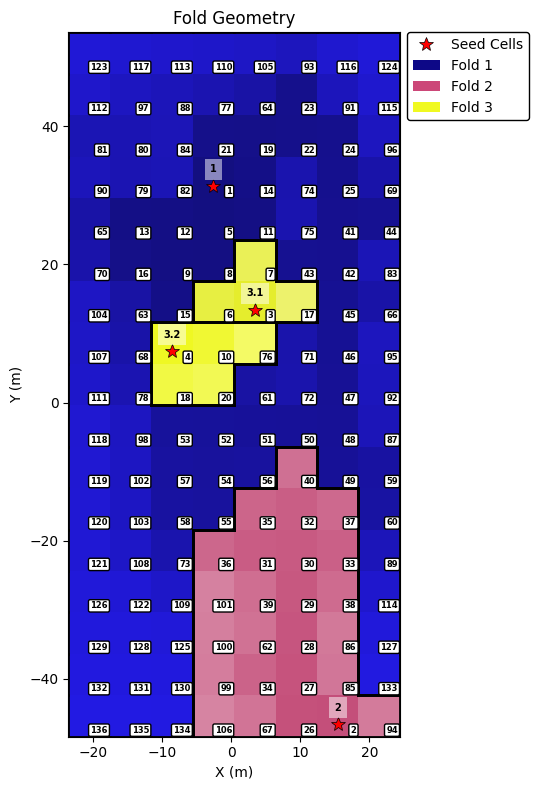

5193517.4899421735
{1: {'total_count': 74772.8327477346, 'region_area': 22.0, 'per-category': {'1_WALL': 528.826855478558, '2_FLOOR': 1669.8776936517181, '3_ROOF': 81.98747479329658, '4_CEILING': 1362.9195804195804, '5_FOOTPATH': 216.843882281798, '7_COLUMN': 1401.9465648854962, '8_DOOR': 2157.3208469055376, '9_WINDOW': 1678.14858490566, '10_STAIR': 254.09310344827588, '11_RAILING': 53.59568261376897, '12_RWP': 1006500.0, '13_OTHER': 2379.2339832869075}, 'aspect_ratio': 250.0}, 2: {'total_count': 67456.44376914437, 'region_area': 46.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 0.0}, 3: {'total_count': 14117.435685525154, 'region_area': 11.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 48.35111317254173, '9_WINDOW': 15.221854304635755, '10_STAIR': 0, '

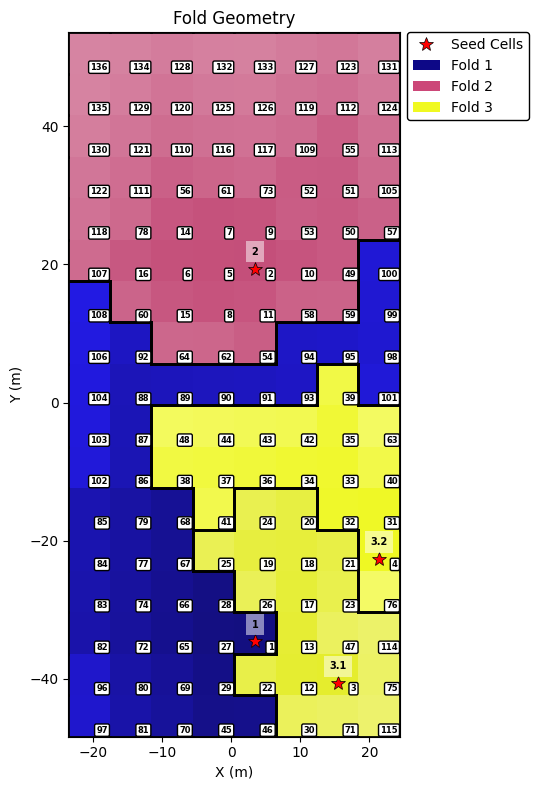

5061225.3040605765
{1: {'total_count': 17246.474687277627, 'region_area': 38.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 16.907308377896616, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 15467.332026746579, 'region_area': 1.0, 'per-category': {'1_WALL': 471.332147093713, '2_FLOOR': 2.2684746322896627, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 422.30021598272134, '7_COLUMN': 1001000.0, '8_DOOR': 847.6888888888889, '9_WINDOW': 620.4347826086956, '10_STAIR': 1001000.0, '11_RAILING': 196.93548387096774, '12_RWP': 1001000.0, '13_OTHER': 516.8018018018017}, 'aspect_ratio': 1000.0}, 3: {'total_count': 10165.943480189564, 'region_area': 4.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 20.501095290251918, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP':

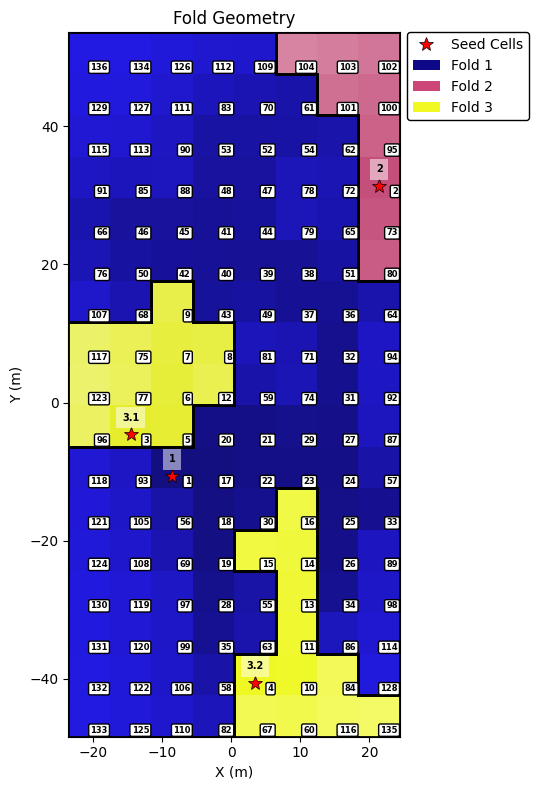

21093494.317027614
{1: {'total_count': 40284.75352177058, 'region_area': 40.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 765.625}, 2: {'total_count': 15133.76825414889, 'region_area': 0.0, 'per-category': {'1_WALL': 328.1562805582719, '2_FLOOR': 1001000.0, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 286.40479360852197, '7_COLUMN': 1001000.0, '8_DOOR': 373.84444444444443, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 1001000.0, '12_RWP': 1001000.0, '13_OTHER': 321.97226502311247}, 'aspect_ratio': 111.11111111111106}, 3: {'total_count': 12774.266376537826, 'region_area': 6.5, 'per-category': {'1_WALL': 43.868325278032664, '2_FLOOR': 1.7069186749822907, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 259.85863095238096, '7_COLUMN': 1000750.0, '8_DOOR': 1000750.0, '9_WINDOW': 1000750.0

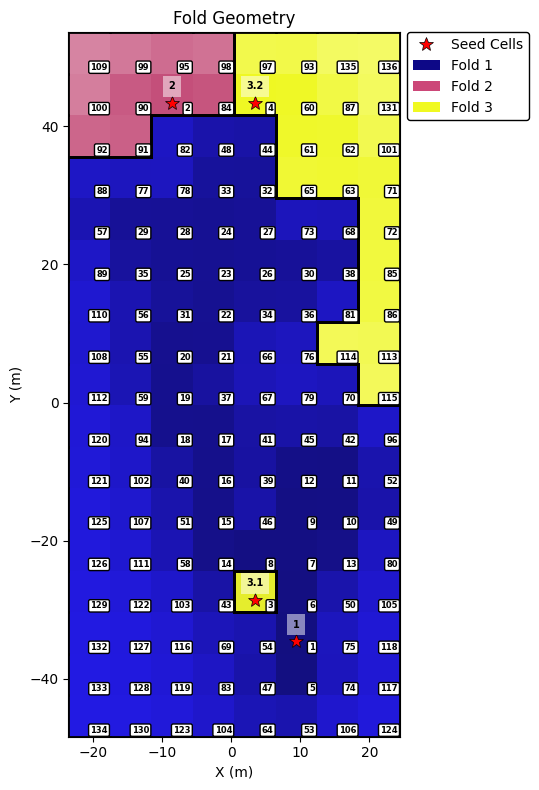

54844.34707929352
{1: {'total_count': 10667.81848304472, 'region_area': 15.0, 'per-category': {'1_WALL': 9.295427250764565, '2_FLOOR': 6.619886323766757, '3_ROOF': 15.746975276170442, '4_CEILING': 13.103243917654392, '5_FOOTPATH': 10.977195439087817, '7_COLUMN': 17.95863309352518, '8_DOOR': 0.551001160766089, '9_WINDOW': 2.548286180631115, '10_STAIR': 0, '11_RAILING': 3.2242001254705244, '12_RWP': 0, '13_OTHER': 25.13813708260107}, 'aspect_ratio': 250.0}, 2: {'total_count': 18889.894702523336, 'region_area': 15.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 121.77820267686427, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 96.69902912621359, '13_OTHER': 0}, 'aspect_ratio': 360.0000000000001}, 3: {'total_count': 14711.315893108174, 'region_area': 0.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 186.97587025316454, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAI

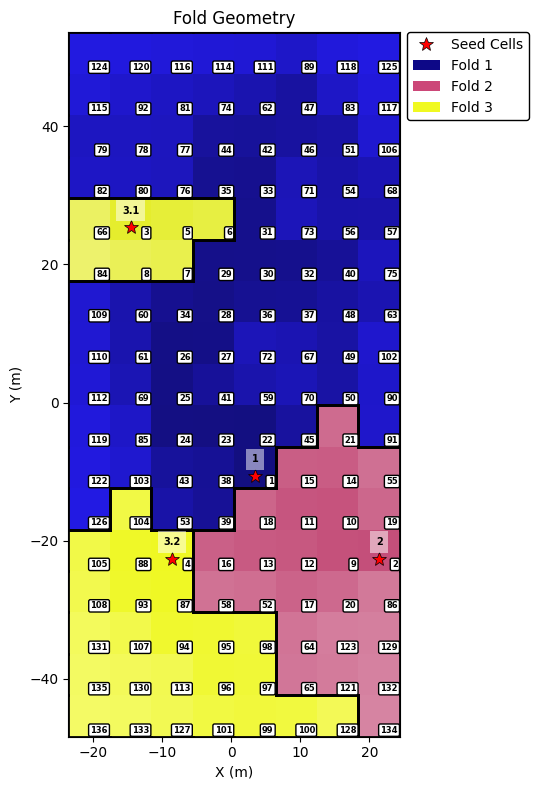

96228.3400276956
{1: {'total_count': 35205.4083659591, 'region_area': 25.0, 'per-category': {'1_WALL': 40.57099687032738, '2_FLOOR': 79.18628876921265, '3_ROOF': 211.5624659623135, '4_CEILING': 132.58081758316942, '5_FOOTPATH': 19.96660942568211, '7_COLUMN': 12.753581661891124, '8_DOOR': 75.79845256215118, '9_WINDOW': 89.05090270812437, '10_STAIR': 103.82493052798729, '11_RAILING': 5.957900668115595, '12_RWP': 33.02020202020203, '13_OTHER': 281.25722852859275}, 'aspect_ratio': 1265.625}, 2: {'total_count': 19432.448484702727, 'region_area': 1.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 109.1610206140983, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 111.11111111111106}, 3: {'total_count': 13826.272578473914, 'region_area': 7.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR

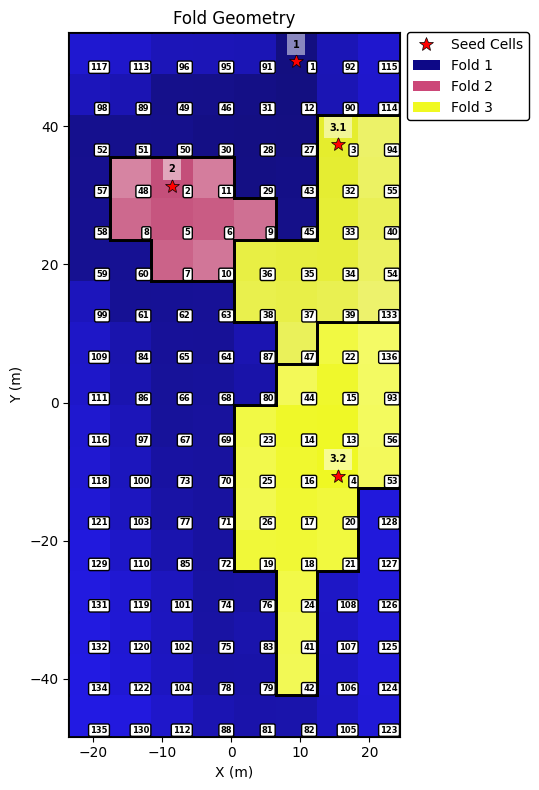

15101720.016765153
{1: {'total_count': 44644.64436227041, 'region_area': 60.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 15906.217323613537, 'region_area': 9.0, 'per-category': {'1_WALL': 7.9791913090032045, '2_FLOOR': 616.3227783452503, '3_ROOF': 1001000.0, '4_CEILING': 262.09000432713106, '5_FOOTPATH': 449.8105342932928, '7_COLUMN': 1001000.0, '8_DOOR': 546.1515151515151, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 1001000.0, '12_RWP': 1001000.0, '13_OTHER': 423.63288718929255}, 'aspect_ratio': 0.0}, 3: {'total_count': 7920.592854046546, 'region_area': 0.5, 'per-category': {'1_WALL': 129.5385079748364, '2_FLOOR': 10.778828005018758, '3_ROOF': 519.1202863171769, '4_CEILING': 511.09298928919185, '5_FOOTPATH': 0, '7_COLUMN': 29.728571428571435, '8_DOOR': 3.8575233268595754, '9

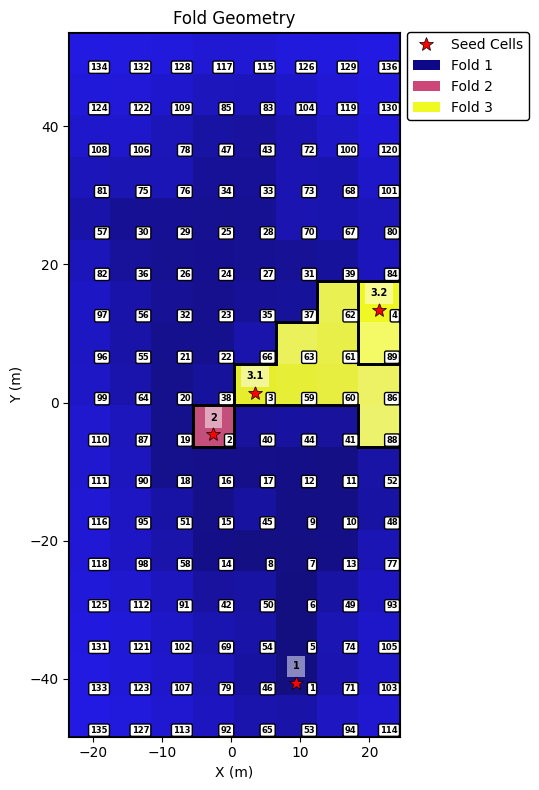

6064174.537178949
{1: {'total_count': 7546.632171393864, 'region_area': 38.0, 'per-category': {'1_WALL': 11.558248344772034, '2_FLOOR': 11.253157605711154, '3_ROOF': 32.195905351696084, '4_CEILING': 0.9097233817554559, '5_FOOTPATH': 0, '7_COLUMN': 2.8515420805018254, '8_DOOR': 32.60572139303482, '9_WINDOW': 40.21480379393715, '10_STAIR': 33.70703124999999, '11_RAILING': 9.738641100458537, '12_RWP': 73.7335092348285, '13_OTHER': 1.7659501486393874}, 'aspect_ratio': 1265.625}, 2: {'total_count': 12626.425562471606, 'region_area': 3.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0.5648738563903486, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 250.0}, 3: {'total_count': 22805.10020163014, 'region_area': 6.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12

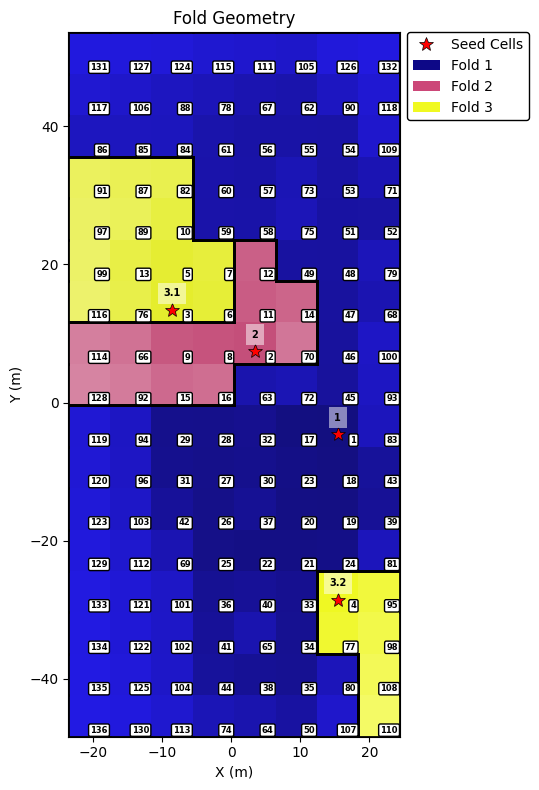

62688.22512748702
{1: {'total_count': 20240.028480866764, 'region_area': 38.0, 'per-category': {'1_WALL': 28.68729780945688, '2_FLOOR': 39.94596586024806, '3_ROOF': 111.86986149174137, '4_CEILING': 19.939469448058407, '5_FOOTPATH': 0, '7_COLUMN': 10.78547297297297, '8_DOOR': 134.23947946594558, '9_WINDOW': 109.54280155642023, '10_STAIR': 58.369833436150536, '11_RAILING': 24.016864518560393, '12_RWP': 120.95637583892616, '13_OTHER': 30.171115173674583}, 'aspect_ratio': 1265.625}, 2: {'total_count': 9338.299505583225, 'region_area': 5.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 3.448519040902678, '4_CEILING': 0, '5_FOOTPATH': 19.18432725480532, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 174.9598393574297}, 'aspect_ratio': 62.5}, 3: {'total_count': 12753.728683769586, 'region_area': 1.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 145.47992330250398, '7_COLUMN': 23.383152173913

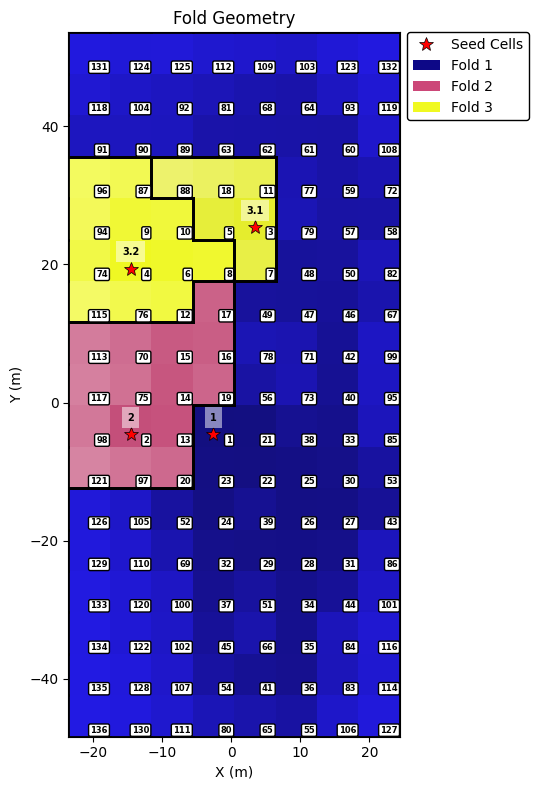

80295.06710159592
{1: {'total_count': 23759.74284532218, 'region_area': 19.0, 'per-category': {'1_WALL': 19.57764527932897, '2_FLOOR': 42.99490236059918, '3_ROOF': 98.06501869547152, '4_CEILING': 29.518633170615555, '5_FOOTPATH': 30.300842774247034, '7_COLUMN': 21.603831891223727, '8_DOOR': 32.50430210325048, '9_WINDOW': 11.710623796117941, '10_STAIR': 19.653926823584257, '11_RAILING': 4.519215499444188, '12_RWP': 0, '13_OTHER': 74.74133699813488}, 'aspect_ratio': 1265.625}, 2: {'total_count': 24334.75790955422, 'region_area': 6.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 39.99999999999998}, 3: {'total_count': 21930.083524771726, 'region_area': 11.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 78.26331967213113, '10_STAIR': 0, '11_RAIL

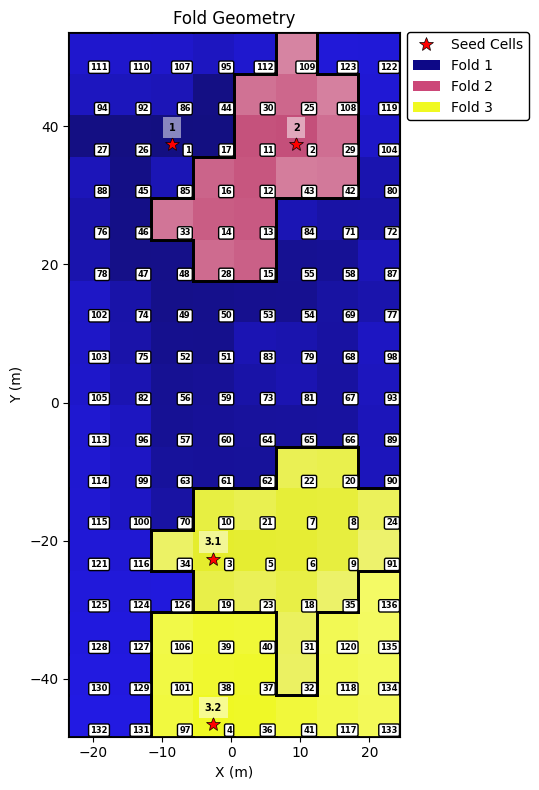

5142656.803617468
{1: {'total_count': 56186.034479654205, 'region_area': 11.0, 'per-category': {'1_WALL': 152.33663805263367, '2_FLOOR': 220.4780820473161, '3_ROOF': 235.6553625909411, '4_CEILING': 373.13282881002084, '5_FOOTPATH': 49.39765238879737, '7_COLUMN': 89.1875, '8_DOOR': 421.4428141459744, '9_WINDOW': 410.4502369668247, '10_STAIR': 478.19256756756755, '11_RAILING': 37.805171691792296, '12_RWP': 854.2753623188406, '13_OTHER': 364.8968399059807}, 'aspect_ratio': 1265.625}, 2: {'total_count': 48671.547392612585, 'region_area': 14.000000000000002, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 27.777777777777803}, 3: {'total_count': 9161.62997217799, 'region_area': 5.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 1000750

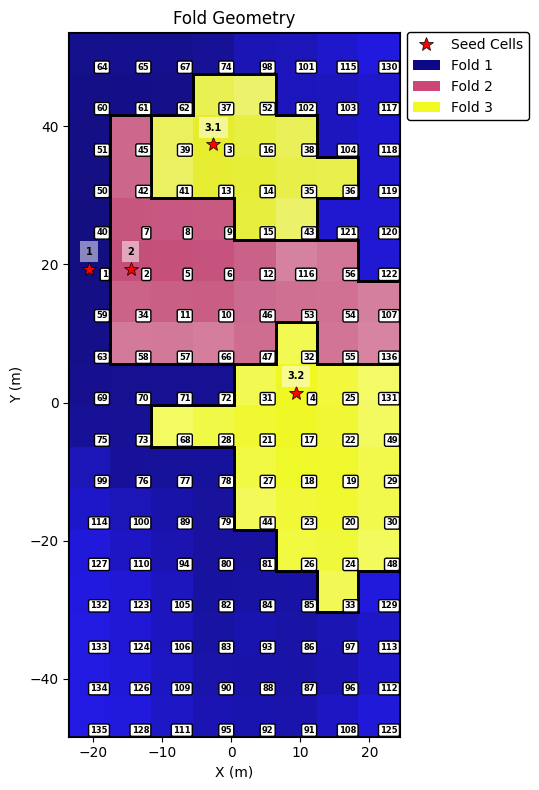

8078510.872829039
{1: {'total_count': 33960.28426209296, 'region_area': 40.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 13414.600247497303, 'region_area': 1.0, 'per-category': {'1_WALL': 358.7854829491332, '2_FLOOR': 227.6243868255081, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 42.894425842032696, '7_COLUMN': 1001000.0, '8_DOOR': 382.420814479638, '9_WINDOW': 289.22818791946304, '10_STAIR': 1001000.0, '11_RAILING': 311.6056910569106, '12_RWP': 1001000.0, '13_OTHER': 211.9134396355353}, 'aspect_ratio': 444.4444444444445}, 3: {'total_count': 12187.622958358756, 'region_area': 2.5, 'per-category': {'1_WALL': 3.5765521334506185, '2_FLOOR': 264.5988985444993, '3_ROOF': 22.10013580369068, '4_CEILING': 335.2254549983472, '5_FOOTPATH': 137.34187568157031, '7_COLUMN': 0, '8_DOOR': 41.

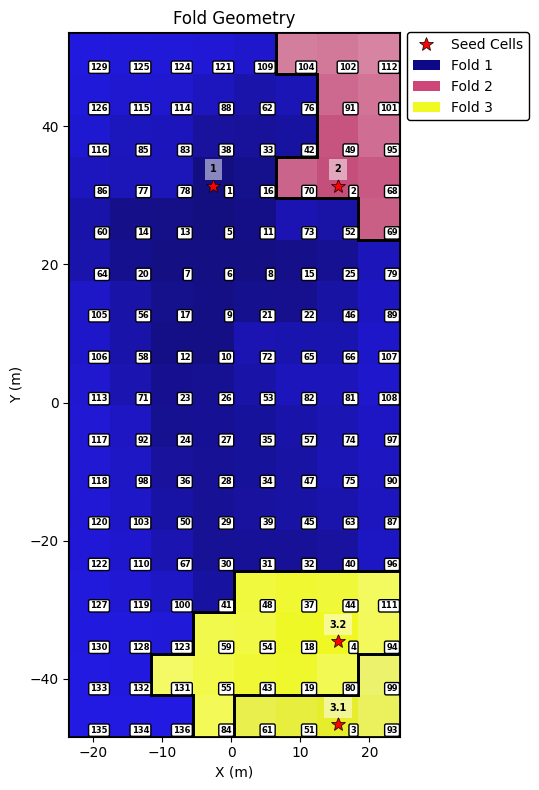

17091076.407664236
{1: {'total_count': 35015.00975245627, 'region_area': 44.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 16936.06870700748, 'region_area': 7.000000000000001, 'per-category': {'1_WALL': 12.817110216082119, '2_FLOOR': 1001000.0, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 18.30701269247863, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 1001000.0, '10_STAIR': 300.96446700507613, '11_RAILING': 540.8544303797469, '12_RWP': 1001000.0, '13_OTHER': 501.5909501245625}, 'aspect_ratio': 4000.0}, 3: {'total_count': 10641.16794383575, 'region_area': 4.5, 'per-category': {'1_WALL': 213.59037242816217, '2_FLOOR': 1000750.0, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 63.46890491212258, '7_COLUMN': 1000750.0, '8_DOOR': 255.38333333333335, '9_WINDOW': 1

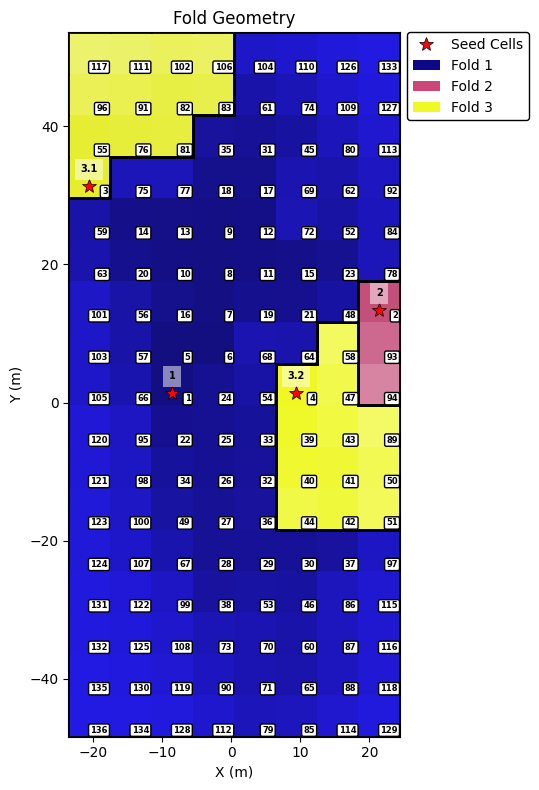

2044265.524681129
{1: {'total_count': 8560.683009762213, 'region_area': 28.999999999999996, 'per-category': {'1_WALL': 8.692834624892377, '2_FLOOR': 16.709424686995927, '3_ROOF': 64.48849913743531, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 5.329229122055667, '8_DOOR': 54.80788562493021, '9_WINDOW': 61.719219219219205, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 30.774577954319756, '13_OTHER': 30.323596163701588}, 'aspect_ratio': 562.5}, 2: {'total_count': 8335.437477234387, 'region_area': 5.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 466.3348946135831, '7_COLUMN': 64.51086956521738, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 30.995024875621898, '11_RAILING': 51.23973114264379, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 250.0}, 3: {'total_count': 2894.1706926269603, 'region_area': 15.5, 'per-category': {'1_WALL': 13.976193481210359, '2_FLOOR': 21.272769195296277, '3_ROOF': 3.0322447223666598, '4_CEILING': 8.006798630596384, '5_FOOTPATH': 0, 

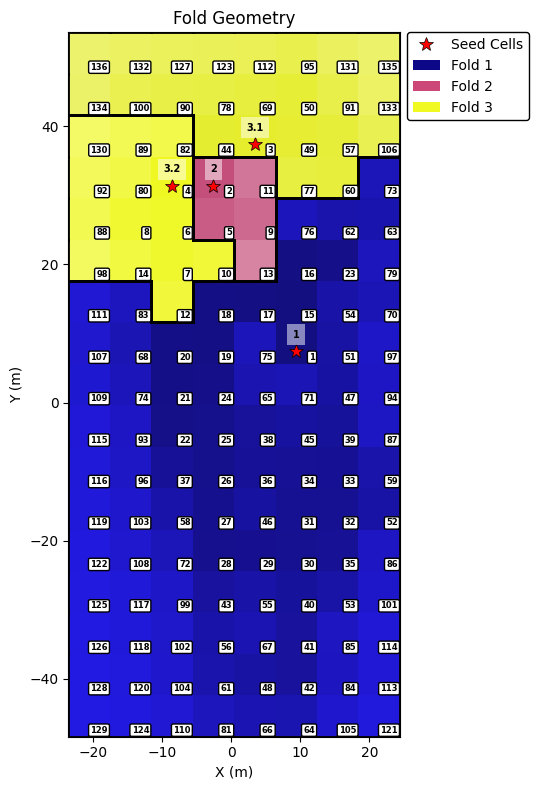

37658.70456550769
{1: {'total_count': 8069.944442618481, 'region_area': 42.0, 'per-category': {'1_WALL': 13.130070430424214, '2_FLOOR': 11.883951253635718, '3_ROOF': 32.195905351696084, '4_CEILING': 1.5768390386015945, '5_FOOTPATH': 0, '7_COLUMN': 2.8515420805018254, '8_DOOR': 37.66338895510528, '9_WINDOW': 40.16266964119724, '10_STAIR': 53.493273542600896, '11_RAILING': 16.457135273821105, '12_RWP': 73.7335092348285, '13_OTHER': 3.3734030197444738}, 'aspect_ratio': 1265.625}, 2: {'total_count': 2101.4864473934163, 'region_area': 2.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 137.10668103448273, '4_CEILING': 18.05727990970654, '5_FOOTPATH': 19.08650689428758, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 238.09876543209876}, 'aspect_ratio': 444.4444444444445}, 3: {'total_count': 18187.595811995412, 'region_area': 5.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0,

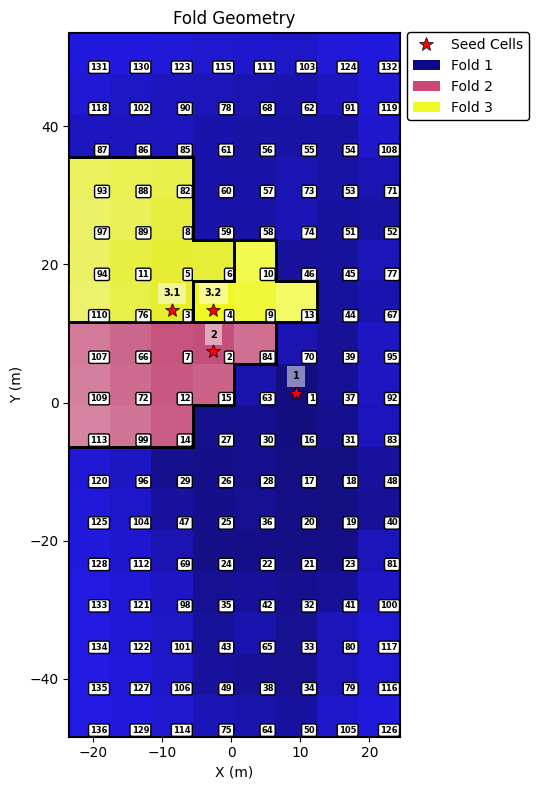

85149.52528421751
{1: {'total_count': 30971.005733546084, 'region_area': 18.0, 'per-category': {'1_WALL': 51.79325743543993, '2_FLOOR': 67.28700662421787, '3_ROOF': 193.65106251924854, '4_CEILING': 22.713089973829078, '5_FOOTPATH': 0, '7_COLUMN': 58.036144578313234, '8_DOOR': 163.64751759558686, '9_WINDOW': 298.48572938689216, '10_STAIR': 14.071317485003334, '11_RAILING': 4.827188022616872, '12_RWP': 240.2842377260982, '13_OTHER': 65.69766359489901}, 'aspect_ratio': 140.625}, 2: {'total_count': 24695.25618705358, 'region_area': 13.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1000.0}, 3: {'total_count': 11385.317074625531, 'region_area': 1.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 123.91203703703701, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, 

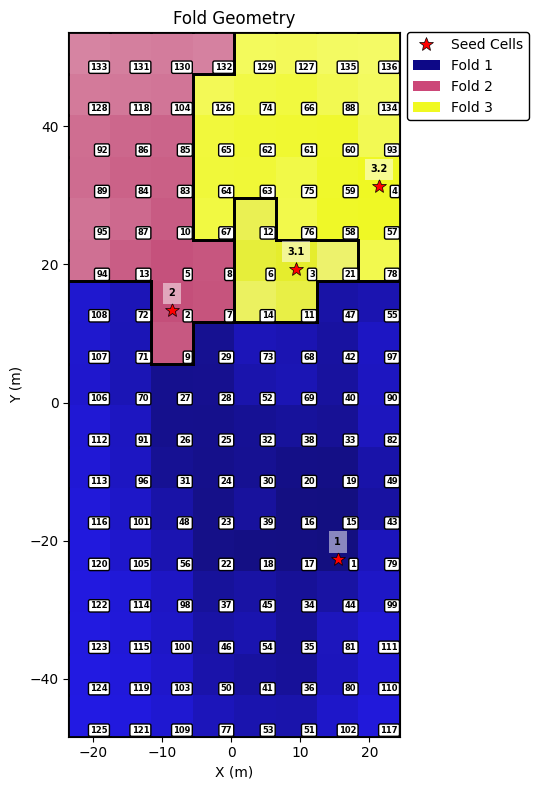

12083535.339082245
{1: {'total_count': 22294.139384002574, 'region_area': 39.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 14341.264206320444, 'region_area': 4.0, 'per-category': {'1_WALL': 362.08673126738944, '2_FLOOR': 268.2990317201831, '3_ROOF': 1001000.0, '4_CEILING': 203.00253641841516, '5_FOOTPATH': 93.3311125916056, '7_COLUMN': 1001000.0, '8_DOOR': 4.119524261179536, '9_WINDOW': 1001000.0, '10_STAIR': 0, '11_RAILING': 83.76588021778586, '12_RWP': 1001000.0, '13_OTHER': 740.0613496932516}, 'aspect_ratio': 0.0}, 3: {'total_count': 12474.955873128549, 'region_area': 0.5, 'per-category': {'1_WALL': 457.27360382597965, '2_FLOOR': 1000750.0, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 1.5634552651240265, '7_COLUMN': 1000750.0, '8_DOOR': 64.50379350860493, '9_WINDOW': 1000750.

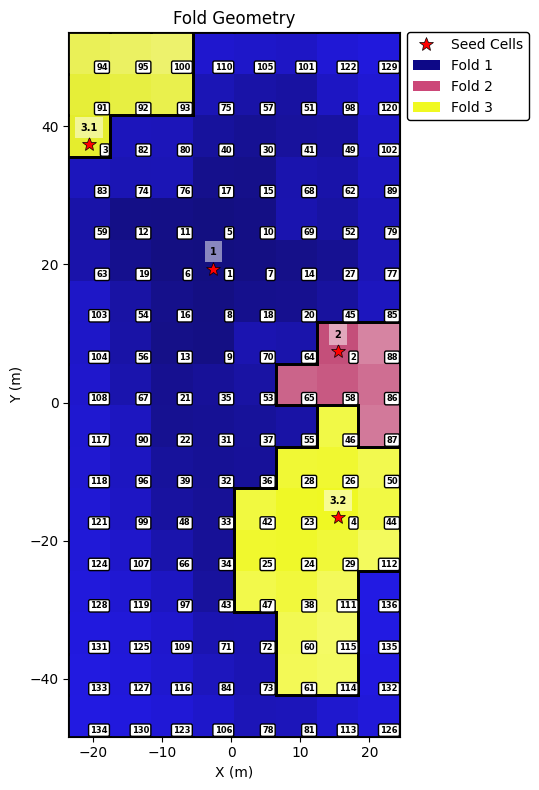

4077071.2077764827
{1: {'total_count': 25577.426744487275, 'region_area': 33.0, 'per-category': {'1_WALL': 21.67696636855832, '2_FLOOR': 55.35402075558508, '3_ROOF': 76.6585350790514, '4_CEILING': 135.59297440117817, '5_FOOTPATH': 2.584134615384608, '7_COLUMN': 0, '8_DOOR': 62.809232937859754, '9_WINDOW': 41.42468580003751, '10_STAIR': 88.41651376146788, '11_RAILING': 0, '12_RWP': 20.705774518790104, '13_OTHER': 112.14277201763795}, 'aspect_ratio': 1265.625}, 2: {'total_count': 10482.471891256553, 'region_area': 2.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 62.5}, 3: {'total_count': 14260.262083128022, 'region_area': 11.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1000750.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1000750.0, '8_DOOR': 0, '9_WINDOW': 1000750.0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 1

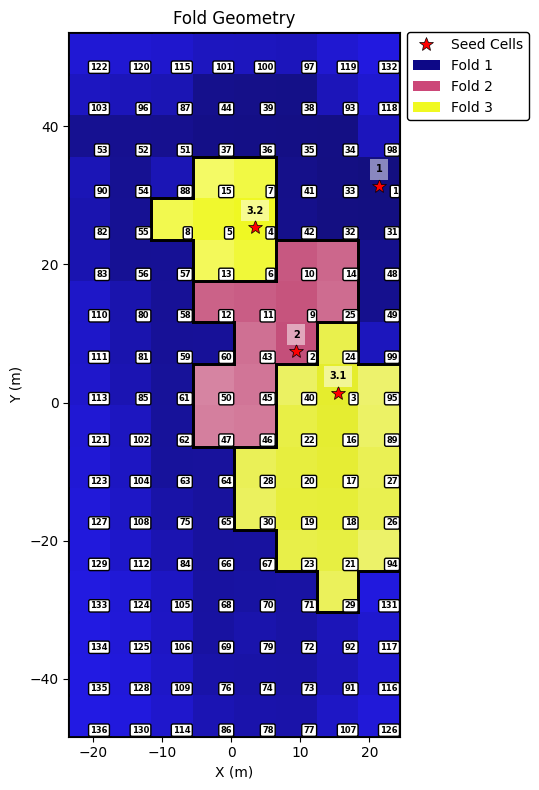

7073949.670588359
{1: {'total_count': 10400.520407587504, 'region_area': 43.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 34.56531965940632, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 14.99415546464055, '8_DOOR': 4.492988540410146, '9_WINDOW': 11.167059864346784, '10_STAIR': 2.054263565891465, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 14.7113030029643}, 'aspect_ratio': 1265.625}, 2: {'total_count': 29182.52036031082, 'region_area': 10.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 0.0}, 3: {'total_count': 12858.983943476816, 'region_area': 6.5, 'per-category': {'1_WALL': 2.6470664348897204, '2_FLOOR': 116.924714603094, '3_ROOF': 1000750.0, '4_CEILING': 247.08942191067246, '5_FOOTPATH': 14.598407124130066, '7_COLUMN': 1000750.0, '8_DOOR': 50.25353254416243, '9_WINDOW': 1000750.0, '10_STAIR': 532.9381927340015, 

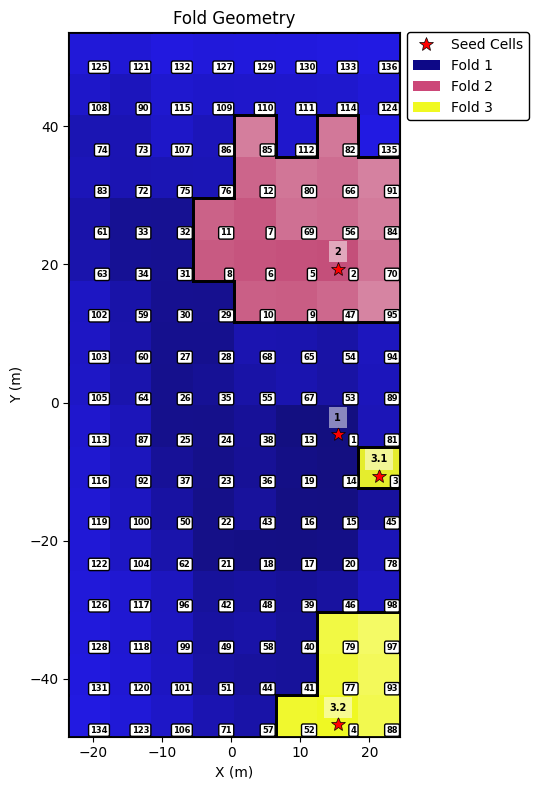

4110251.8752275435
{1: {'total_count': 40853.25014136791, 'region_area': 8.0, 'per-category': {'1_WALL': 60.35848196449242, '2_FLOOR': 109.39020188796252, '3_ROOF': 108.04822168885009, '4_CEILING': 132.71017841098706, '5_FOOTPATH': 44.16127848855872, '7_COLUMN': 27.51458198314971, '8_DOOR': 137.65346364883402, '9_WINDOW': 101.91081949651849, '10_STAIR': 100.71735731039874, '11_RAILING': 10.679811653914063, '12_RWP': 116.9522240527183, '13_OTHER': 102.58222373961536}, 'aspect_ratio': 1265.625}, 2: {'total_count': 21993.35490776496, 'region_area': 19.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 225.06172839506172, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 0.0}, 3: {'total_count': 25541.52444814452, 'region_area': 6.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11

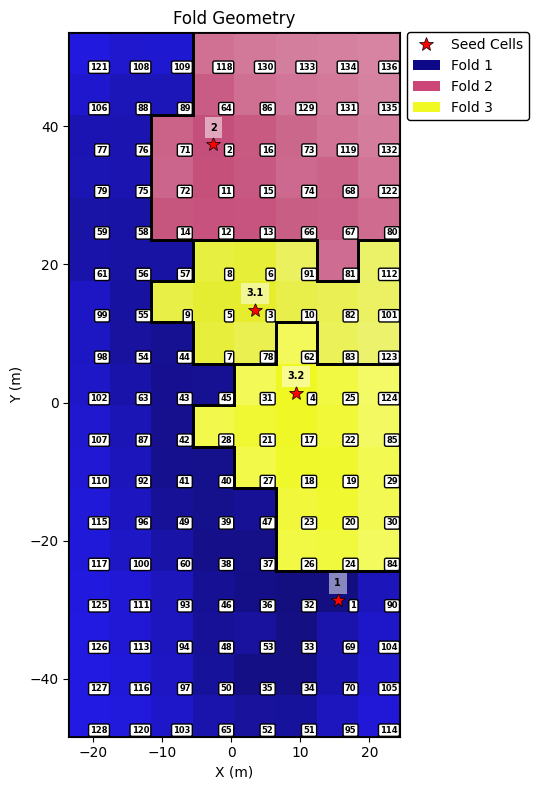

96425.20908463723
{1: {'total_count': 32691.92682029573, 'region_area': 23.0, 'per-category': {'1_WALL': 44.73015205240701, '2_FLOOR': 72.25908850427027, '3_ROOF': 95.13302408076952, '4_CEILING': 46.10726085905391, '5_FOOTPATH': 18.23997342126049, '7_COLUMN': 44.77924944812362, '8_DOOR': 120.03413240196856, '9_WINDOW': 98.03913842920937, '10_STAIR': 251.18673050615595, '11_RAILING': 28.283305720689995, '12_RWP': 116.23973727422002, '13_OTHER': 37.501158659045274}, 'aspect_ratio': 1265.625}, 2: {'total_count': 10910.045337637679, 'region_area': 15.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 20.964815832875207, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 7111.11111111111}, 3: {'total_count': 18357.58262350349, 'region_area': 3.5000000000000004, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WIND

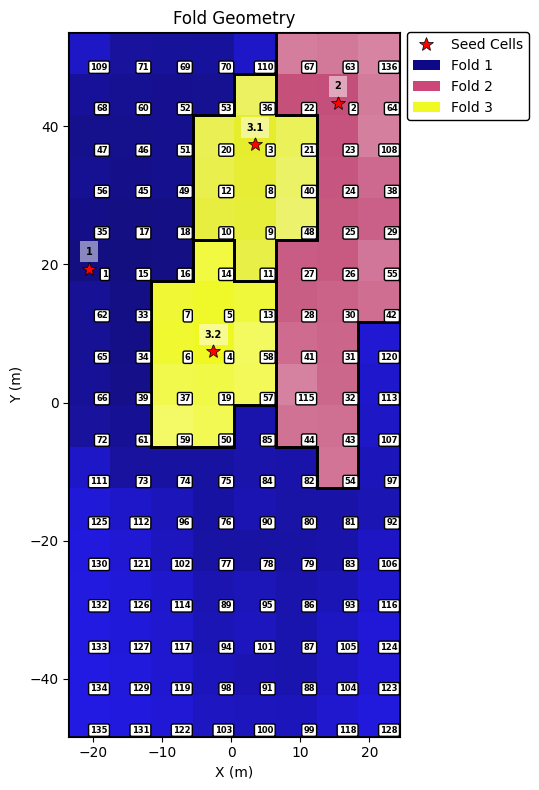

9068163.53488377
{1: {'total_count': 8228.668682045009, 'region_area': 41.0, 'per-category': {'1_WALL': 1.398063126528372, '2_FLOOR': 18.4179147128736, '3_ROOF': 94.48293445743812, '4_CEILING': 9.274434957307886, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 12.262676170419565, '9_WINDOW': 7.001845018450173, '10_STAIR': 10.48741123305358, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 22.12472557628979}, 'aspect_ratio': 1265.625}, 2: {'total_count': 17566.547469259483, 'region_area': 2.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 182.6158940397351, '7_COLUMN': 31.608695652173914, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 0.0}, 3: {'total_count': 13457.874146468552, 'region_area': 6.5, 'per-category': {'1_WALL': 117.8000115782367, '2_FLOOR': 1000750.0, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 183.21353940335425, '7_COLUMN': 1000750.0, '8_DOOR': 1000750.0, '9_WINDOW': 1000

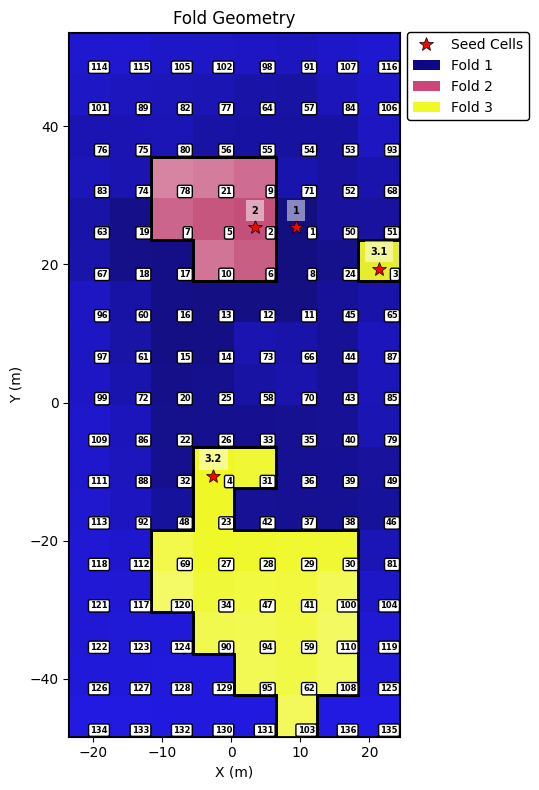

5245487.050801541
{1: {'total_count': 82928.67332407544, 'region_area': 46.0, 'per-category': {'1_WALL': 1727.669157569035, '2_FLOOR': 2148.246609124538, '3_ROOF': 1006500.0, '4_CEILING': 1006500.0, '5_FOOTPATH': 1128.177497069931, '7_COLUMN': 1006500.0, '8_DOOR': 2202.3172757475086, '9_WINDOW': 4926.233333333334, '10_STAIR': 1006500.0, '11_RAILING': 3.2898504579293606, '12_RWP': 1006500.0, '13_OTHER': 2948.099315068493}, 'aspect_ratio': 2777.7777777777774}, 2: {'total_count': 50662.495195219286, 'region_area': 60.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 765.625}, 3: {'total_count': 34607.413223553944, 'region_area': 15.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'as

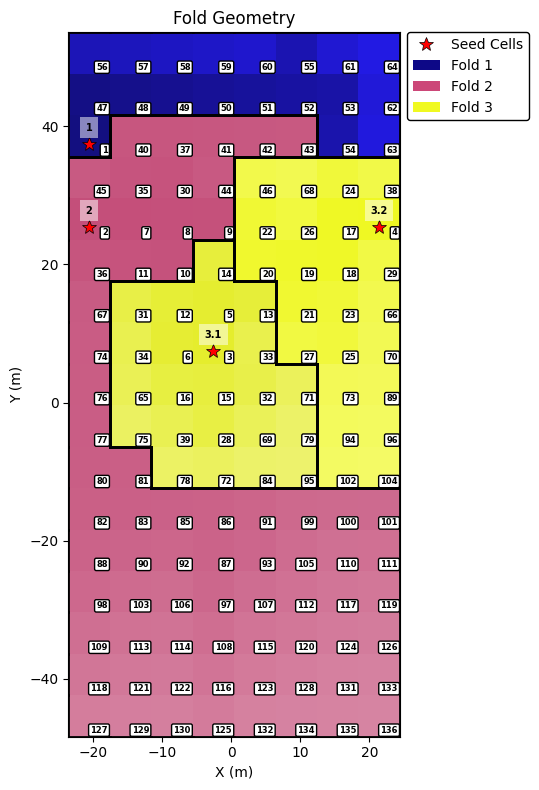

13087311.022799628
{1: {'total_count': 17696.047363883907, 'region_area': 14.000000000000002, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 6.694741724551431, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 390.625}, 2: {'total_count': 14620.093872814592, 'region_area': 14.000000000000002, 'per-category': {'1_WALL': 334.6083739397221, '2_FLOOR': 932.4496021547513, '3_ROOF': 661.2018028752879, '4_CEILING': 919.6775945562052, '5_FOOTPATH': 147.8561667236078, '7_COLUMN': 131.06870229007635, '8_DOOR': 1001000.0, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 0, '12_RWP': 1001000.0, '13_OTHER': 1001000.0}, 'aspect_ratio': 360.0000000000001}, 3: {'total_count': 25127.020466710834, 'region_area': 21.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_

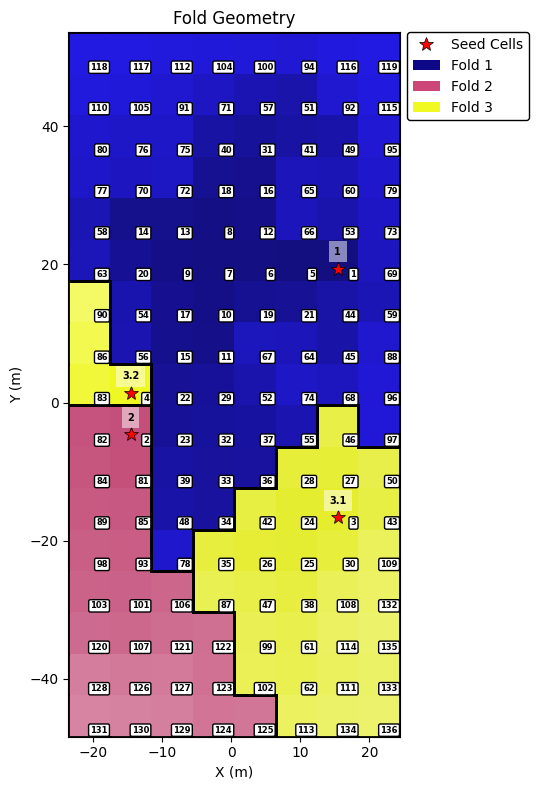

4197345.115488289
{1: {'total_count': 75965.05806436, 'region_area': 28.999999999999996, 'per-category': {'1_WALL': 690.1202614709, '2_FLOOR': 1004.3779527559055, '3_ROOF': 235.6553625909411, '4_CEILING': 3198.4445118253484, '5_FOOTPATH': 275.2506664544623, '7_COLUMN': 137.62681159420288, '8_DOOR': 3707.6785714285716, '9_WINDOW': 766.5919540229885, '10_STAIR': 887.3750000000001, '11_RAILING': 376.7529880478089, '12_RWP': 854.2753623188406, '13_OTHER': 942.8178090216753}, 'aspect_ratio': 0.0}, 2: {'total_count': 65.53628761231893, 'region_area': 2.0, 'per-category': {'1_WALL': 9.260906059299936, '2_FLOOR': 0, '3_ROOF': 1001000.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1001000.0, '8_DOOR': 147.65389082462255, '9_WINDOW': 1001000.0, '10_STAIR': 146.84375, '11_RAILING': 0, '12_RWP': 1001000.0, '13_OTHER': 0}, 'aspect_ratio': 444.4444444444445}, 3: {'total_count': 63069.82760939, 'region_area': 37.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH'

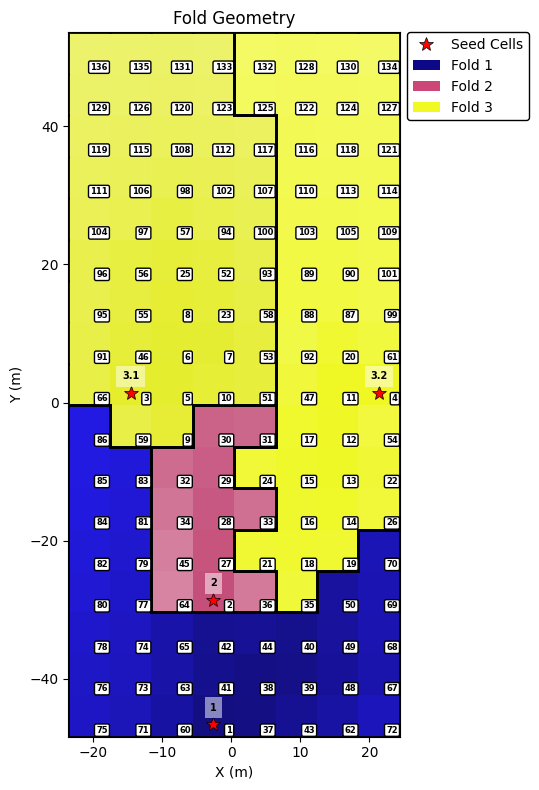

4082541.2593727894
{1: {'total_count': 25968.73269830745, 'region_area': 33.0, 'per-category': {'1_WALL': 40.37182263712711, '2_FLOOR': 53.49946120689656, '3_ROOF': 120.88455598455594, '4_CEILING': 38.298329476976264, '5_FOOTPATH': 0, '7_COLUMN': 7.165032679738563, '8_DOOR': 136.23572524288394, '9_WINDOW': 108.44207907105336, '10_STAIR': 74.45973496432214, '11_RAILING': 33.74466571834992, '12_RWP': 74.6551724137931, '13_OTHER': 34.032828853249015}, 'aspect_ratio': 1265.625}, 2: {'total_count': 37974.445054410695, 'region_area': 6.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 42.33372572101236, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 250.0}, 3: {'total_count': 7154.587655005092, 'region_area': 4.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 77.83001077586205, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_R

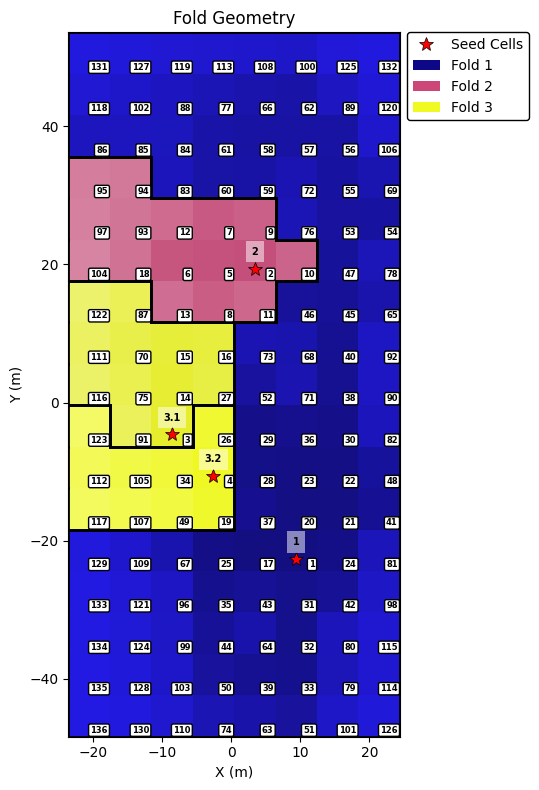

16083639.463713596
{1: {'total_count': 37907.065487454944, 'region_area': 55.00000000000001, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 17034.05099128223, 'region_area': 9.0, 'per-category': {'1_WALL': 12.817110216082119, '2_FLOOR': 1001000.0, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 80.22137259967863, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 2.1329044438179645, '12_RWP': 1001000.0, '13_OTHER': 501.5909501245625}, 'aspect_ratio': 0.0}, 3: {'total_count': 8711.253218898017, 'region_area': 0.5, 'per-category': {'1_WALL': 188.4951281846498, '2_FLOOR': 475.7635467980295, '3_ROOF': 1000750.0, '4_CEILING': 112.09614734707671, '5_FOOTPATH': 7.1075295275590475, '7_COLUMN': 1000750.0, '8_DOOR': 436.6526845637584, '9_WINDO

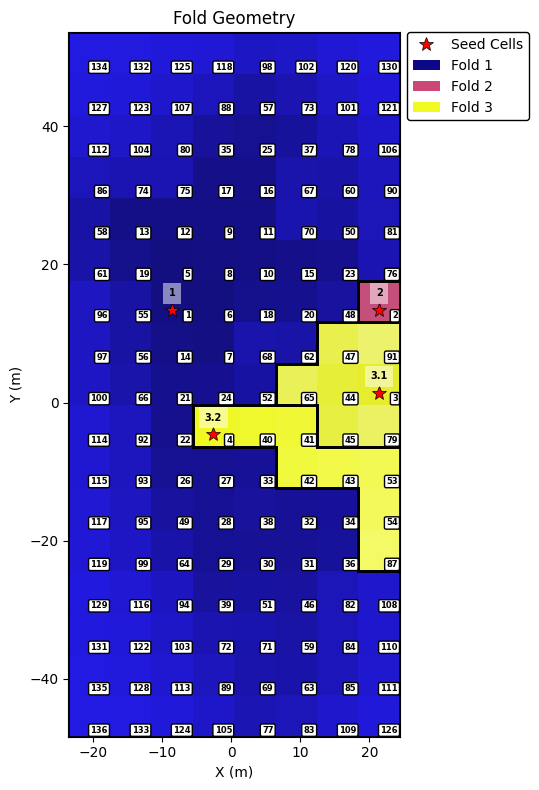

13086690.454349035
{1: {'total_count': 23060.455583055005, 'region_area': 38.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 12527.638976942162, 'region_area': 1.0, 'per-category': {'1_WALL': 266.56747088819543, '2_FLOOR': 116.61158301158298, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 37.77893837242428, '7_COLUMN': 1001000.0, '8_DOOR': 160.03658536585365, '9_WINDOW': 289.22818791946304, '10_STAIR': 1001000.0, '11_RAILING': 348.0309734513275, '12_RWP': 1001000.0, '13_OTHER': 211.9134396355353}, 'aspect_ratio': 444.4444444444445}, 3: {'total_count': 13163.573209052742, 'region_area': 5.5, 'per-category': {'1_WALL': 11.417366621191517, '2_FLOOR': 1000750.0, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 46.7439027070645, '7_COLUMN': 1000750.0, '8_DOOR': 1000750.0, '9_WI

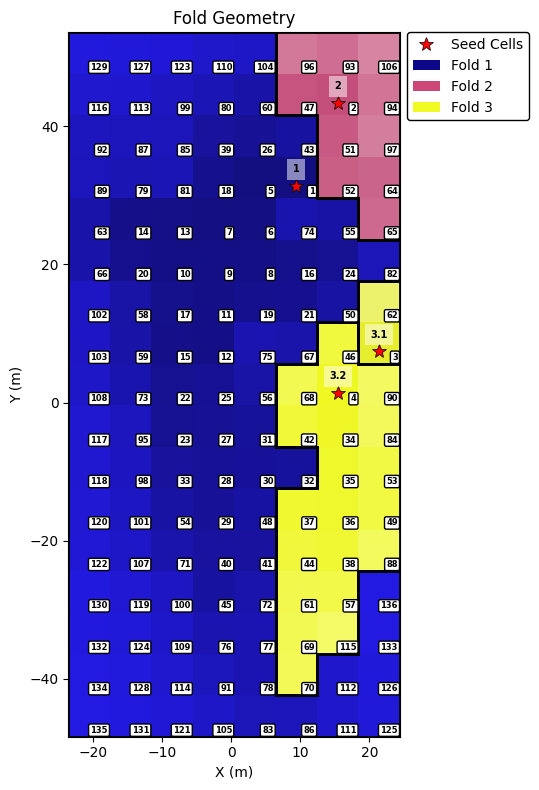

169327.7638107071
{1: {'total_count': 66100.58428031176, 'region_area': 17.0, 'per-category': {'1_WALL': 216.77724710858374, '2_FLOOR': 393.0312043696933, '3_ROOF': 526.4684625492773, '4_CEILING': 469.0066952610106, '5_FOOTPATH': 271.8037924781204, '7_COLUMN': 307.36024844720504, '8_DOOR': 377.10671256454384, '9_WINDOW': 249.04398148148144, '10_STAIR': 2142.07423580786, '11_RAILING': 97.1712103055722, '12_RWP': 235.08905852417297, '13_OTHER': 341.38110587651875}, 'aspect_ratio': 5760.0}, 2: {'total_count': 40436.55173840745, 'region_area': 26.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 27.777777777777803}, 3: {'total_count': 31705.983663382696, 'region_area': 19.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILI

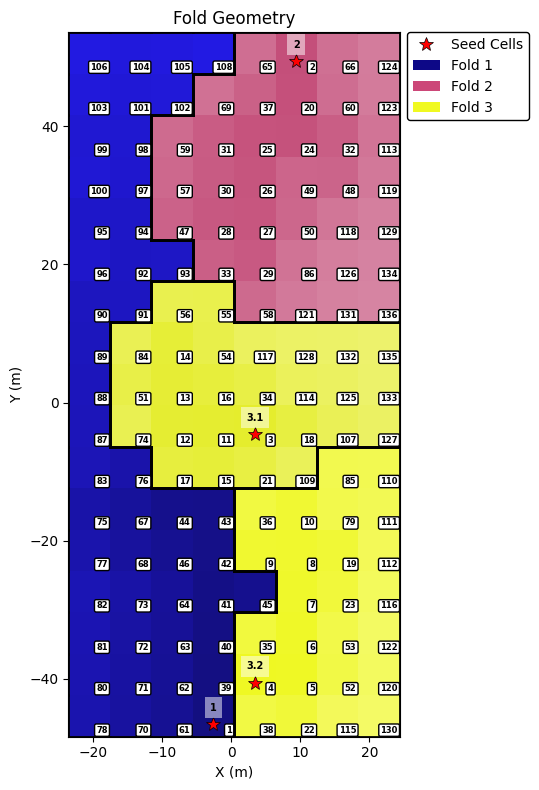

14078708.60522139
{1: {'total_count': 20508.853294673994, 'region_area': 37.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 2.9178733199673377, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 562.5}, 2: {'total_count': 10683.44016981289, 'region_area': 3.0, 'per-category': {'1_WALL': 166.9658001219445, '2_FLOOR': 75.05741387918123, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 0, '7_COLUMN': 1001000.0, '8_DOOR': 160.03658536585365, '9_WINDOW': 289.22818791946304, '10_STAIR': 1001000.0, '11_RAILING': 236.95507487520803, '12_RWP': 1001000.0, '13_OTHER': 151.47842056932967}, 'aspect_ratio': 444.4444444444445}, 3: {'total_count': 17920.767458113205, 'region_area': 3.5000000000000004, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OT

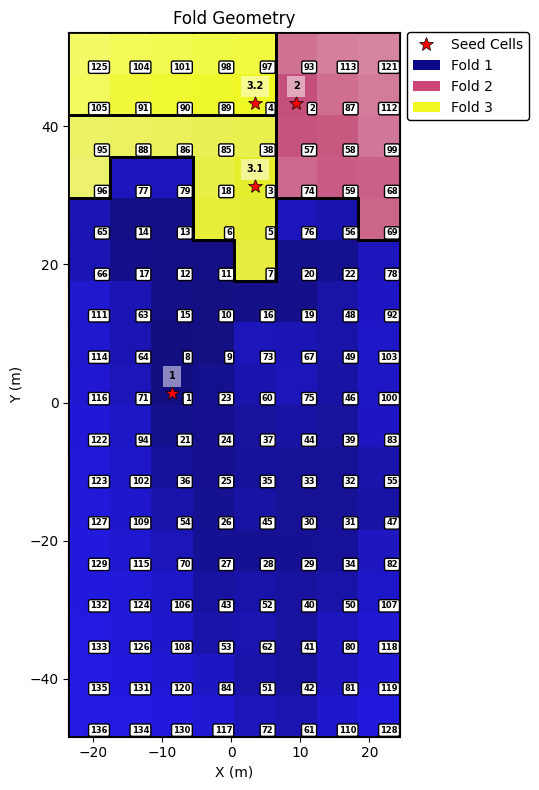

10079970.094392365
{1: {'total_count': 20999.099564126864, 'region_area': 27.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 1.714533767606395, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 16882.234972006318, 'region_area': 1.0, 'per-category': {'1_WALL': 6.830880199442944, '2_FLOOR': 1001000.0, '3_ROOF': 1001000.0, '4_CEILING': 1001000.0, '5_FOOTPATH': 2.15986553744373, '7_COLUMN': 1001000.0, '8_DOOR': 1001000.0, '9_WINDOW': 1001000.0, '10_STAIR': 1001000.0, '11_RAILING': 1001000.0, '12_RWP': 1001000.0, '13_OTHER': 1001000.0}, 'aspect_ratio': 2250.0}, 3: {'total_count': 18452.984256396212, 'region_area': 10.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 78.26331967213113, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 47.524271844660184, '13_OTHER': 0}, 'aspect

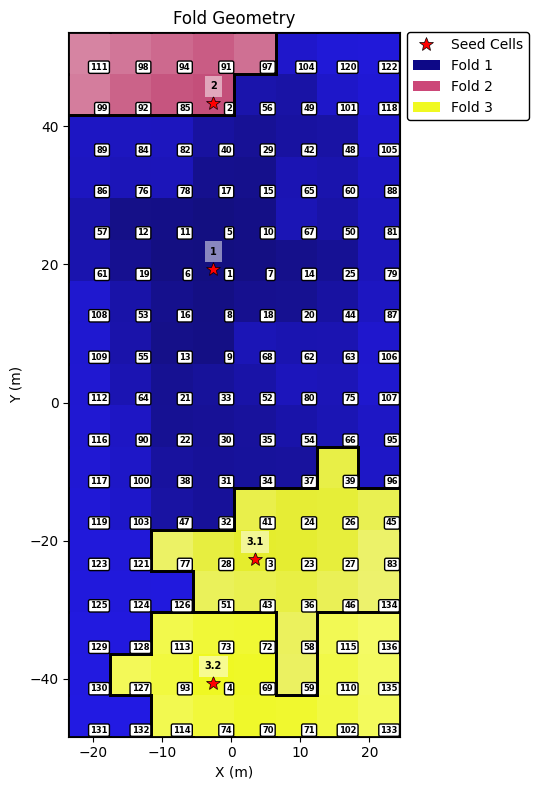

17121679.519060664
{1: {'total_count': 45814.563787968225, 'region_area': 37.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 15790.370102958173, 'region_area': 5.0, 'per-category': {'1_WALL': 508.6604322001769, '2_FLOOR': 125.55925593349829, '3_ROOF': 1001000.0, '4_CEILING': 256.297840759889, '5_FOOTPATH': 571.7361111111111, '7_COLUMN': 1001000.0, '8_DOOR': 60.16873601314941, '9_WINDOW': 1001000.0, '10_STAIR': 292.9850746268657, '11_RAILING': 486.98550724637676, '12_RWP': 1001000.0, '13_OTHER': 372.1724137931034}, 'aspect_ratio': 16000.0}, 3: {'total_count': 11255.696453829009, 'region_area': 12.5, 'per-category': {'1_WALL': 291.7838937093276, '2_FLOOR': 618.6701939749407, '3_ROOF': 503.4617897138998, '4_CEILING': 691.86087179626, '5_FOOTPATH': 158.05371116907753, '7_COLUMN': 73.30152671755725,

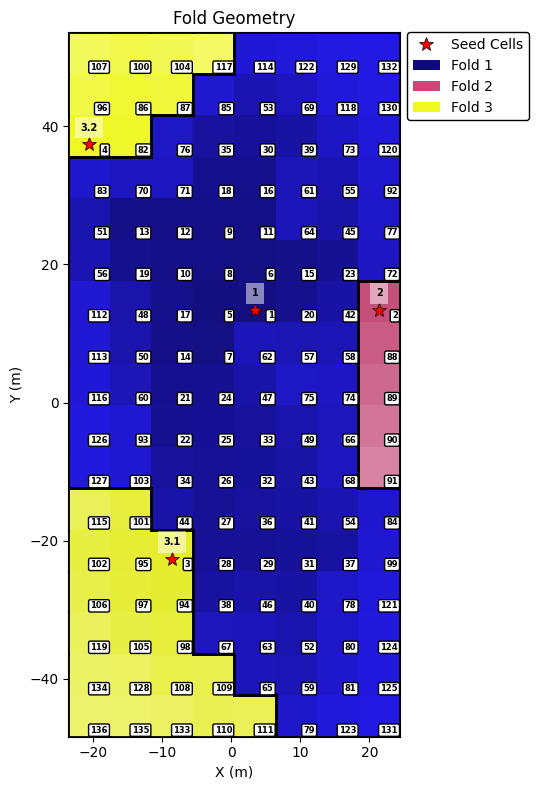

17068290.272688556
{1: {'total_count': 27939.229710339765, 'region_area': 34.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 4227.220435376141, 'region_area': 7.000000000000001, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1001000.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1001000.0, '8_DOOR': 43.203492276695776, '9_WINDOW': 1001000.0, '10_STAIR': 0, '11_RAILING': 20.82935560859187, '12_RWP': 1001000.0, '13_OTHER': 0}, 'aspect_ratio': 1777.777777777778}, 3: {'total_count': 12426.987796800899, 'region_area': 6.5, 'per-category': {'1_WALL': 30.914312450001468, '2_FLOOR': 488.9809630459127, '3_ROOF': 1000750.0, '4_CEILING': 140.7336018411968, '5_FOOTPATH': 1000750.0, '7_COLUMN': 1000750.0, '8_DOOR': 1000750.0, '9_WINDOW': 1000750.0, '10_STAIR': 1000750.0, '11_RAILING': 1000750.0, '12

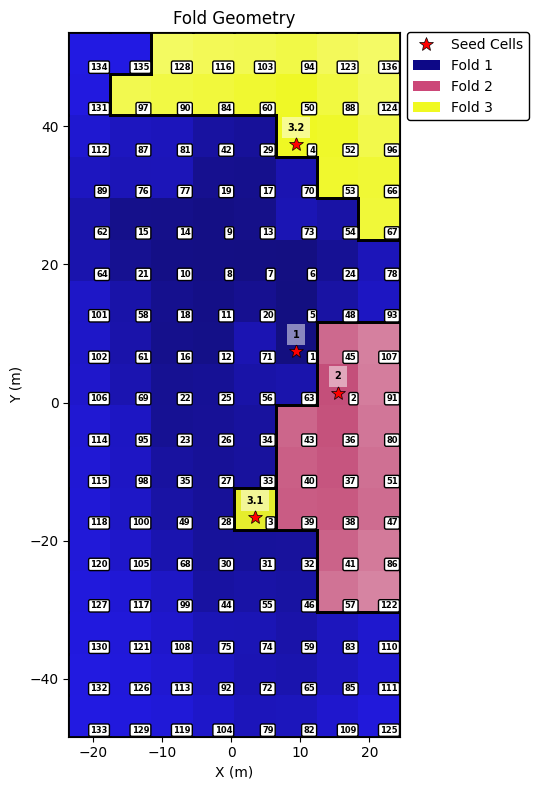

3048640.616334958
{1: {'total_count': 949.4054754131016, 'region_area': 34.0, 'per-category': {'1_WALL': 2.77856387763544, '2_FLOOR': 0, '3_ROOF': 2.3235557145412264, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 18.5985533453888, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 6.774415963659962, '12_RWP': 6.5453074433656955, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 9341.517044666001, 'region_area': 10.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 211.73976608187135, '9_WINDOW': 40.42372881355932, '10_STAIR': 15.482456140350868, '11_RAILING': 0, '12_RWP': 46.81159420289855, '13_OTHER': 0}, 'aspect_ratio': 39.99999999999998}, 3: {'total_count': 12651.257371893622, 'region_area': 1.5, 'per-category': {'1_WALL': 20.105684746370244, '2_FLOOR': 282.94382540448356, '3_ROOF': 28.1141637614304, '4_CEILING': 363.27784176220183, '5_FOOTPATH': 209.1512784090909, '7_COLUMN': 0, '8_DOOR': 41.6831794

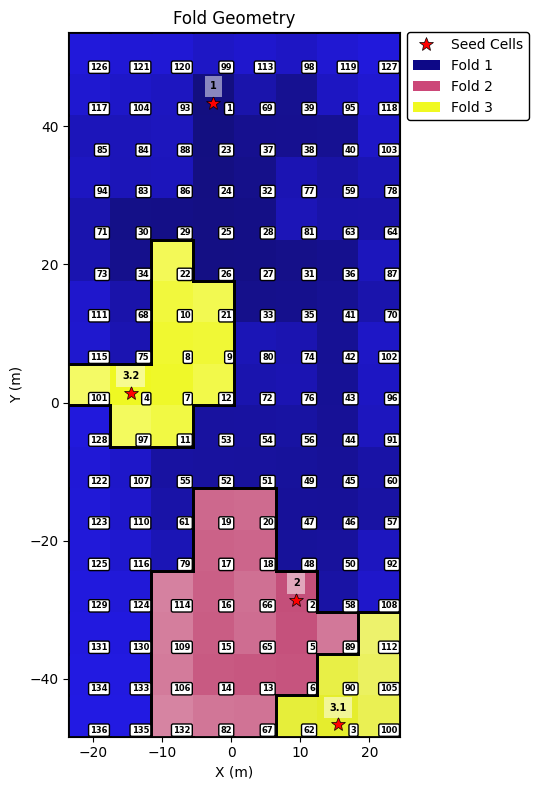

18094829.82937222
{1: {'total_count': 28449.378568674685, 'region_area': 42.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 13120.257391791063, 'region_area': 7.000000000000001, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 1001000.0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 1001000.0, '8_DOOR': 2.072762087123029, '9_WINDOW': 598.734939759036, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 1001000.0, '13_OTHER': 0}, 'aspect_ratio': 39.99999999999998}, 3: {'total_count': 13754.839584789455, 'region_area': 1.5, 'per-category': {'1_WALL': 641.9409929982232, '2_FLOOR': 1000750.0, '3_ROOF': 1000750.0, '4_CEILING': 1000750.0, '5_FOOTPATH': 686.5366364531187, '7_COLUMN': 1000750.0, '8_DOOR': 1000750.0, '9_WINDOW': 1000750.0, '10_STAIR': 1000750.0, '11_RAILING': 96.00199790782746, '12_RWP': 1000

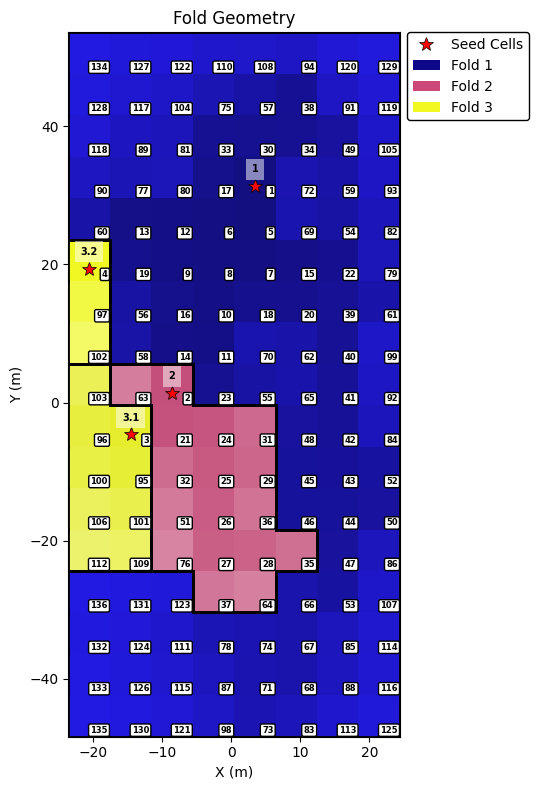

3150277.074159849
{1: {'total_count': 60111.83896828222, 'region_area': 11.0, 'per-category': {'1_WALL': 210.84821073953447, '2_FLOOR': 307.24738675958184, '3_ROOF': 209.8077547925918, '4_CEILING': 193.64222858068354, '5_FOOTPATH': 74.02297259894827, '7_COLUMN': 91.58227848101265, '8_DOOR': 1230.129558541267, '9_WINDOW': 504.11458333333326, '10_STAIR': 111.37710992177853, '11_RAILING': 73.77095709570955, '12_RWP': 350.99315068493155, '13_OTHER': 289.77227939566455}, 'aspect_ratio': 250.0}, 2: {'total_count': 42844.2505740871, 'region_area': 35.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 20.408163265306104}, 3: {'total_count': 28459.962177711936, 'region_area': 15.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAIL

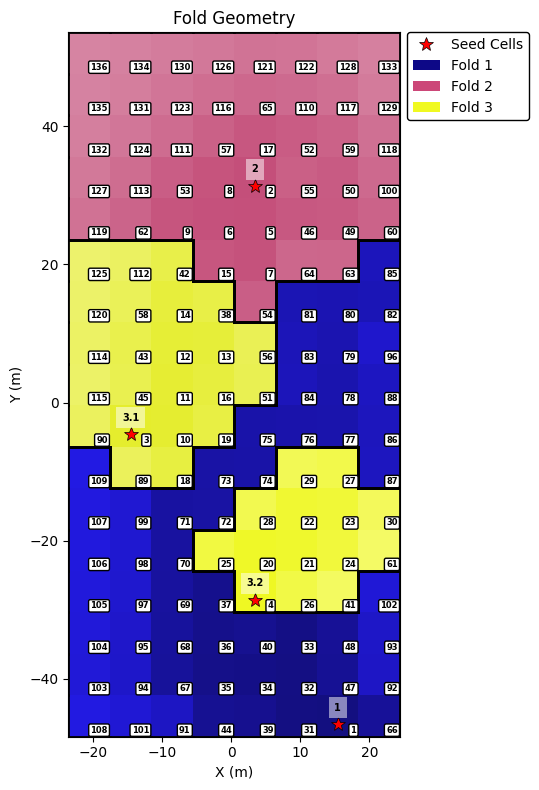

113189.33719285892
{1: {'total_count': 43540.83685444464, 'region_area': 19.0, 'per-category': {'1_WALL': 71.22808792723414, '2_FLOOR': 125.70968780173804, '3_ROOF': 349.0510204081633, '4_CEILING': 145.5369718309859, '5_FOOTPATH': 31.07774735583939, '7_COLUMN': 42.16401734104045, '8_DOOR': 137.61272072689863, '9_WINDOW': 163.9828431372549, '10_STAIR': 37.02562049639711, '11_RAILING': 7.700458190148904, '12_RWP': 95.09629629629626, '13_OTHER': 246.38840241292078}, 'aspect_ratio': 1265.625}, 2: {'total_count': 15026.673632436527, 'region_area': 9.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 6.143112206352806, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 27.777777777777803}, 3: {'total_count': 28491.53845531493, 'region_area': 6.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAI

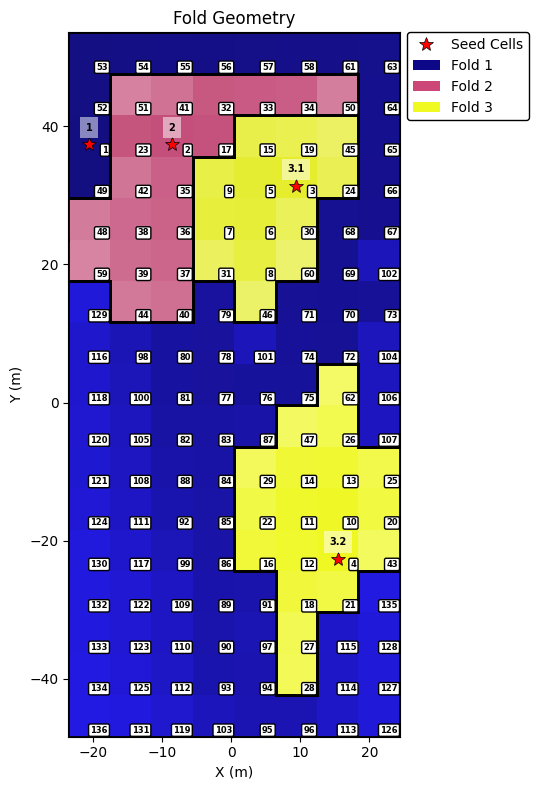

9121968.152107015
{1: {'total_count': 27205.65331301661, 'region_area': 30.0, 'per-category': {'1_WALL': 42.99875300329791, '2_FLOOR': 53.95568765198594, '3_ROOF': 193.65106251924854, '4_CEILING': 22.713089973829078, '5_FOOTPATH': 0, '7_COLUMN': 58.036144578313234, '8_DOOR': 130.7683982683983, '9_WINDOW': 244.2625570776256, '10_STAIR': 14.071317485003334, '11_RAILING': 0, '12_RWP': 240.2842377260982, '13_OTHER': 55.24943310657595}, 'aspect_ratio': 1265.625}, 2: {'total_count': 32362.463288803014, 'region_area': 14.000000000000002, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 27.777777777777803}, 3: {'total_count': 22799.60292878993, 'region_area': 4.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP':

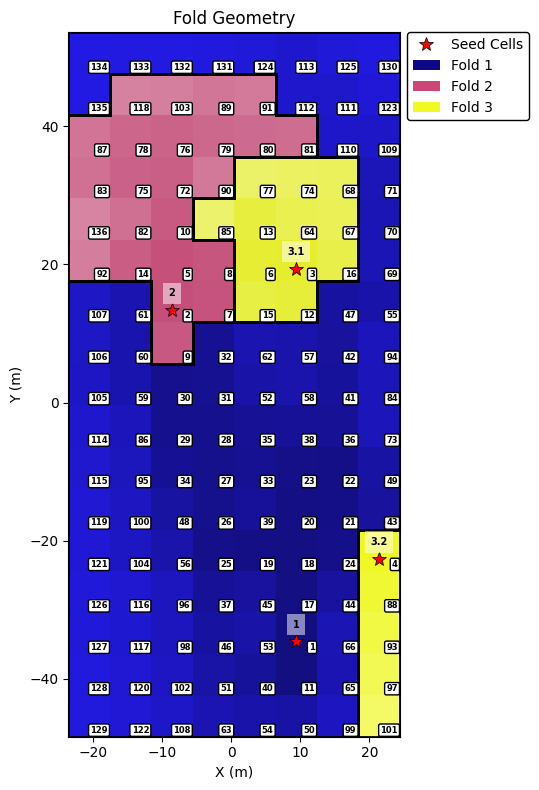

8071333.455643252
{1: {'total_count': 10602.111874814831, 'region_area': 30.0, 'per-category': {'1_WALL': 8.729452256995685, '2_FLOOR': 11.612737356300748, '3_ROOF': 20.770740975300825, '4_CEILING': 3.311331864458287, '5_FOOTPATH': 11.363770546004172, '7_COLUMN': 20.265892420537877, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 66.21398510844934, '11_RAILING': 18.790271636133912, '12_RWP': 5.775100401606427, '13_OTHER': 0}, 'aspect_ratio': 1265.625}, 2: {'total_count': 20853.628626971447, 'region_area': 6.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 0.0}, 3: {'total_count': 12699.716246302345, 'region_area': 1.5, 'per-category': {'1_WALL': 4.604462413537089, '2_FLOOR': 4.072488990160206, '3_ROOF': 1000750.0, '4_CEILING': 93.87401828003874, '5_FOOTPATH': 514.4621682665162, '7_COLUMN': 1000750.0, '8_DOOR': 1000750.0, '9_WINDOW':

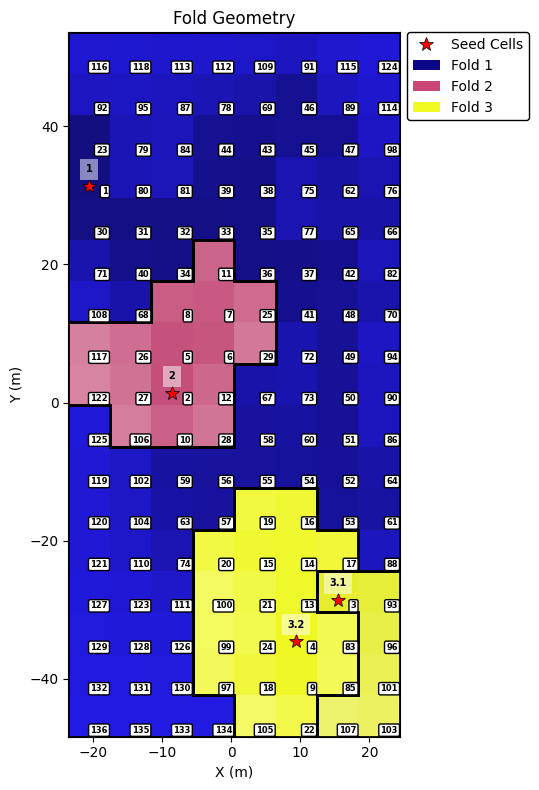

113889.81378094808
{1: {'total_count': 44109.07924480604, 'region_area': 2.0, 'per-category': {'1_WALL': 101.31403970188218, '2_FLOOR': 101.14820289919028, '3_ROOF': 235.6553625909411, '4_CEILING': 44.42737652681892, '5_FOOTPATH': 20.398491057408755, '7_COLUMN': 137.05421686746988, '8_DOOR': 283.29507743362836, '9_WINDOW': 644.2596248766041, '10_STAIR': 113.75312239800168, '11_RAILING': 61.82874354561101, '12_RWP': 854.2753623188406, '13_OTHER': 84.17899637868597}, 'aspect_ratio': 62.5}, 2: {'total_count': 12942.376130420196, 'region_area': 9.0, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 0, '11_RAILING': 0, '12_RWP': 0, '13_OTHER': 0}, 'aspect_ratio': 562.5}, 3: {'total_count': 20415.082098290834, 'region_area': 26.5, 'per-category': {'1_WALL': 0, '2_FLOOR': 0, '3_ROOF': 0, '4_CEILING': 0, '5_FOOTPATH': 0, '7_COLUMN': 0, '8_DOOR': 0, '9_WINDOW': 0, '10_STAIR': 112.33870967741935, '11_R

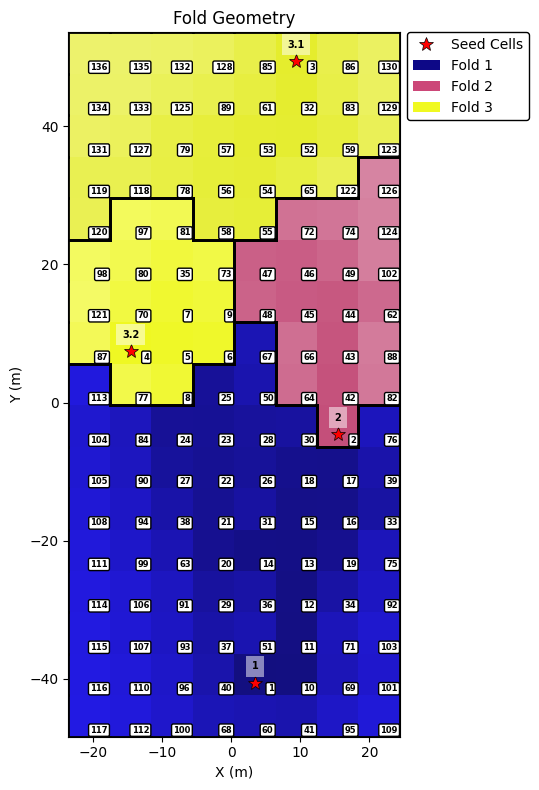

In [134]:
for c in grid_splitter.all_configurations:
    print(c.equality_score)
    print(c.equality_breakdown)
    c.plot()
    

In [108]:
# # Process the folds and get the rectangles
# fold_rectangles = process_folds(best_config.grid)

In [110]:
# fold_meshes = crop_meshes_per_fold(
#     dh.extracted_meshes,
#     loaded_data['fold_rectangles'],
#     loaded_data['x_edges'],
#     loaded_data['y_edges']
# )

In [109]:
# plot_mesh_folds(fold_meshes)

In [27]:
# fold_name_map = {
#     1: 'train',
#     2: 'test',
#     3: 'eval',
# }

# fold_meshes_2 = {fold_name_map[k]: v for k, v in fold_meshes.items()}

In [111]:
# save_splits(dh, fold_meshes_2)

In [112]:
# dh.generate_and_save_fold_clouds(resolution=0.02, poisson_radius=0.05, save_all_formats=True)